In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Block(nn.Module):
    '''Grouped convolution block.'''
    expansion = 2

    def __init__(self, in_planes, cardinality=32, bottleneck_width=4, stride=1):
        super(Block, self).__init__()
        group_width = cardinality * bottleneck_width
        self.conv1 = nn.Conv2d(in_planes, group_width, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(group_width)
        self.conv2 = nn.Conv2d(group_width, group_width, kernel_size=3, stride=stride, padding=1, groups=cardinality, bias=False)
        self.bn2 = nn.BatchNorm2d(group_width)
        self.conv3 = nn.Conv2d(group_width, self.expansion*group_width, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*group_width)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*group_width:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*group_width, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*group_width)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNeXt(nn.Module):
    def __init__(self, num_blocks, cardinality, bottleneck_width, num_classes=10):
        super(ResNeXt, self).__init__()
        self.cardinality = cardinality
        self.bottleneck_width = bottleneck_width
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(num_blocks[0], 1)
        self.layer2 = self._make_layer(num_blocks[1], 2)
        self.layer3 = self._make_layer(num_blocks[2], 2)
        # self.layer4 = self._make_layer(num_blocks[3], 2)
        self.linear = nn.Linear(cardinality*bottleneck_width*8, num_classes)

    def _make_layer(self, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(Block(self.in_planes, self.cardinality, self.bottleneck_width, stride))
            self.in_planes = Block.expansion * self.cardinality * self.bottleneck_width
        # Increase bottleneck_width by 2 after each stage.
        self.bottleneck_width *= 2
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        # out = self.layer4(out)
        out = F.avg_pool2d(out, 8)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out


def ResNeXt29_2x64d():
    return ResNeXt(num_blocks=[3,3,3], cardinality=2, bottleneck_width=64)

def ResNeXt29_4x64d():
    return ResNeXt(num_blocks=[3,3,3], cardinality=4, bottleneck_width=64)

def ResNeXt29_8x64d():
    return ResNeXt(num_blocks=[3,3,3], cardinality=8, bottleneck_width=64)

def ResNeXt29_32x4d():
    return ResNeXt(num_blocks=[3,3,3], cardinality=32, bottleneck_width=4)

def test_resnext():
    net = ResNeXt29_2x64d()
    x = torch.randn(1,3,32,32)
    y = net(x)
    print(y.size())

In [0]:
# utils.py


'''Some helper functions for PyTorch, including:
    - get_mean_and_std: calculate the mean and std value of dataset.
    - msr_init: net parameter initialization.
    - progress_bar: progress bar mimic xlua.progress.
'''
import os
import sys
import time
import math
import shutil

import torch.nn as nn
import torch.nn.init as init


def get_mean_and_std(dataset):
    '''Compute the mean and std value of dataset.'''
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True, num_workers=2)
    mean = torch.zeros(3)
    std = torch.zeros(3)
    print('==> Computing mean and std..')
    for inputs, targets in dataloader:
        for i in range(3):
            mean[i] += inputs[:,i,:,:].mean()
            std[i] += inputs[:,i,:,:].std()
    mean.div_(len(dataset))
    std.div_(len(dataset))
    return mean, std

def init_params(net):
    '''Init layer parameters.'''
    for m in net.modules():
        if isinstance(m, nn.Conv2d):
            init.kaiming_normal(m.weight, mode='fan_out')
            if m.bias:
                init.constant(m.bias, 0)
        elif isinstance(m, nn.BatchNorm2d):
            init.constant(m.weight, 1)
            init.constant(m.bias, 0)
        elif isinstance(m, nn.Linear):
            init.normal(m.weight, std=1e-3)
            if m.bias:
                init.constant(m.bias, 0)


#_, term_width = os.popen('stty size', 'r').read().split()


_, term_width = shutil.get_terminal_size()

TOTAL_BAR_LENGTH = 65.
last_time = time.time()
begin_time = last_time


def progress_bar(current, total, msg=None):
    global last_time, begin_time
    if current == 0:
        begin_time = time.time()  # Reset for new bar.

    cur_len = int(TOTAL_BAR_LENGTH*current/total)
    rest_len = int(TOTAL_BAR_LENGTH - cur_len) - 1

    sys.stdout.write(' [')
    for i in range(cur_len):
        sys.stdout.write('=')
    sys.stdout.write('>')
    for i in range(rest_len):
        sys.stdout.write('.')
    sys.stdout.write(']')

    cur_time = time.time()
    step_time = cur_time - last_time
    last_time = cur_time
    tot_time = cur_time - begin_time

    L = []
    L.append('  Step: %s' % format_time(step_time))
    L.append(' | Tot: %s' % format_time(tot_time))
    if msg:
        L.append(' | ' + msg)

    msg = ''.join(L)
    sys.stdout.write(msg)
    for i in range(term_width-int(TOTAL_BAR_LENGTH)-len(msg)-3):
        sys.stdout.write(' ')

    # Go back to the center of the bar.
    for i in range(term_width-int(TOTAL_BAR_LENGTH/2)+2):
        sys.stdout.write('\b')
    sys.stdout.write(' %d/%d ' % (current+1, total))

    if current < total-1:
        sys.stdout.write('\r')
    else:
        sys.stdout.write('\n')
    sys.stdout.flush()

def format_time(seconds):
    days = int(seconds / 3600/24)
    seconds = seconds - days*3600*24
    hours = int(seconds / 3600)
    seconds = seconds - hours*3600
    minutes = int(seconds / 60)
    seconds = seconds - minutes*60
    secondsf = int(seconds)
    seconds = seconds - secondsf
    millis = int(seconds*1000)

    f = ''
    i = 1
    if days > 0:
        f += str(days) + 'D'
        i += 1
    if hours > 0 and i <= 2:
        f += str(hours) + 'h'
        i += 1
    if minutes > 0 and i <= 2:
        f += str(minutes) + 'm'
        i += 1
    if secondsf > 0 and i <= 2:
        f += str(secondsf) + 's'
        i += 1
    if millis > 0 and i <= 2:
        f += str(millis) + 'ms'
        i += 1
    if f == '':
        f = '0ms'
    return f

In [0]:
import torch
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))
print(torch.cuda.is_available())

0
1
Tesla P100-PCIE-16GB
True


In [0]:
import os
os.getcwd()

os.mkdir('checkpoint')

In [0]:
import shutil

shutil.move("/content/ckpt.pth","/content/checkpoint")

FileNotFoundError: ignored

In [0]:

'''Train CIFAR10 with PyTorch.'''
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
import torchvision.transforms as transforms

import os
import argparse


updatelr=0#input("want to update learning rate (default is 0.01) ? 1/0  ")

if(updatelr==1):
    lr=input("enter your learning rate, 0.1.0.01,0.001  ")
else:
    lr=0.1

resume=input("resume? 1/0  ")


device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch

# Data
print('==> Preparing data..')
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Model
print('==> Building model..')

########################
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    cudnn.benchmark = True

if (int(resume)==1):
    # Load checkpoint.
    print('==> Resuming from checkpoint..')
    assert os.path.isdir('checkpoint'), 'Error: no checkpoint directory found!'
    checkpoint = torch.load('./checkpoint/ckpt.pth')
    net.load_state_dict(checkpoint['net'])
    best_acc = checkpoint['acc']
    start_epoch = checkpoint['epoch']

criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(net.parameters(), lr=lr)

#optimizer = optim.Adam(net.parameters(), lr=lr)


# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net.train()
    train_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(trainloader):
      
   
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()

        outputs = net(inputs)

        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        

        train_loss += loss.item()
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()

        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
            % (train_loss/(batch_idx+1), 100.*correct/total, correct, total))

def test(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/ckpt.pth')
        best_acc = acc
        
        
'''
for epoch in range(start_epoch, start_epoch+10):
    train(epoch)
    test(epoch)

'''

resume? 1/0  0


0it [00:00, ?it/s]

==> Preparing data..


 99%|█████████▉| 168681472/170498071 [00:11<00:00, 33954759.36it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
==> Building model..


'\nfor epoch in range(start_epoch, start_epoch+10):\n    train(epoch)\n    test(epoch)\n\n'

In [0]:
checkpoint=torch.load('/content/checkpoint/ckpt.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']+1

optimizer = optim.SGD(net.parameters(), lr=0.1)

transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)


def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt.pth')
        best_acc = acc
        

for epoch in range(start_epoch, start_epoch+10):
    train(epoch)
    test1(epoch)
    


FileNotFoundError: ignored

Epoch 19,lr=0.01,Randomcrop(32,padding=4),RHF,Colorjutter(b=2)

In [0]:
checkpoint=torch.load('/content/checkpoint/adamckpt.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']+1

optimizer = optim.SGD(net.parameters(), lr=0.01)

transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)


def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change.pth')
        best_acc = acc
        

for epoch in range(start_epoch, start_epoch+10):
    train(epoch)
    test1(epoch)
    


Files already downloaded and verified

Epoch: 19
 [================================================================>]  Step: 138ms | Tot: 1m21s | Loss: 0.453 | Acc: 84.634% (42317/50000) 391/391 
 [================================================================>]  Step: 60ms | Tot: 5s862ms | Loss: 0.347 | Acc: 89.230% (8923/10000) 100/100 
Saving..

Epoch: 20
 [================================================================>]  Step: 136ms | Tot: 1m21s | Loss: 0.364 | Acc: 87.338% (43669/50000) 391/391 
 [================================================================>]  Step: 59ms | Tot: 5s914ms | Loss: 0.326 | Acc: 89.420% (8942/10000) 100/100 
Saving..

Epoch: 21
 [================================================================>]  Step: 136ms | Tot: 1m21s | Loss: 0.335 | Acc: 88.260% (44130/50000) 391/391 
 [================================================================>]  Step: 57ms | Tot: 5s907ms | Loss: 0.318 | Acc: 90.010% (9001/10000) 100/100 
Saving..

Epoch: 22
 [=======

Epoch 28,lr=0.01,Randomcrop(32,padding=6),RHF,Colorjitter(b=2)

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=6),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=False, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change1.pth')
        best_acc = acc
        
    train_on_gpu = torch.cuda.is_available()


    nb_classes = 10

    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>91:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)

for epoch in range(start_epoch, start_epoch+15):
    train(epoch)
    test1(epoch)





Files already downloaded and verified
Files already downloaded and verified

Epoch: 28


KeyboardInterrupt: ignored

Epoch 34,Randomcrop(32,padding=6),RHF,Colorjitter(b=2),best acc=90.95

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change1.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=6),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change2.pth')
        best_acc = acc
    train_on_gpu = torch.cuda.is_available()
    nb_classes = 10
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>90.7:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)
        

for epoch in range(start_epoch, start_epoch+15):
    train(epoch)
    test1(epoch)


Files already downloaded and verified

Epoch: 34
 [================================================================>]  Step: 507ms | Tot: 5m12s | Loss: 0.249 | Acc: 91.252% (45626/50000) 391/391 
 [================================================================>]  Step: 54ms | Tot: 21s253ms | Loss: 0.339 | Acc: 90.250% (9025/10000) 79/79 

Epoch: 35
 [================================================================>]  Step: 509ms | Tot: 5m13s | Loss: 0.245 | Acc: 91.406% (45703/50000) 391/391 
 [================================================================>]  Step: 53ms | Tot: 21s241ms | Loss: 0.337 | Acc: 90.300% (9030/10000) 79/79 

Epoch: 36
 [================================================================>]  Step: 503ms | Tot: 5m12s | Loss: 0.241 | Acc: 91.540% (45770/50000) 391/391 
 [================================================================>]  Step: 50ms | Tot: 21s258ms | Loss: 0.323 | Acc: 90.760% (9076/10000) 79/79 

Epoch: 37
 [=====================================

Randomrotation(20),Randomcrop(pad=2),RHF,Colorjutter(b=2),Best acc-91.37

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change2.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=2),
    transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20),
    #transforms.ColorJitter(hue=.05, saturation=.05),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change3.pth')
        best_acc = acc
    train_on_gpu = torch.cuda.is_available()
    nb_classes = 10
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>90.7:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)
        

for epoch in range(start_epoch, start_epoch+5):
    train(epoch)
    test1(epoch)


Files already downloaded and verified

Epoch: 48
 [================================================================>]  Step: 504ms | Tot: 5m12s | Loss: 0.262 | Acc: 90.898% (45449/50000) 391/391 
 [================================================================>]  Step: 57ms | Tot: 21s243ms | Loss: 0.315 | Acc: 90.610% (9061/10000) 79/79 
       plane    car   bird    cat   deer    dog   frog  horse   ship  truck
plane  922.0    6.0   18.0   10.0    5.0    1.0    0.0    6.0   26.0    6.0
car      5.0  963.0    1.0    1.0    0.0    0.0    0.0    0.0    7.0   23.0
bird    21.0    0.0  875.0   24.0   42.0   16.0   15.0    5.0    2.0    0.0
cat     10.0    0.0   31.0  833.0   34.0   69.0    9.0    7.0    5.0    2.0
deer     5.0    0.0   19.0   18.0  940.0   10.0    3.0    4.0    0.0    1.0
dog      7.0    2.0   20.0   94.0   25.0  844.0    1.0    6.0    0.0    1.0
frog     4.0    1.0   32.0   28.0   28.0    8.0  894.0    2.0    2.0    1.0
horse    8.0    0.0    9.0   33.0   30.0   18.0   

Epoch 52 Randomcrop(32,padding=1),RHF,randomrotation=20,

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change3.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=1),
    transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20),
    #transforms.ColorJitter(hue=.05, saturation=.05),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change4.pth')
        best_acc = acc
    train_on_gpu = torch.cuda.is_available()
    nb_classes = 10
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>90.7:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)
        

for epoch in range(start_epoch, start_epoch+5):
    train(epoch)
    test1(epoch)


Files already downloaded and verified

Epoch: 52
 [================================================================>]  Step: 512ms | Tot: 5m13s | Loss: 0.174 | Acc: 93.756% (46878/50000) 391/391 
 [================================================================>]  Step: 53ms | Tot: 21s182ms | Loss: 0.286 | Acc: 91.500% (9150/10000) 79/79 
Saving..
       plane    car   bird    cat   deer    dog   frog  horse   ship  truck
plane  936.0    6.0   10.0    8.0    4.0    2.0    1.0    3.0   24.0    6.0
car      7.0  968.0    2.0    0.0    0.0    0.0    0.0    0.0    4.0   19.0
bird    27.0    0.0  892.0   22.0   28.0   10.0   16.0    3.0    2.0    0.0
cat     20.0    0.0   33.0  826.0   24.0   60.0   15.0   14.0    5.0    3.0
deer     7.0    1.0   25.0   20.0  922.0    8.0    6.0   10.0    1.0    0.0
dog      9.0    1.0   26.0   85.0   16.0  847.0    3.0   11.0    1.0    1.0
frog     4.0    1.0   26.0   27.0    5.0    1.0  928.0    5.0    2.0    1.0
horse   11.0    0.0    5.0   18.0   12.0 

Epoch 52,best acc=91.46,Random crop(32, padding=4,pad_if_needed=True),Random rotation(20),RHF

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change3.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4,pad_if_needed=True),
    transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=1),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change4.pth')
        best_acc = acc
    train_on_gpu = torch.cuda.is_available()
    nb_classes = 10
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>90.7:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)
        

for epoch in range(start_epoch, start_epoch+5):
    train(epoch)
    test1(epoch)


Files already downloaded and verified

Epoch: 52
 [================================================================>]  Step: 132ms | Tot: 1m19s | Loss: 0.308 | Acc: 89.280% (44640/50000) 391/391 
 [================================================================>]  Step: 53ms | Tot: 5s403ms | Loss: 0.341 | Acc: 90.450% (9045/10000) 100/100 
       plane    car   bird    cat   deer    dog   frog  horse   ship  truck
plane  906.0   12.0   23.0   12.0    1.0    2.0    2.0    2.0   29.0   11.0
car      3.0  979.0    0.0    1.0    0.0    0.0    0.0    0.0    2.0   15.0
bird    19.0    0.0  880.0   33.0   31.0   16.0   15.0    3.0    3.0    0.0
cat      9.0    6.0   30.0  849.0   14.0   72.0    8.0    2.0    2.0    8.0
deer     7.0    1.0   25.0   26.0  910.0   13.0    4.0   11.0    1.0    2.0
dog      2.0    2.0   21.0   95.0   19.0  851.0    1.0    7.0    1.0    1.0
frog     5.0    3.0   31.0   39.0    8.0    5.0  906.0    1.0    1.0    1.0
horse    6.0    1.0   10.0   33.0   19.0   27.0  

In [0]:
print("No of params in model is " , sum(p.numel() for p in net.parameters() if p.requires_grad))

No of params in model is  9128778


lr=0.01,Randomcrop(padding_if_needed=True),RHF,Color jitter(b=1),Randomrotation(20)

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change4.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4,pad_if_needed=True),
    transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20),
    transforms.ColorJitter(hue=.05, saturation=.05),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)



def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change5.pth')
        best_acc = acc
    train_on_gpu = torch.cuda.is_available()
    nb_classes = 10
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(testloader):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = net(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    classes1 = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    df = pd.DataFrame(confusion_matrix.tolist(), index=classes1, columns=classes1)
    if best_acc>90.7:
      print(df)
      for i in range(0,10):
        print("per_class_accuracy:",classes1[i],"-",list(confusion_matrix.diag()/confusion_matrix.sum(1))[i])
      print("Test_accuracy:",sum(confusion_matrix.diag())/100)
        

for epoch in range(start_epoch, start_epoch+10):
    train(epoch)
    test1(epoch)


Files already downloaded and verified

Epoch: 69
 [================================================================>]  Step: 132ms | Tot: 1m19s | Loss: 0.217 | Acc: 92.232% (46116/50000) 391/391 
 [================================================================>]  Step: 53ms | Tot: 5s347ms | Loss: 0.334 | Acc: 90.800% (9080/10000) 100/100 
       plane    car   bird    cat   deer    dog   frog  horse   ship  truck
plane  924.0    1.0   20.0   11.0    4.0    3.0    1.0    7.0   24.0    5.0
car     15.0  892.0    2.0    3.0    0.0    1.0    3.0    1.0   12.0   71.0
bird    21.0    0.0  849.0   33.0   36.0   20.0   34.0    5.0    2.0    0.0
cat      5.0    0.0   14.0  831.0   27.0   92.0   19.0    5.0    1.0    6.0
deer     6.0    0.0   11.0   26.0  929.0    8.0    9.0   10.0    1.0    0.0
dog      5.0    0.0   11.0   83.0   22.0  868.0    3.0    6.0    0.0    2.0
frog     4.0    0.0   15.0   20.0    9.0    6.0  945.0    1.0    0.0    0.0
horse    7.0    0.0    7.0   24.0   17.0   23.0  

SGD with lr=0.01,Randomcrop=32,RHF,ColorJitter.The model gave constant accuracy of around 90.5

In [0]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = ResNeXt29_2x64d()
net = net.to(device)

if device == 'cuda':
    net = torch.nn.DataParallel(net)
    #cudnn.benchmark = True

checkpoint=torch.load('/content/checkpoint/adamckpt_change3.pth')
net.load_state_dict(checkpoint['net'])
best_acc = checkpoint['acc']
start_epoch = checkpoint['epoch']

optimizer = optim.SGD(net.parameters(), lr=0.01)
import numpy as np
import pandas as pd
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4,pad_if_needed=True),
    transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=1),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)


def test1(epoch):
    global best_acc
    net.eval()
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
     
            inputs, targets = inputs.to(device), targets.to(device)
            
        
            outputs = net(inputs)
        
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state, './checkpoint/adamckpt_change2.pth')
        best_acc = acc
        

for epoch in range(start_epoch, start_epoch+20):
    train(epoch)
    test1(epoch)
    


Files already downloaded and verified

Epoch: 29
 [================================================================>]  Step: 132ms | Tot: 1m20s | Loss: 0.249 | Acc: 91.338% (45669/50000) 391/391 
 [================================================================>]  Step: 54ms | Tot: 5s459ms | Loss: 0.319 | Acc: 90.280% (9028/10000) 100/100 

Epoch: 30
 [================================================================>]  Step: 131ms | Tot: 1m19s | Loss: 0.233 | Acc: 91.778% (45889/50000) 391/391 
 [================================================================>]  Step: 55ms | Tot: 5s388ms | Loss: 0.328 | Acc: 90.470% (9047/10000) 100/100 

Epoch: 31
 [================================================================>]  Step: 133ms | Tot: 1m20s | Loss: 0.229 | Acc: 92.002% (46001/50000) 391/391 
 [================================================================>]  Step: 55ms | Tot: 5s472ms | Loss: 0.323 | Acc: 90.420% (9042/10000) 100/100 

Epoch: 32
 [==================================

In [0]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(2,2))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
   
    plt.show()

Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


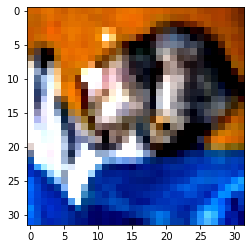

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


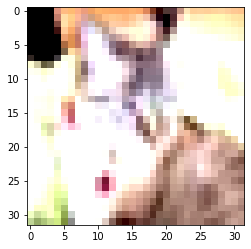

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


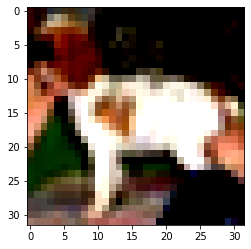

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


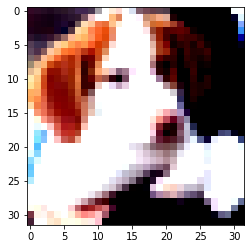

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


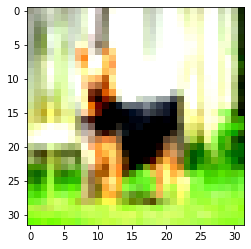

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


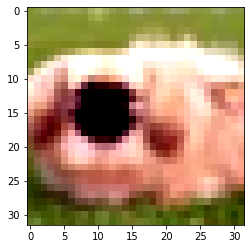

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


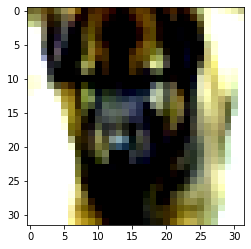

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


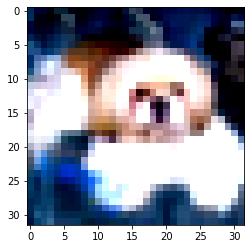

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


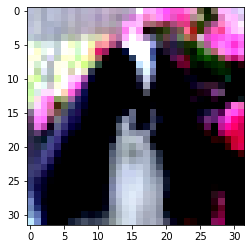

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


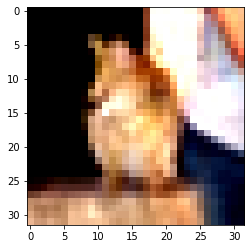

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


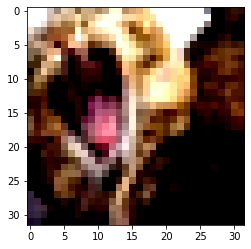

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


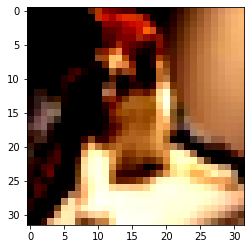

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


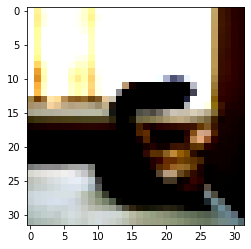

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


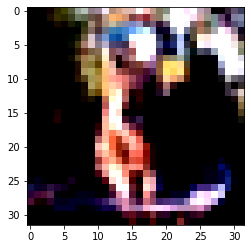

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


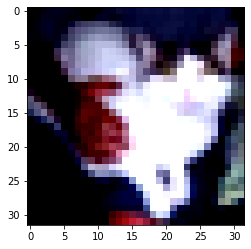

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


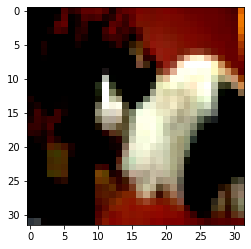

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


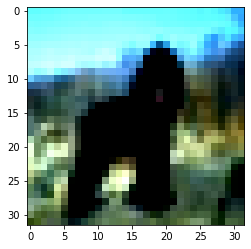

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


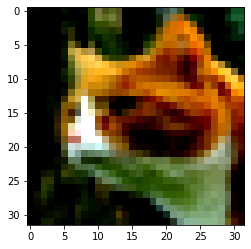

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


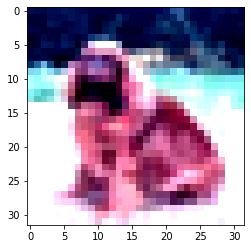

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


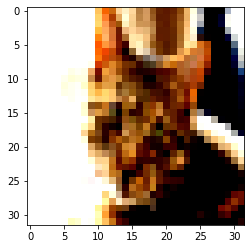

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


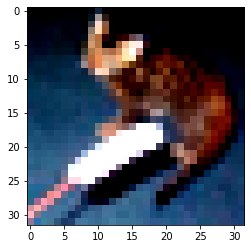

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


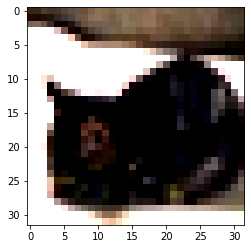

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


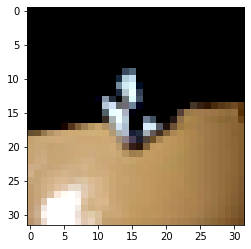

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


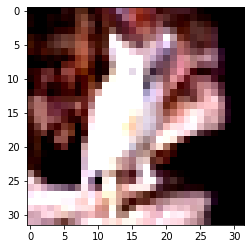

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


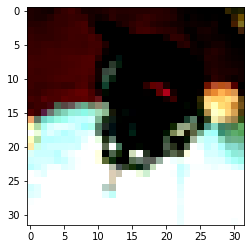

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


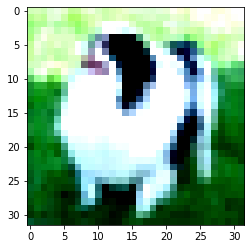

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


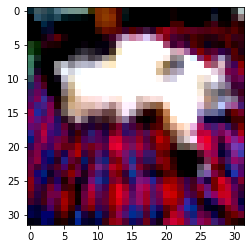

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


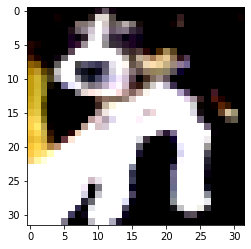

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


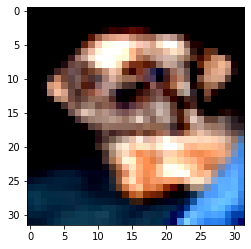

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


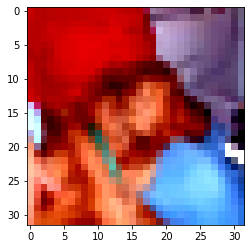

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


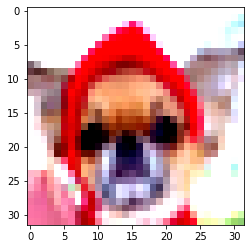

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


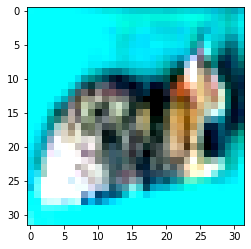

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


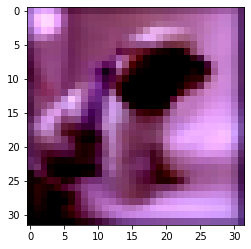

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


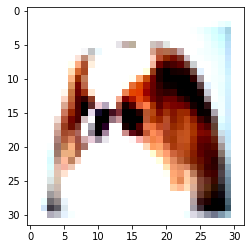

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


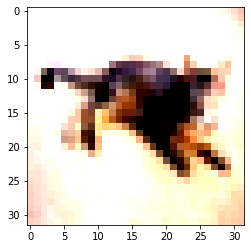

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


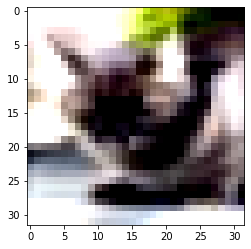

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


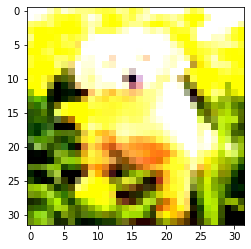

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


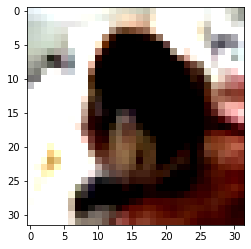

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


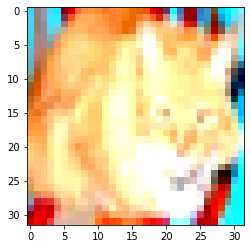

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


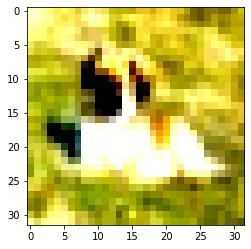

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


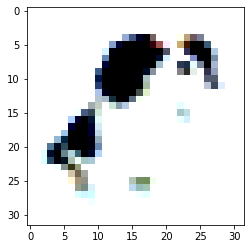

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


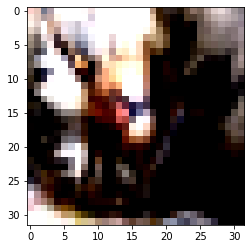

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


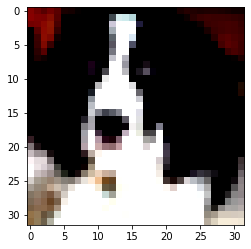

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


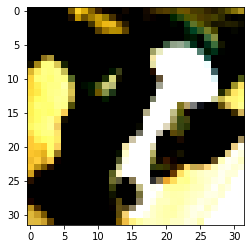

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


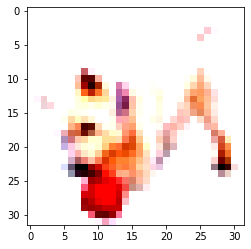

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


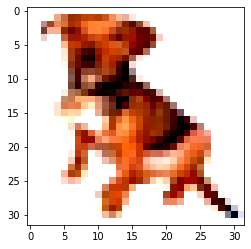

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


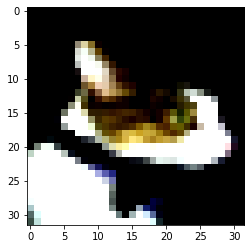

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


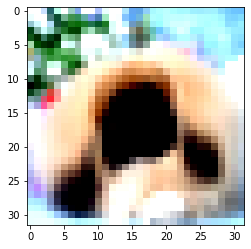

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


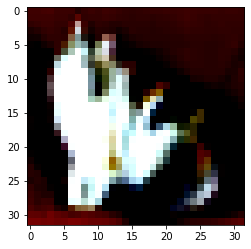

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


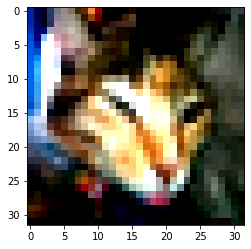

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


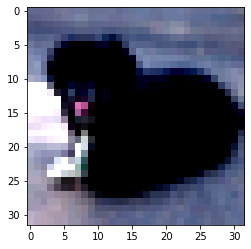

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


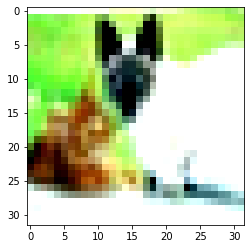

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


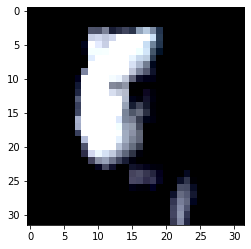

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


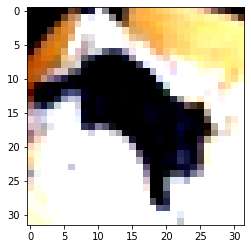

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


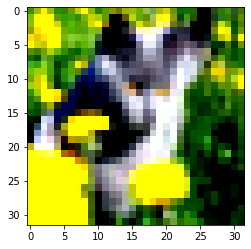

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


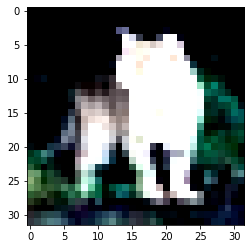

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


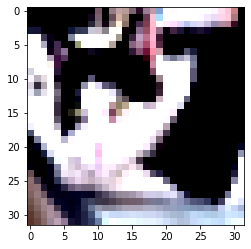

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


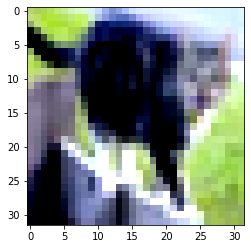

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


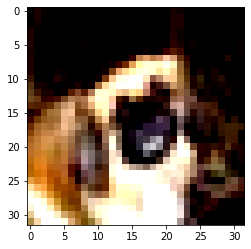

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


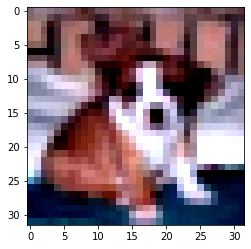

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


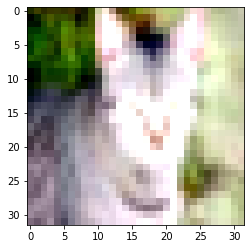

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


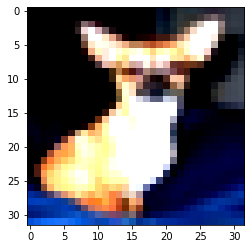

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


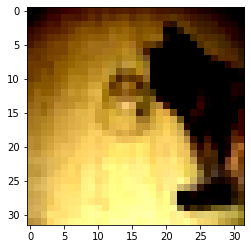

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


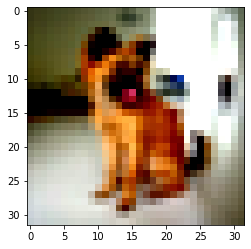

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


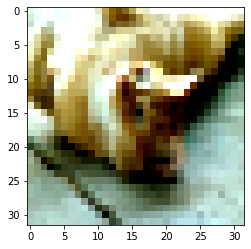

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


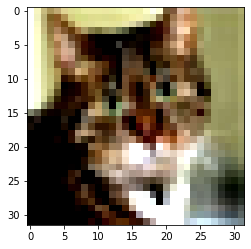

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


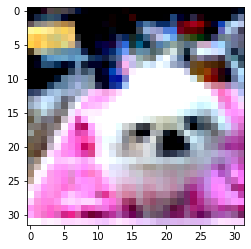

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


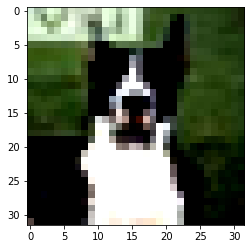

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


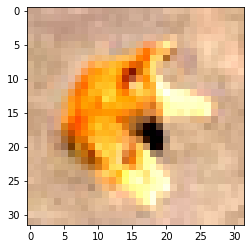

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


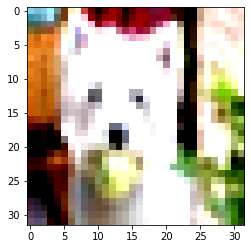

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


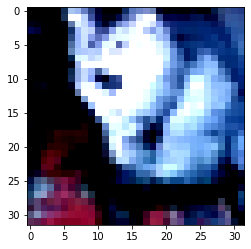

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


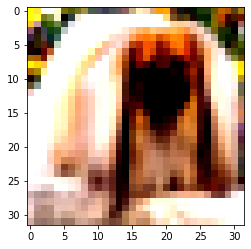

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


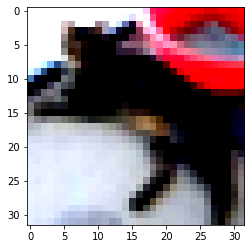

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


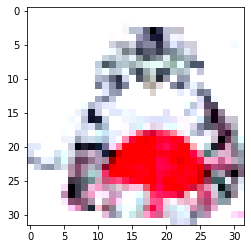

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


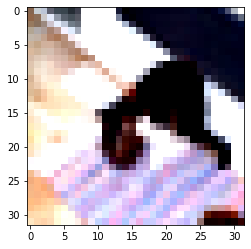

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


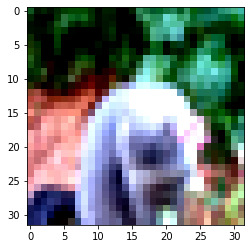

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


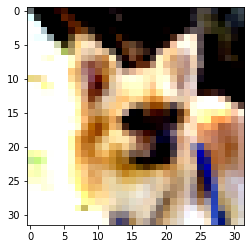

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


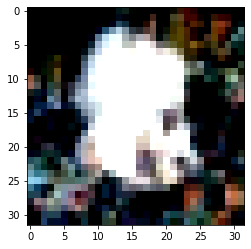

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


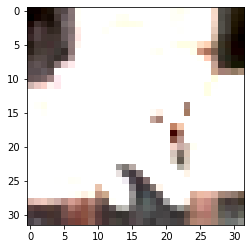

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


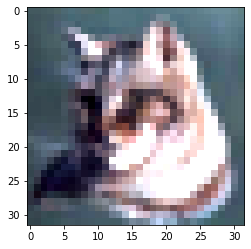

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


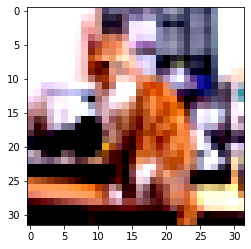

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


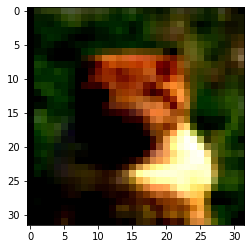

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


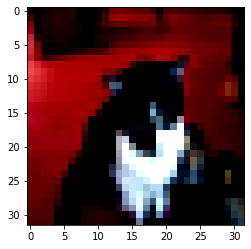

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


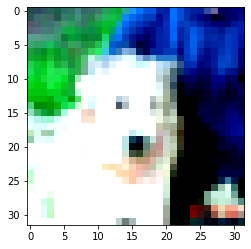

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


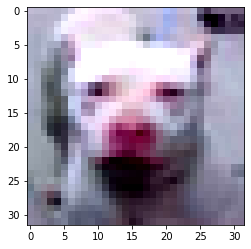

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


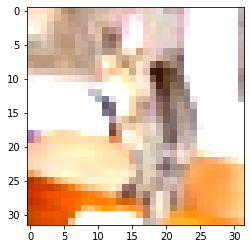

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


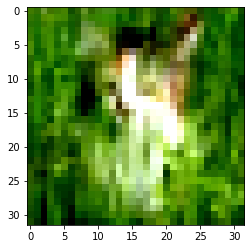

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


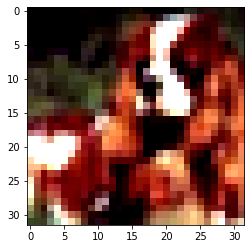

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


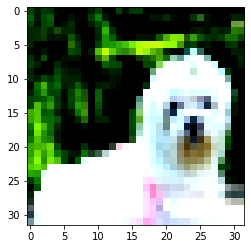

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


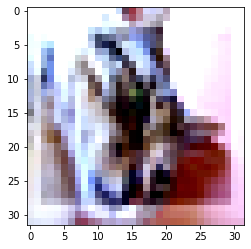

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


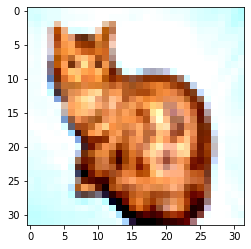

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


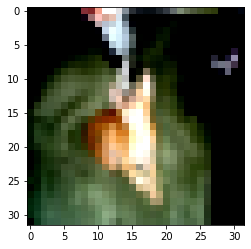

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


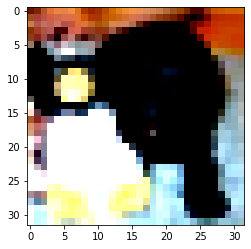

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


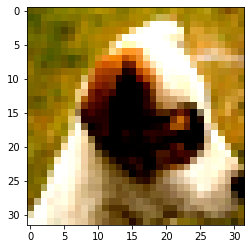

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


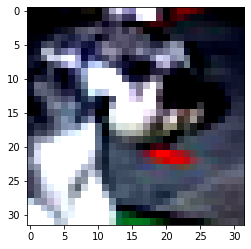

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


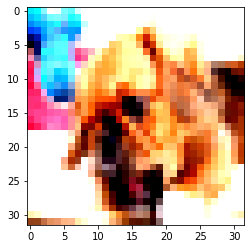

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


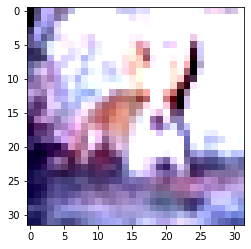

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


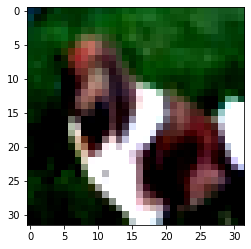

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


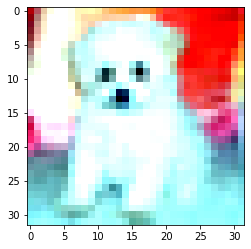

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


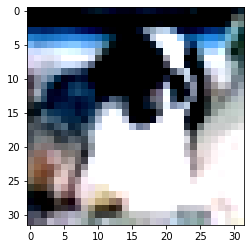

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


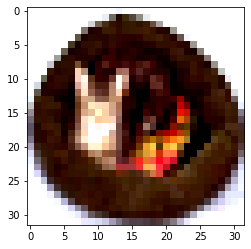

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


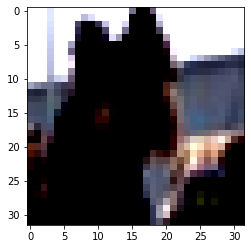

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


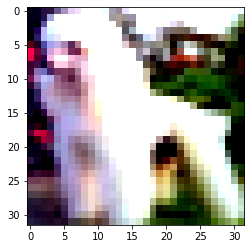

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


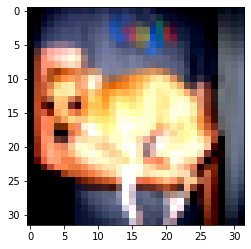

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


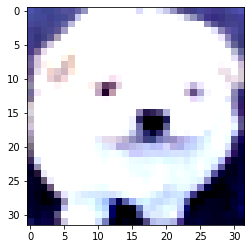

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


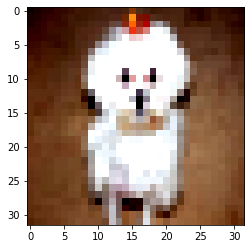

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


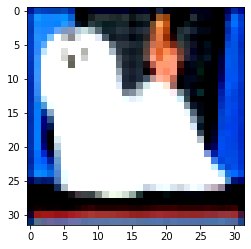

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


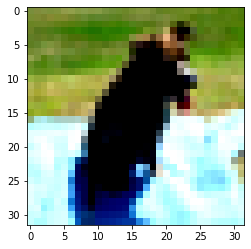

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


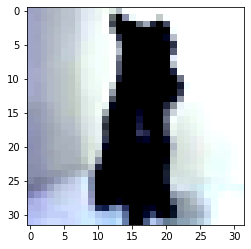

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


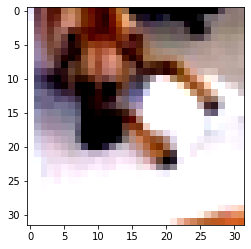

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


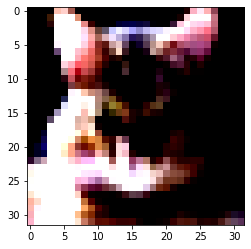

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


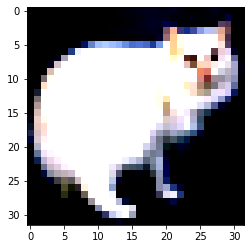

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


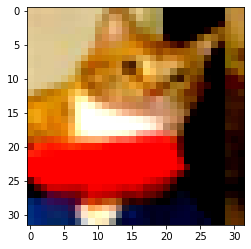

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


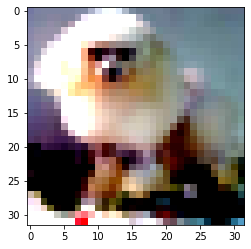

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


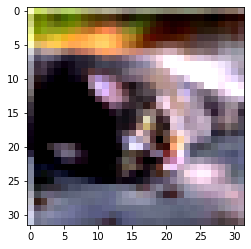

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


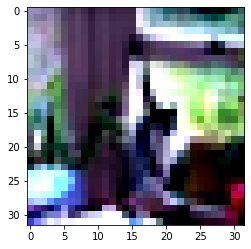

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


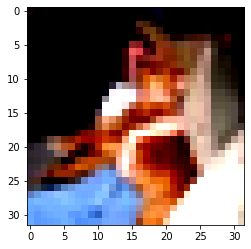

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


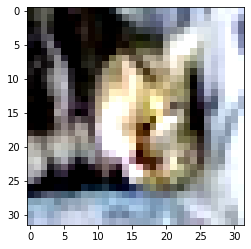

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


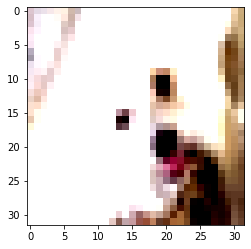

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


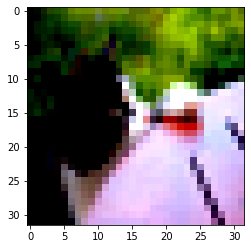

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


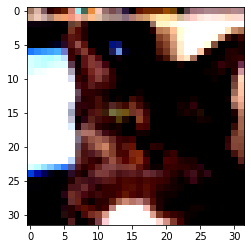

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


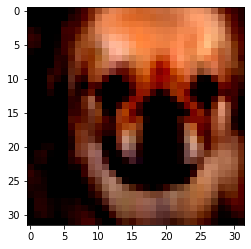

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


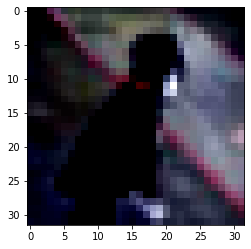

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


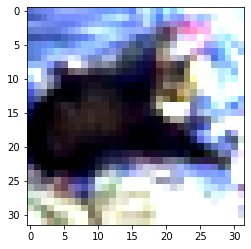

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


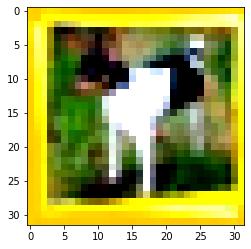

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


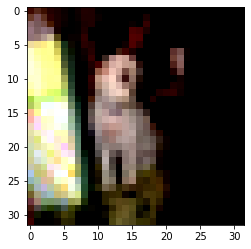

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


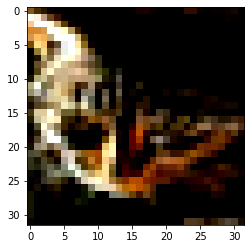

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


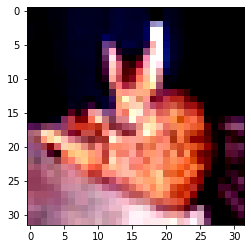

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


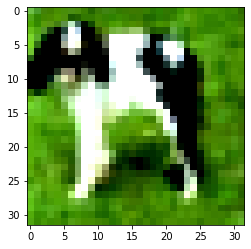

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


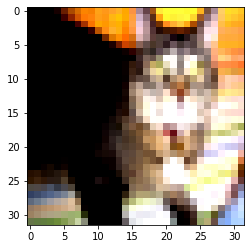

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


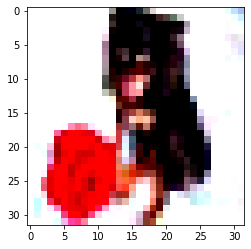

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


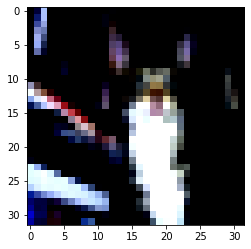

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


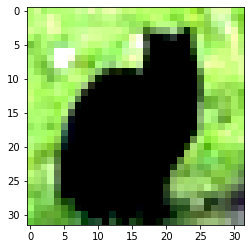

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


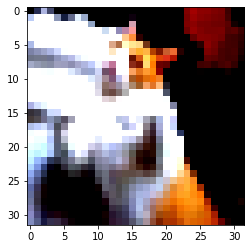

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


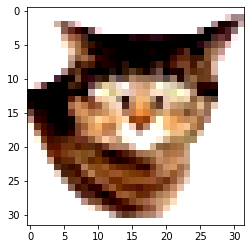

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


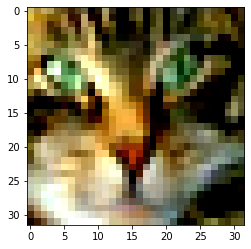

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


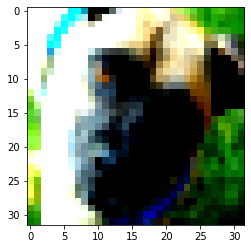

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


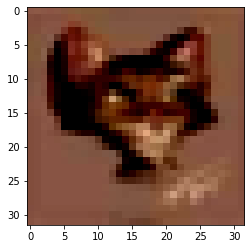

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


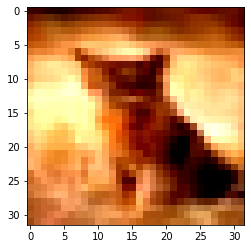

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


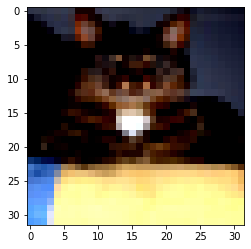

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


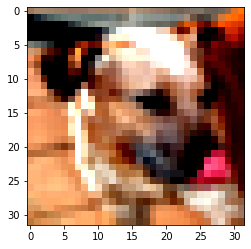

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


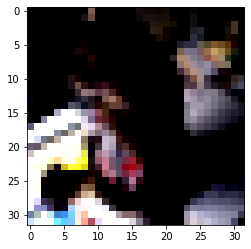

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


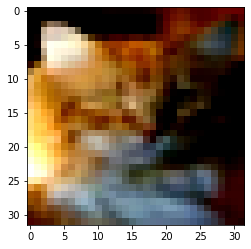

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


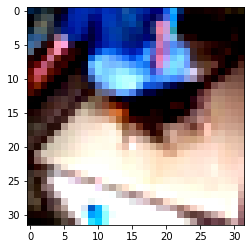

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


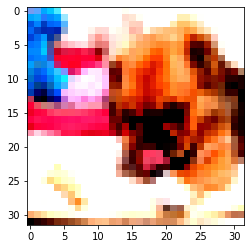

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


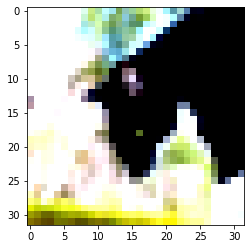

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


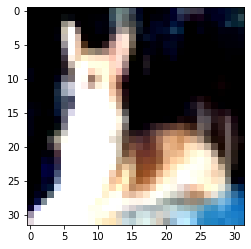

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


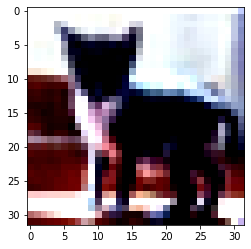

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


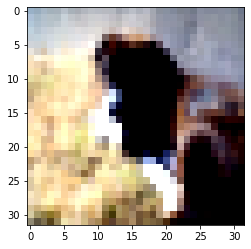

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


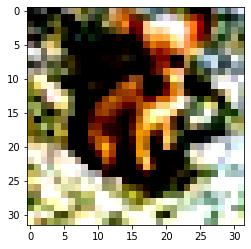

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


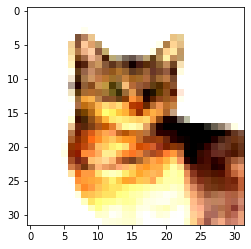

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


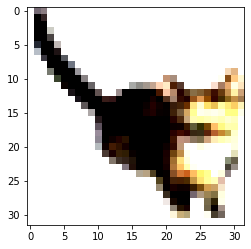

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


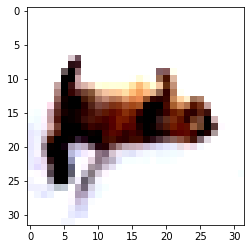

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


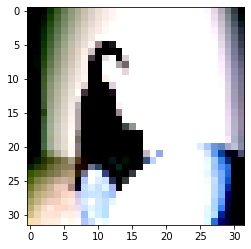

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


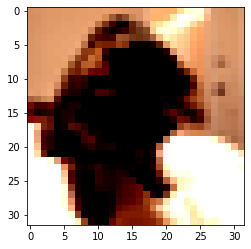

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


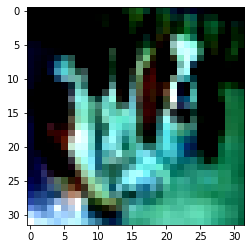

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


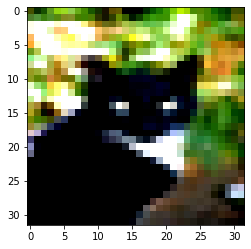

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


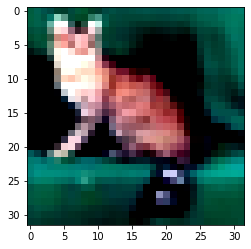

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


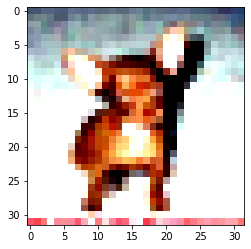

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


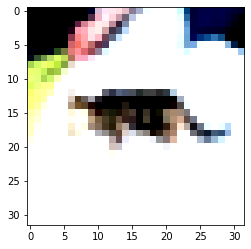

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


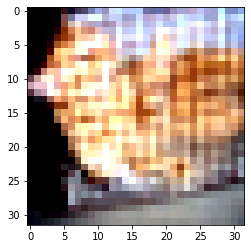

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


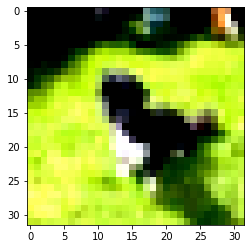

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


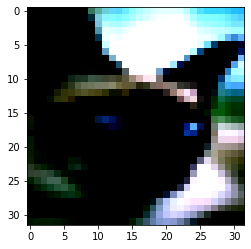

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


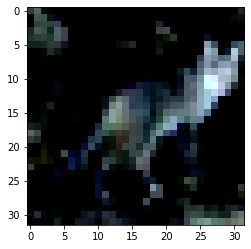

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


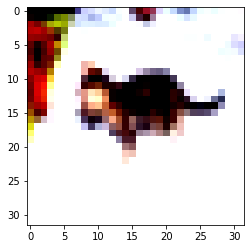

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


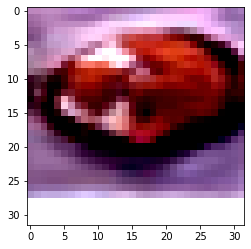

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


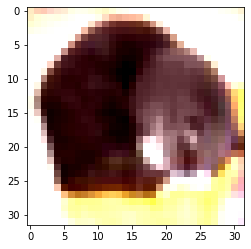

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


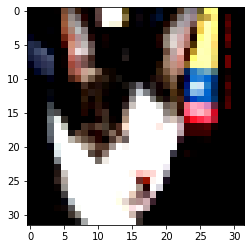

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


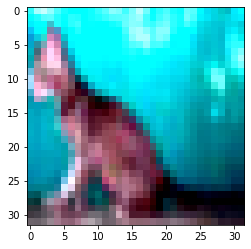

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


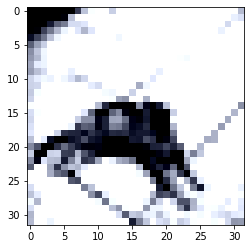

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


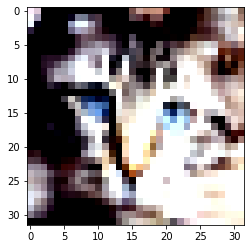

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


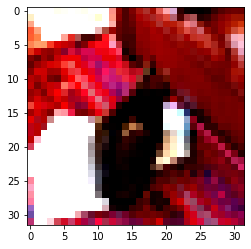

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


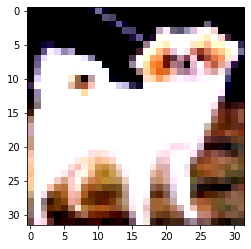

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


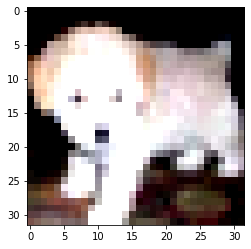

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


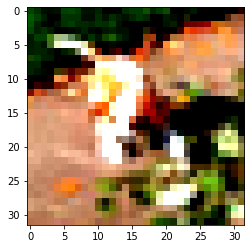

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


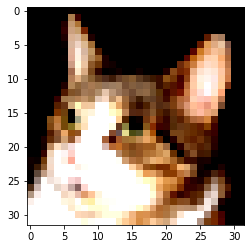

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


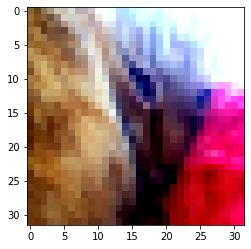

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


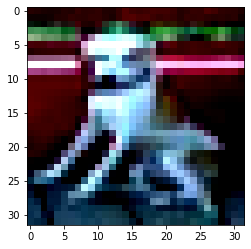

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


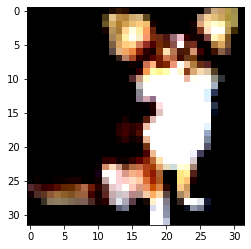

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


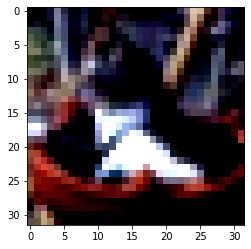

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


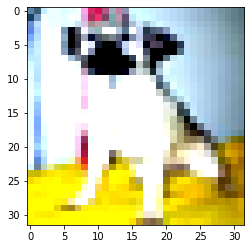

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


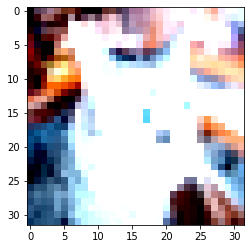

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


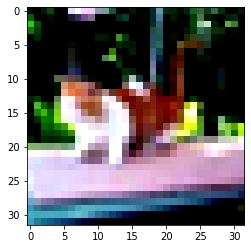

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


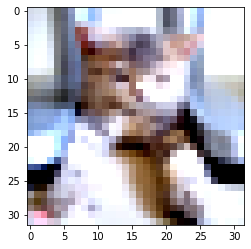

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


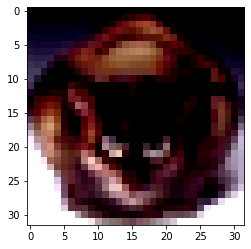

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


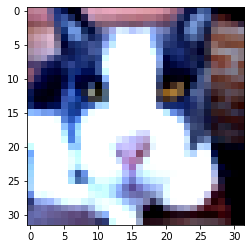

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


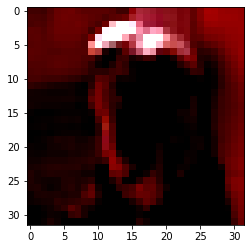

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


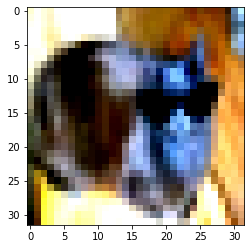

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


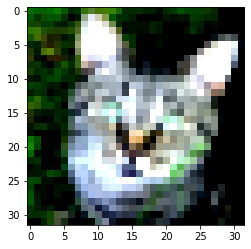

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


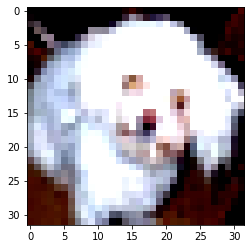

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


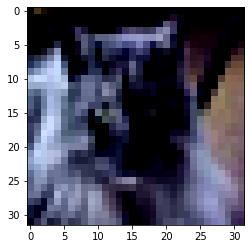

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


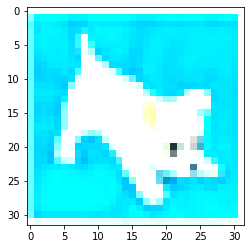

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


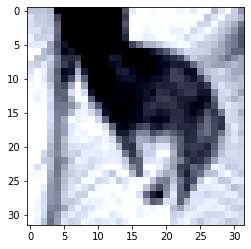

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


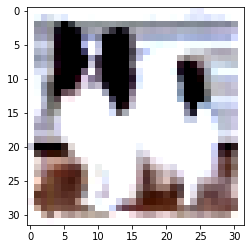

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


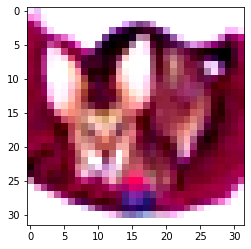

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


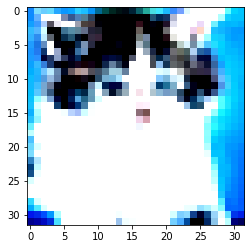

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


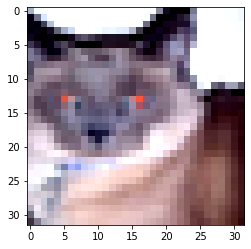

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


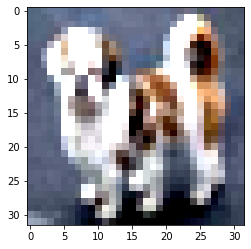

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


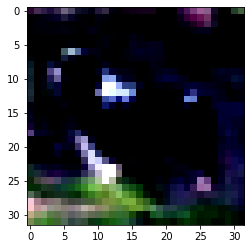

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


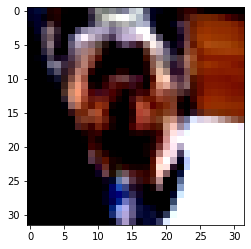

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


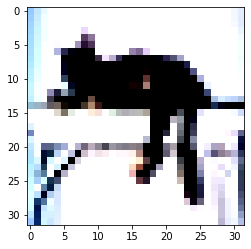

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


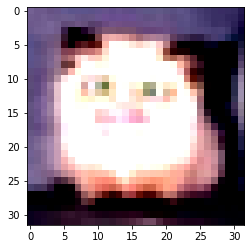

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


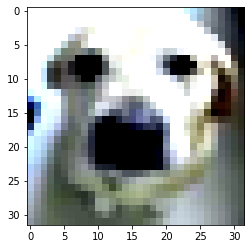

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


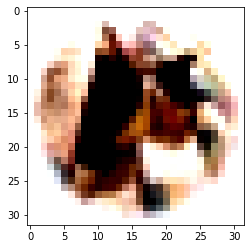

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


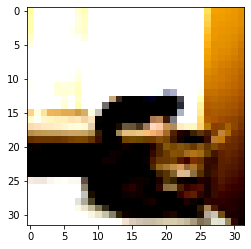

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


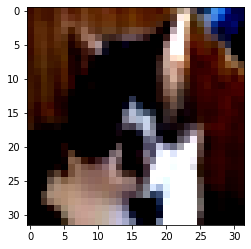

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


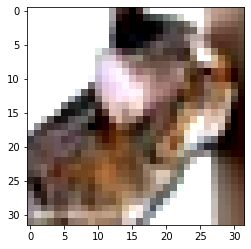

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


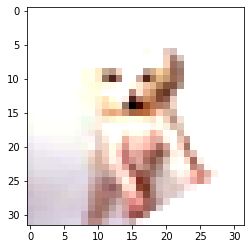

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


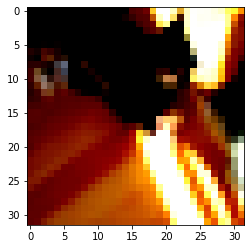

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


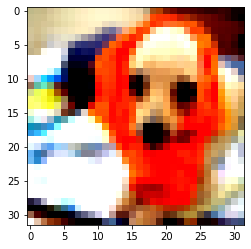

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


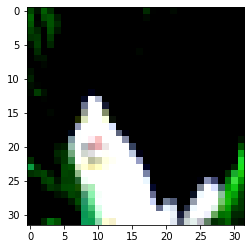

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


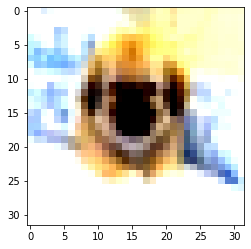

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


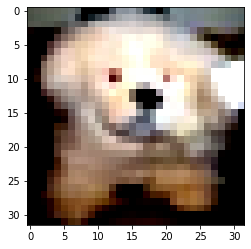

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


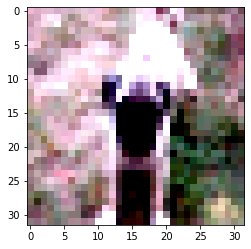

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


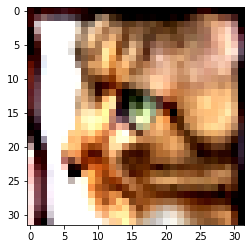

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


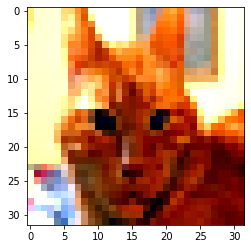

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


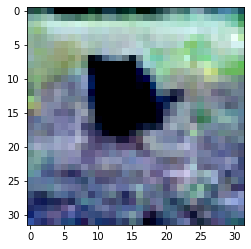

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


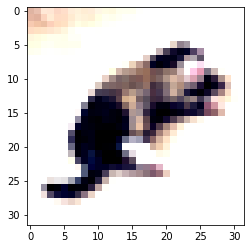

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


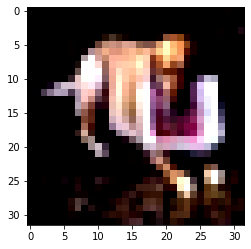

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


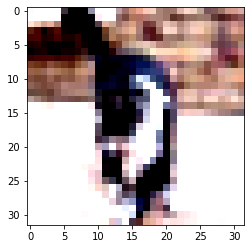

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


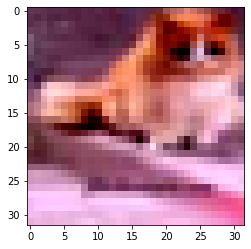

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


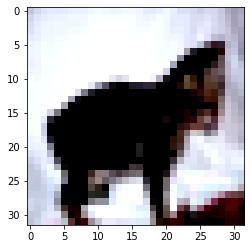

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


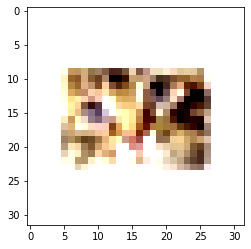

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


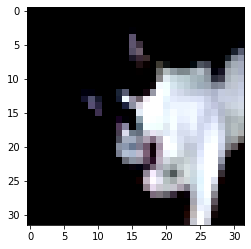

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


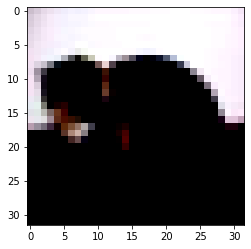

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


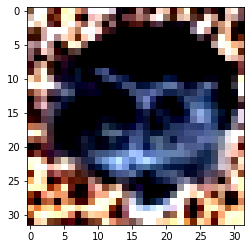

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


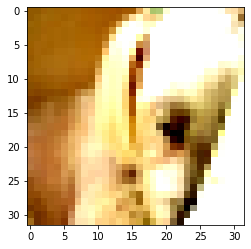

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


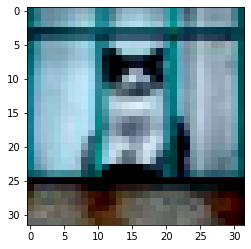

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


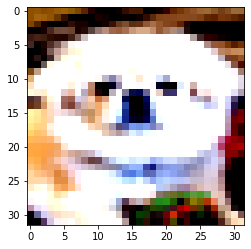

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


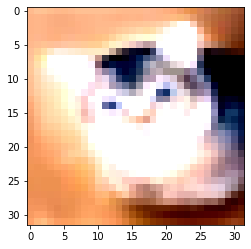

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


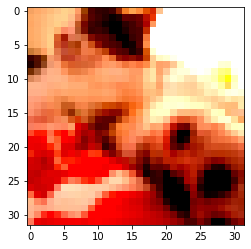

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


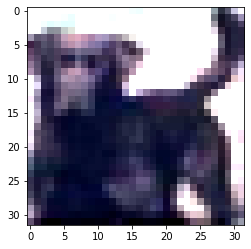

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


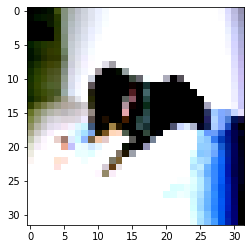

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


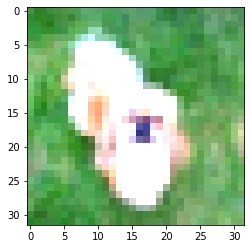

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


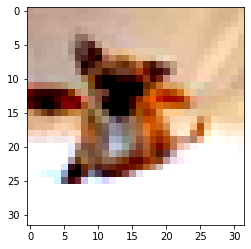

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


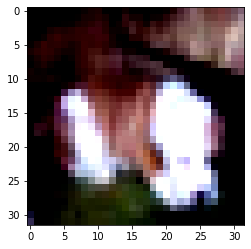

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


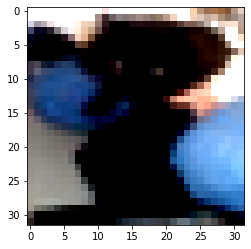

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


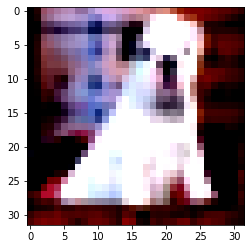

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


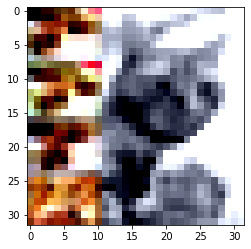

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


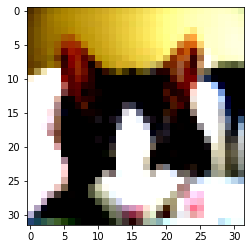

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


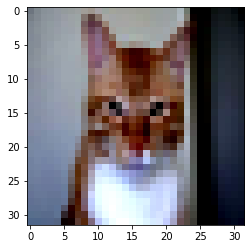

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


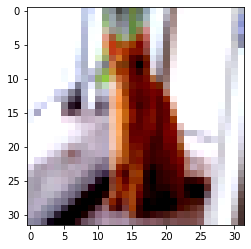

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


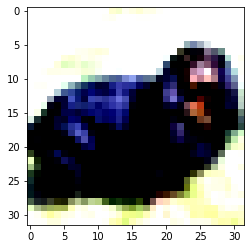

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


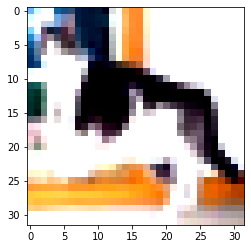

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


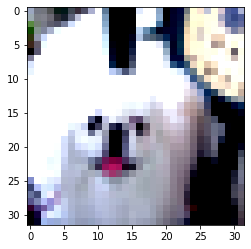

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


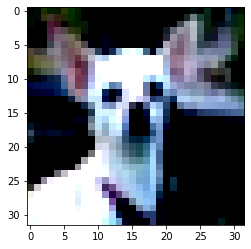

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


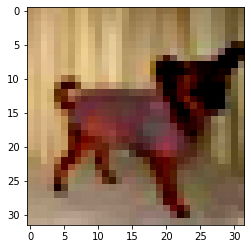

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


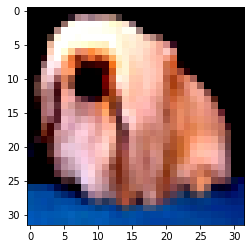

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


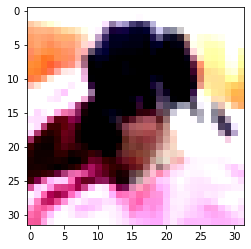

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


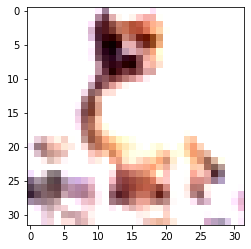

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


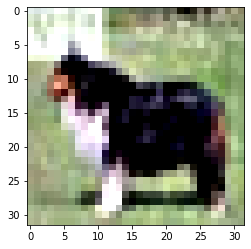

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


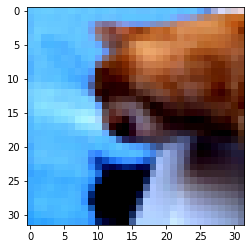

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


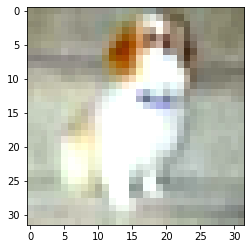

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


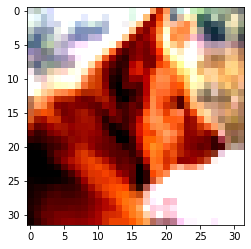

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


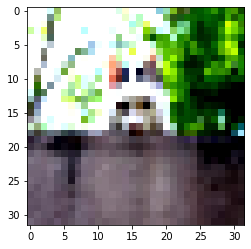

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


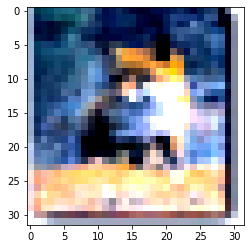

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


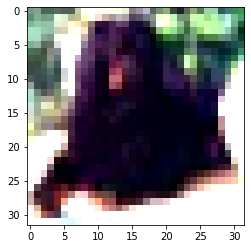

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


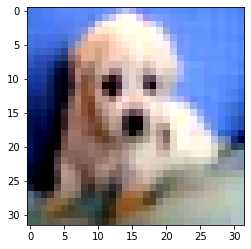

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


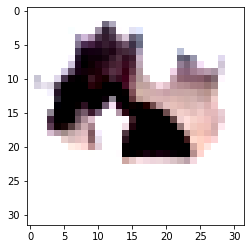

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


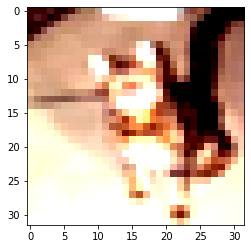

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


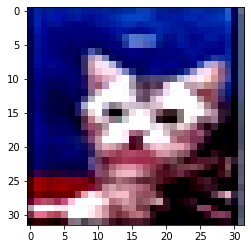

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


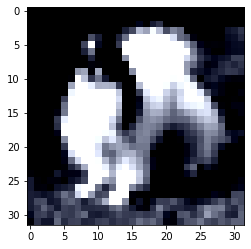

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


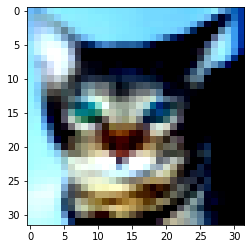

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


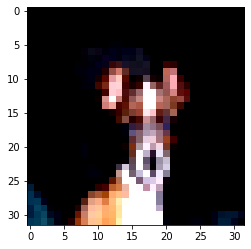

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


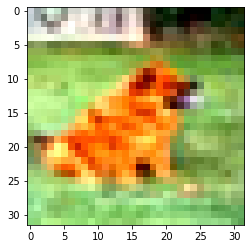

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


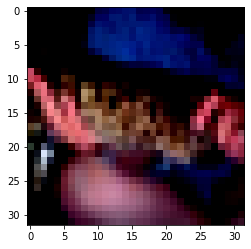

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


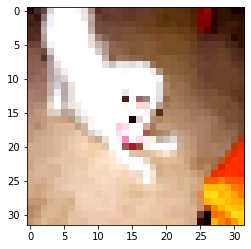

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


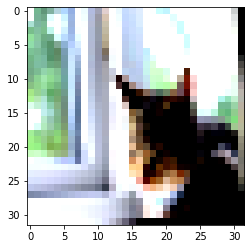

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


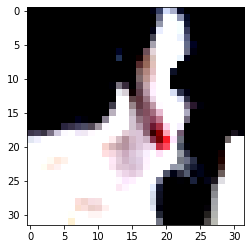

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


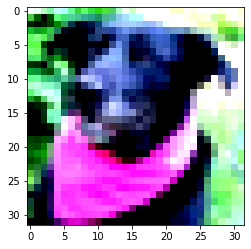

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


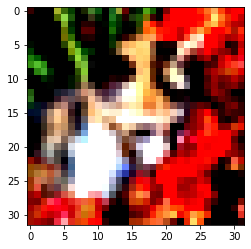

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


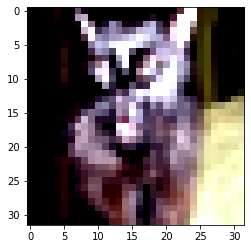

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


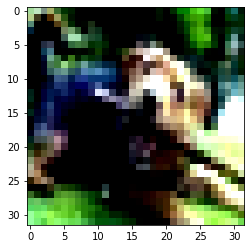

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


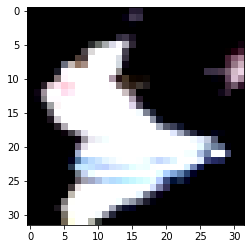

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


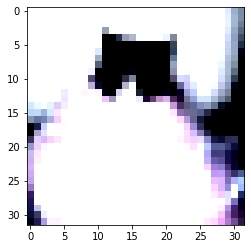

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


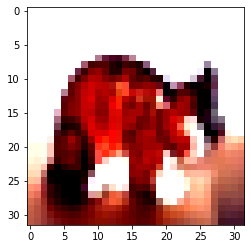

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


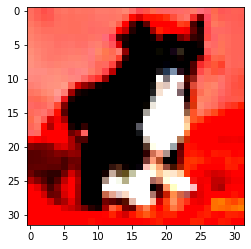

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


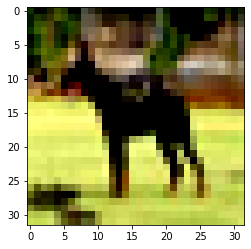

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


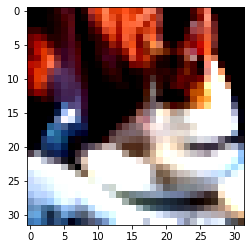

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


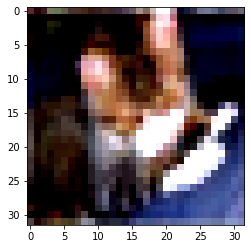

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


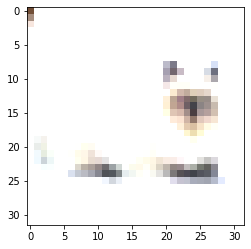

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


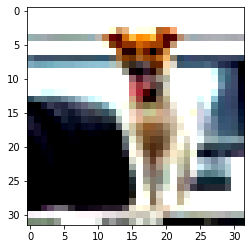

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


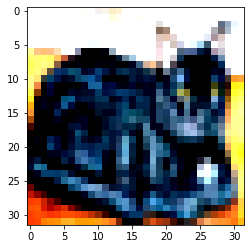

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


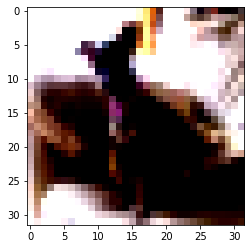

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


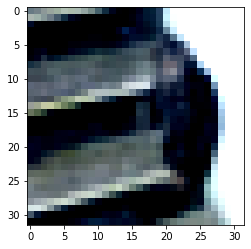

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


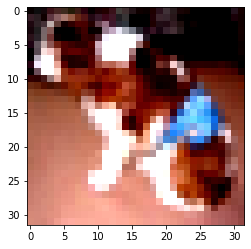

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


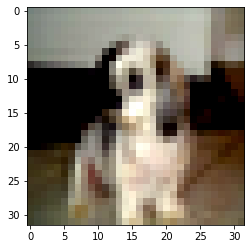

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


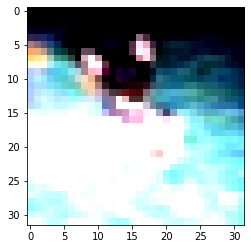

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


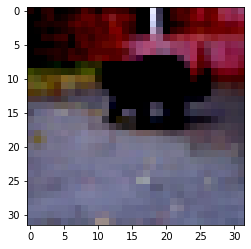

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


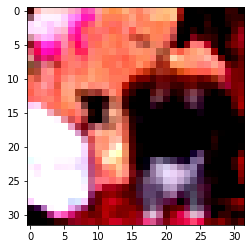

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


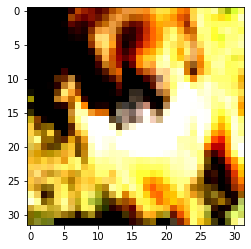

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


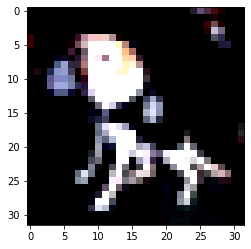

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


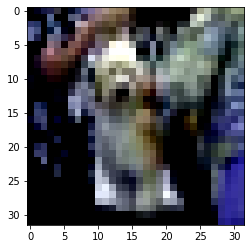

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


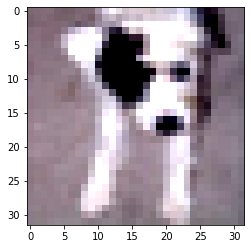

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


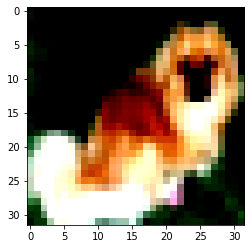

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


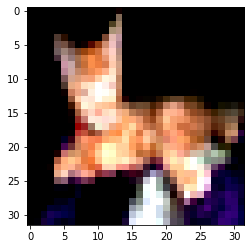

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


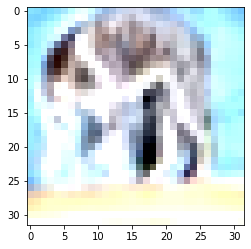

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


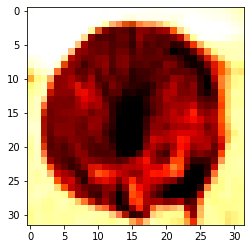

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


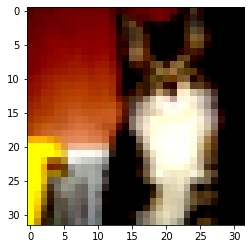

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


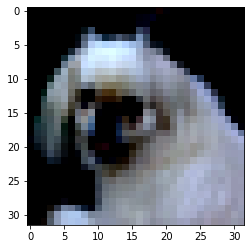

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


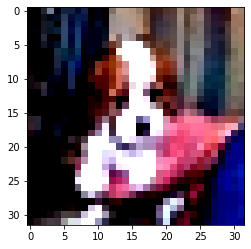

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


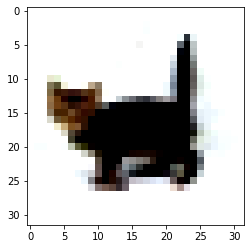

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


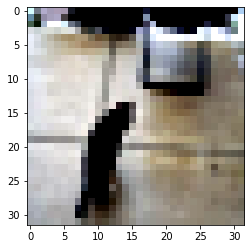

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


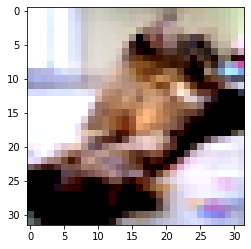

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


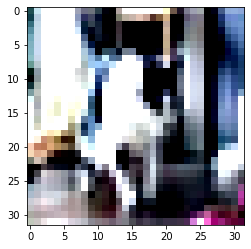

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


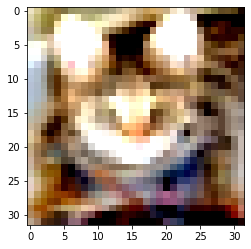

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


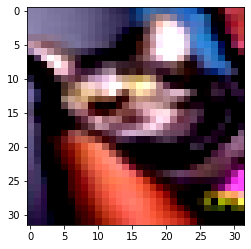

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


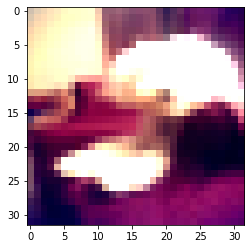

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


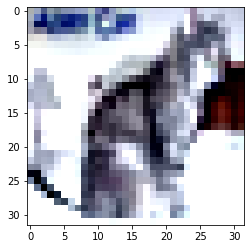

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


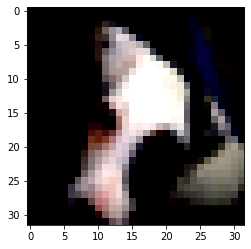

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


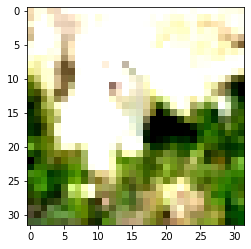

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


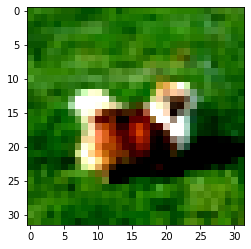

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


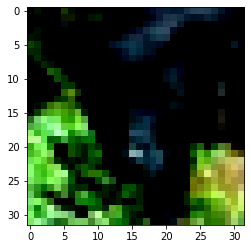

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


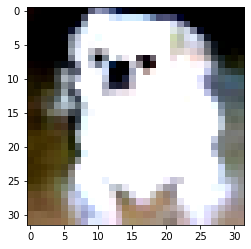

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


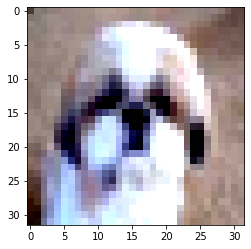

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


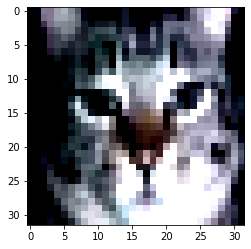

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


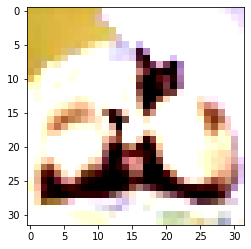

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


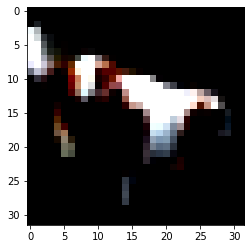

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


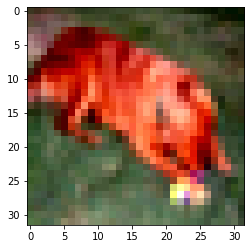

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


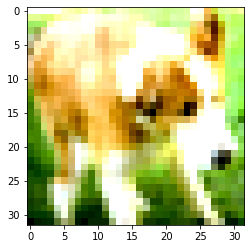

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


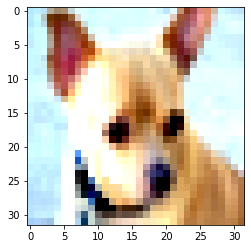

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


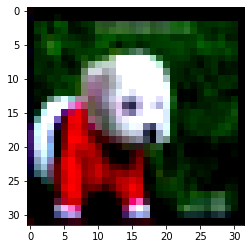

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


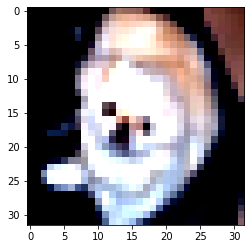

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


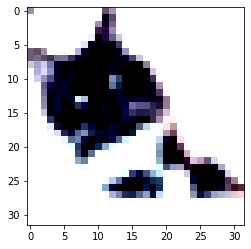

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


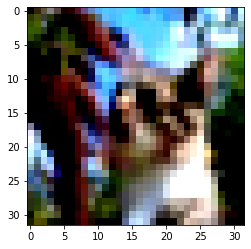

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


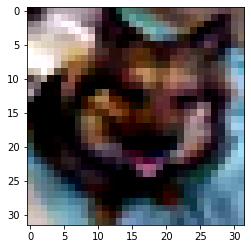

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


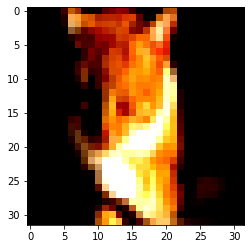

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


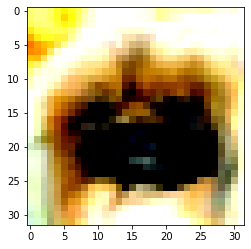

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


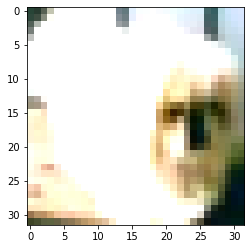

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


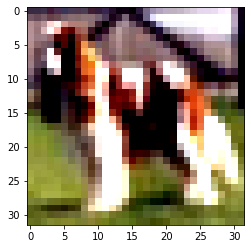

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


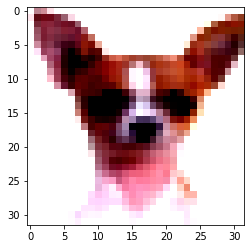

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


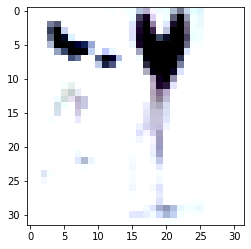

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


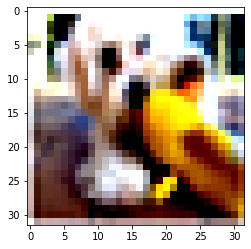

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


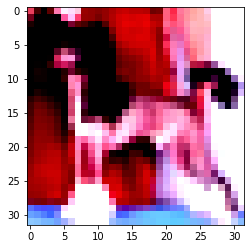

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


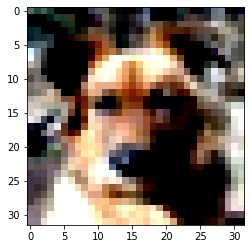

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


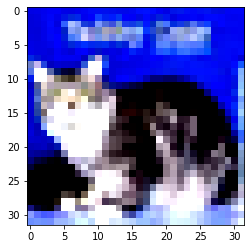

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


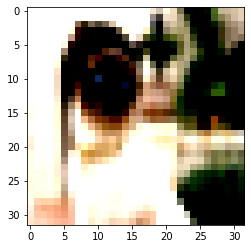

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


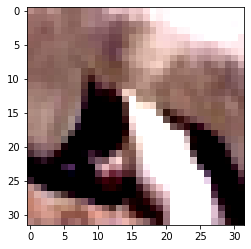

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


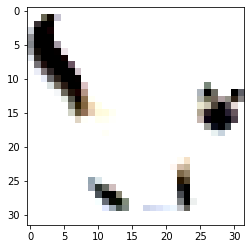

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


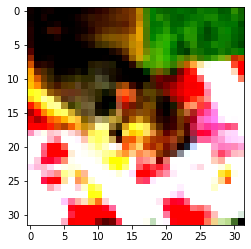

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


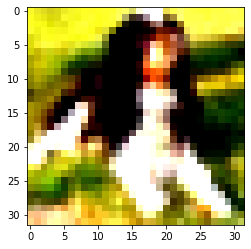

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


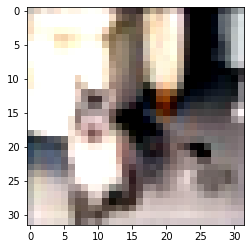

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


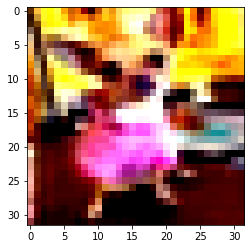

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


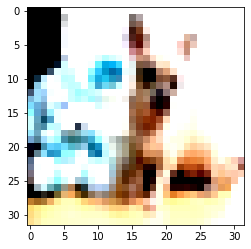

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


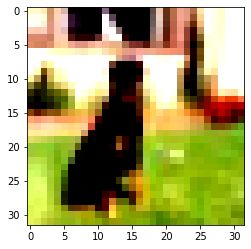

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


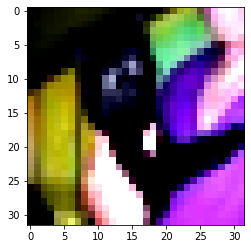

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


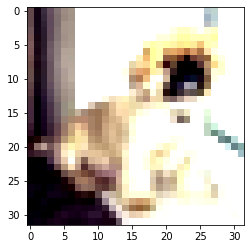

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


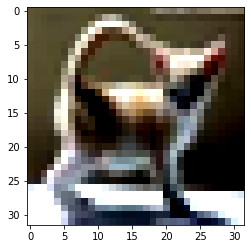

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


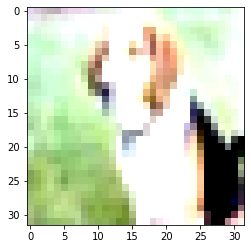

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


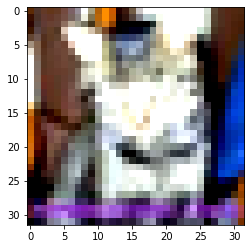

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


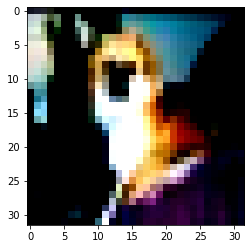

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


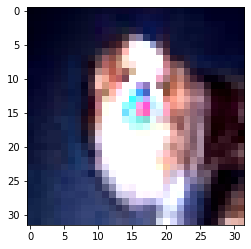

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


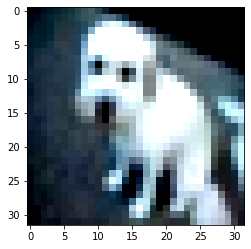

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


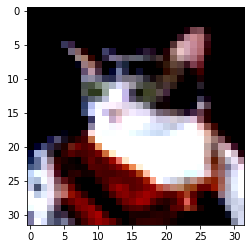

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


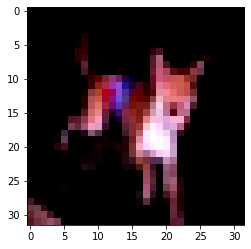

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


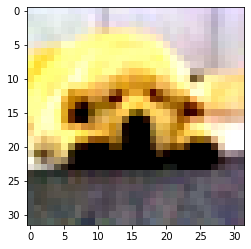

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


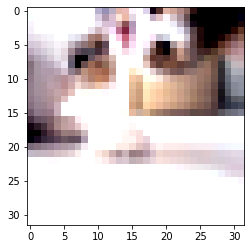

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


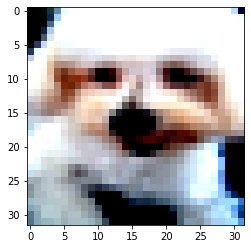

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


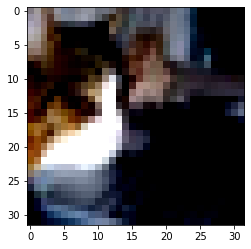

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


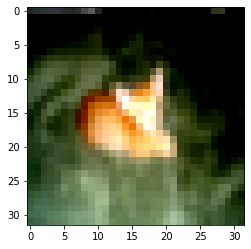

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


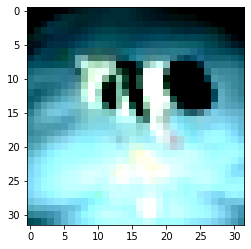

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


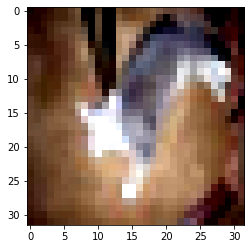

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


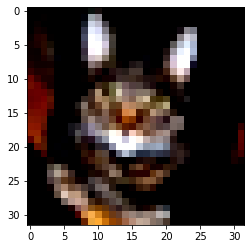

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


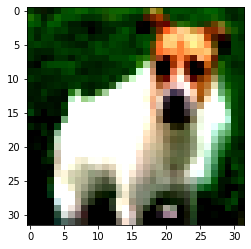

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


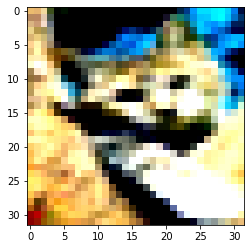

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


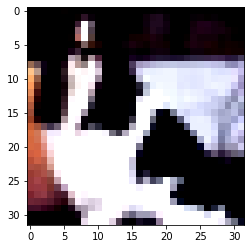

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


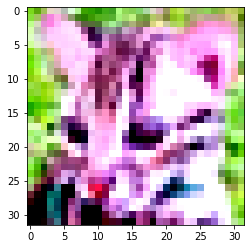

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


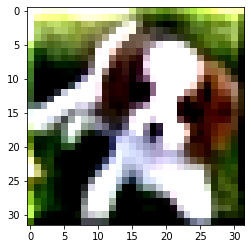

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


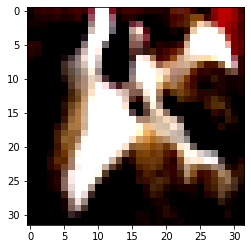

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


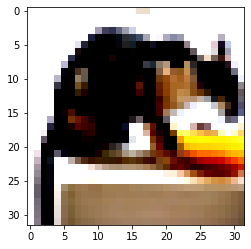

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


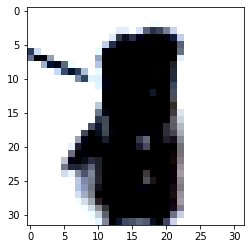

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


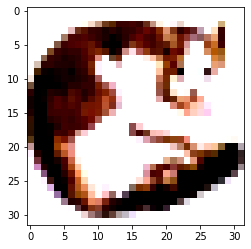

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


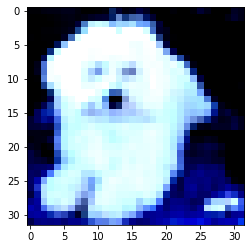

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


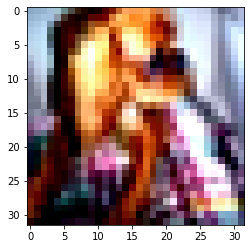

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


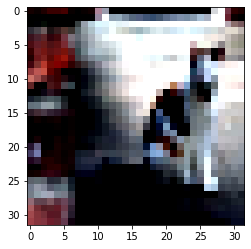

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


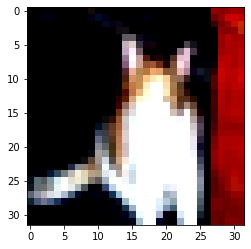

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


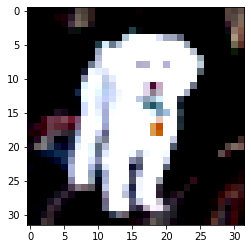

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


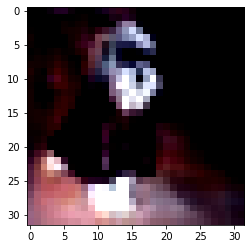

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


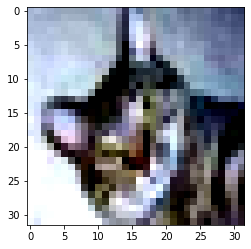

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


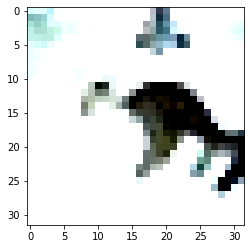

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


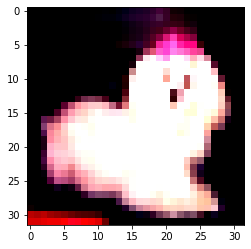

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


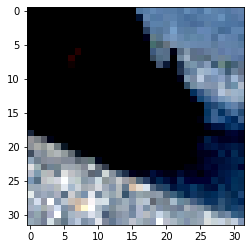

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


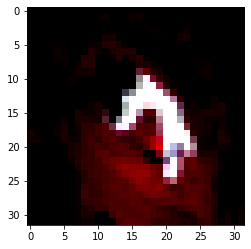

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


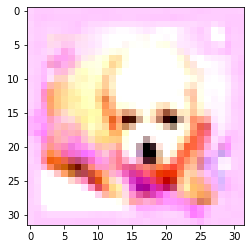

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


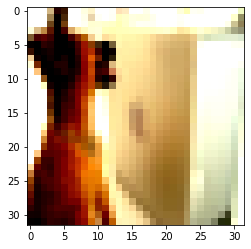

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


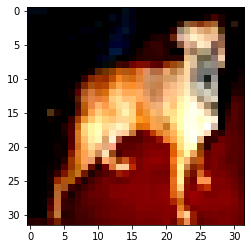

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


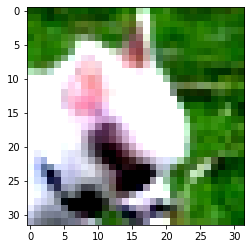

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


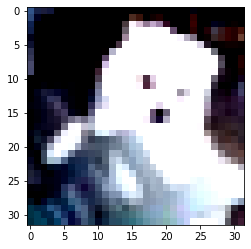

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


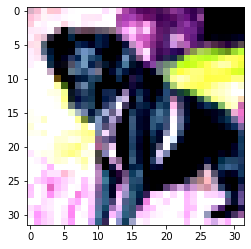

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


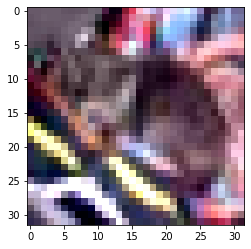

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


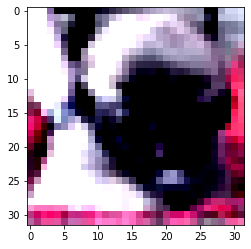

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


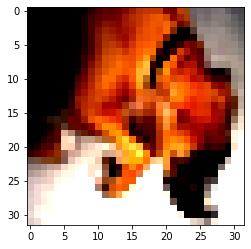

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


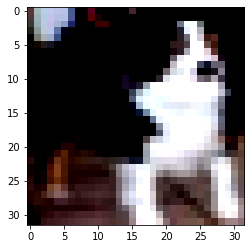

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


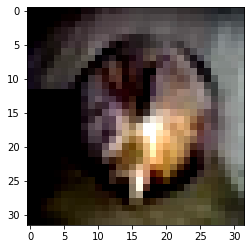

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


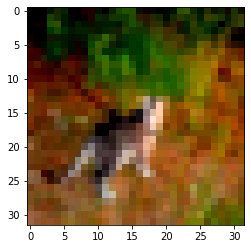

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


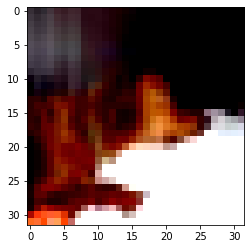

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


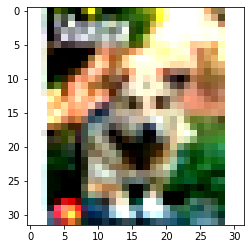

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


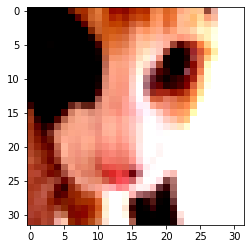

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


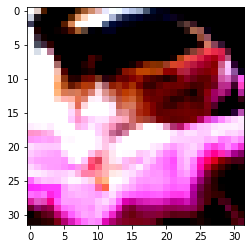

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


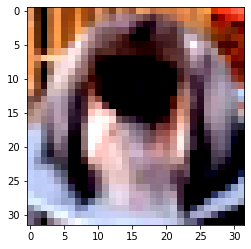

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


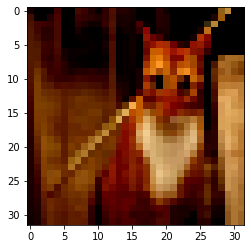

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


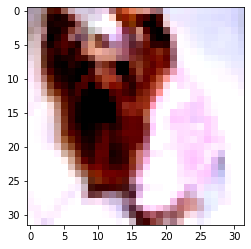

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


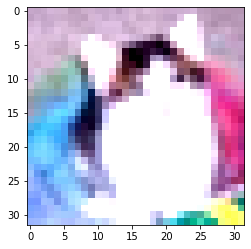

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


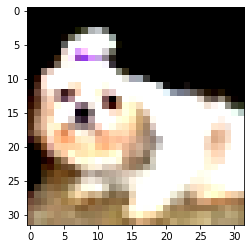

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


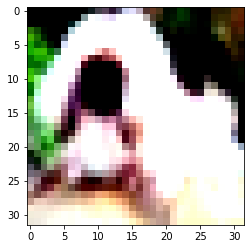

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


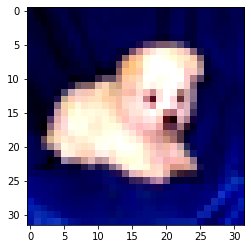

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


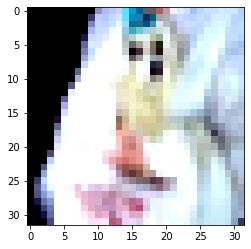

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


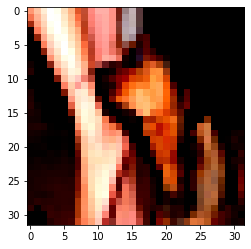

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


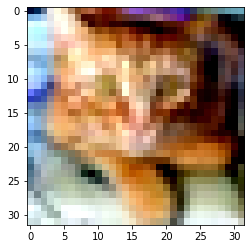

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


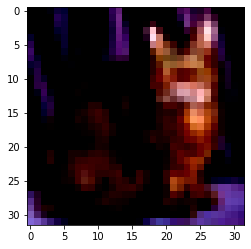

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


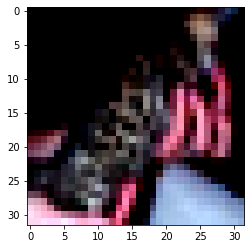

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


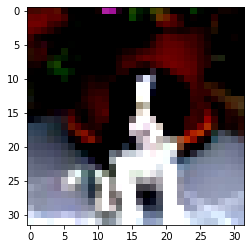

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


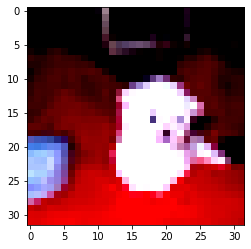

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


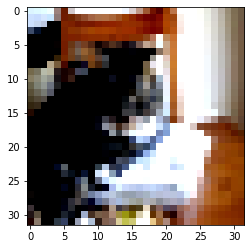

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


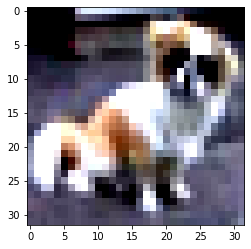

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


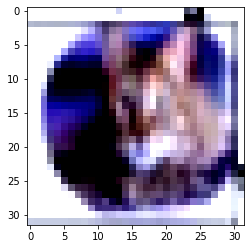

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


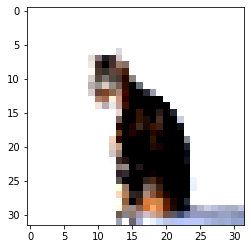

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


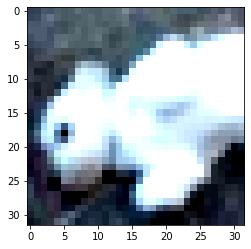

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


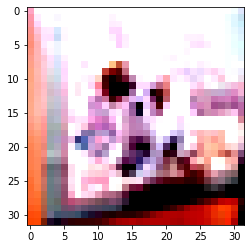

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


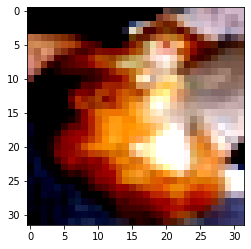

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


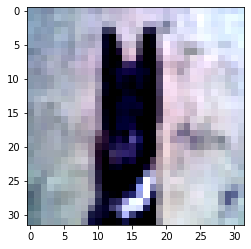

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


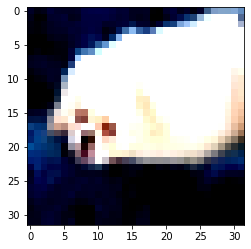

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


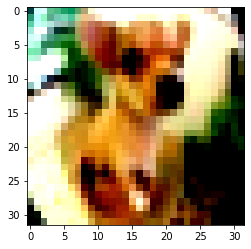

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


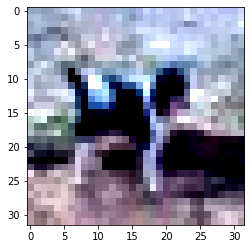

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


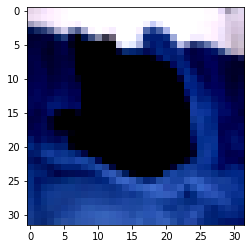

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


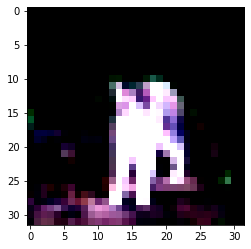

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


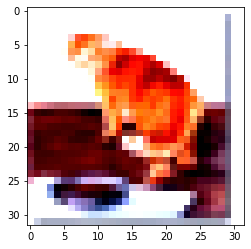

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


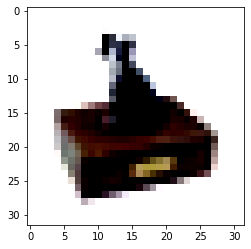

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


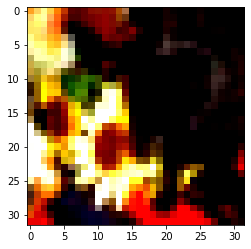

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


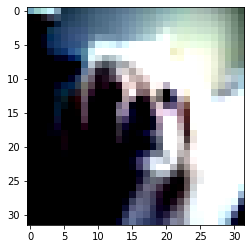

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


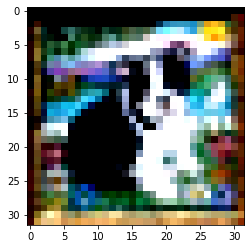

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


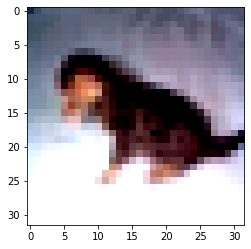

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


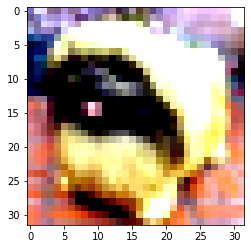

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


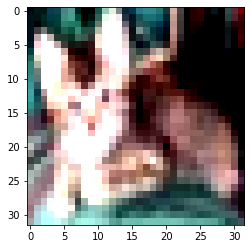

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


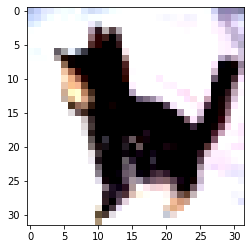

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


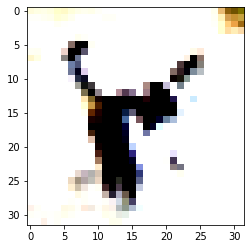

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


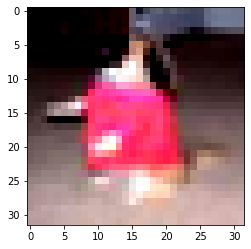

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


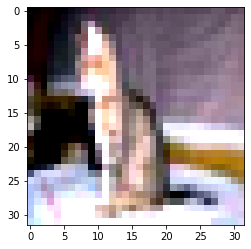

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


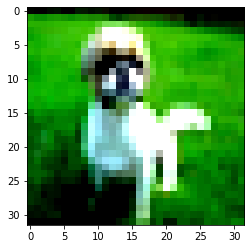

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


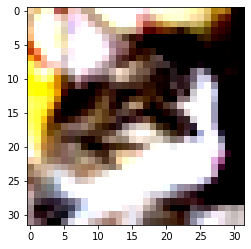

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


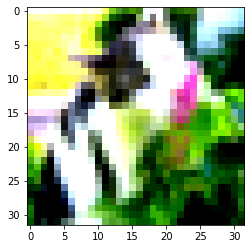

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


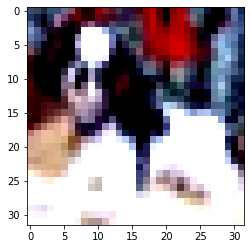

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


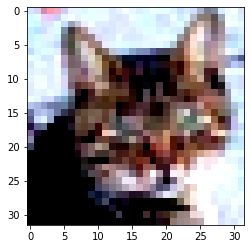

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


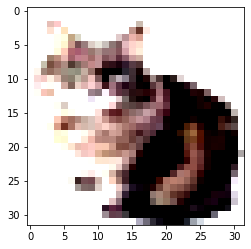

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


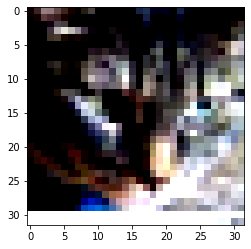

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


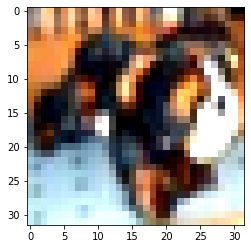

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


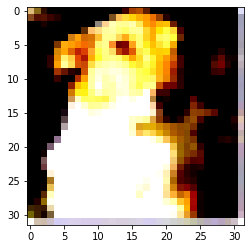

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


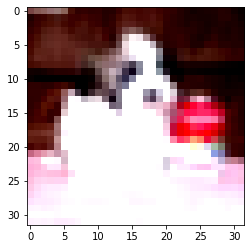

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


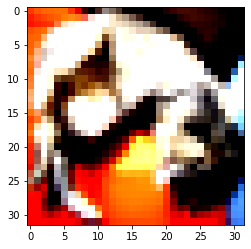

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


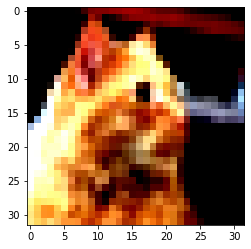

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


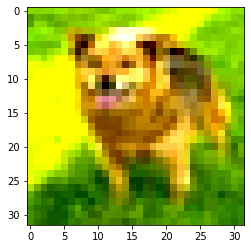

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


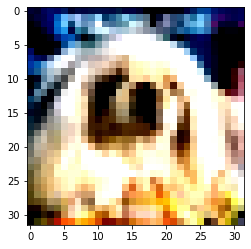

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


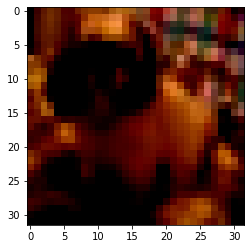

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


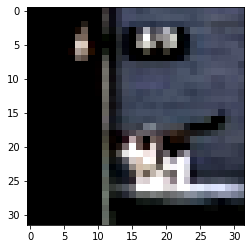

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


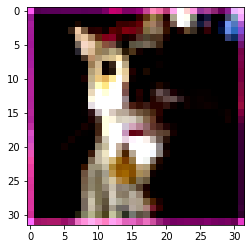

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


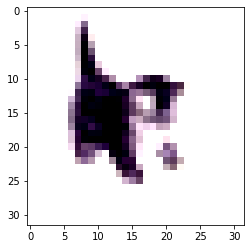

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


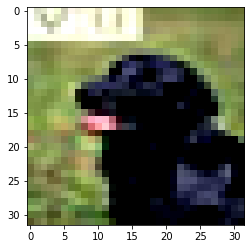

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


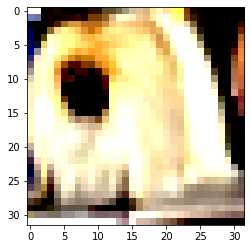

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


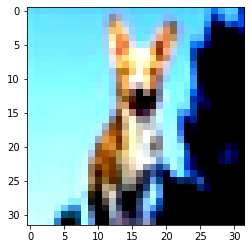

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


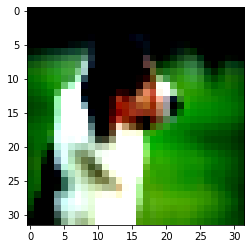

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


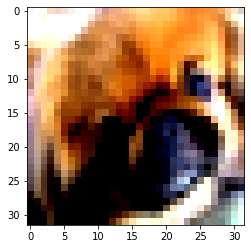

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


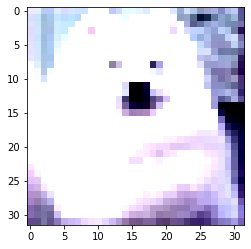

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


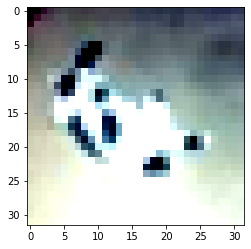

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


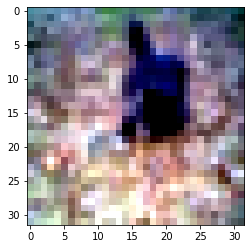

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


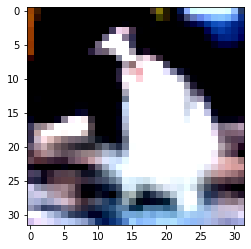

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


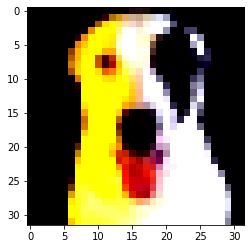

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


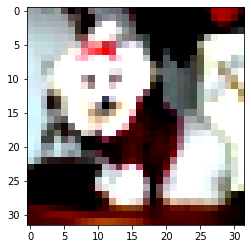

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


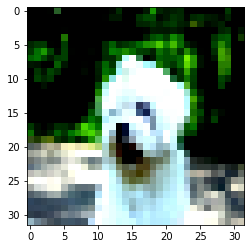

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


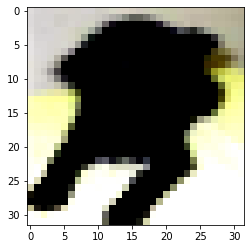

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


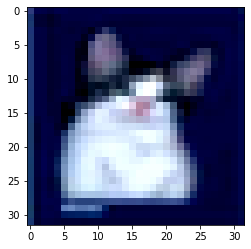

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


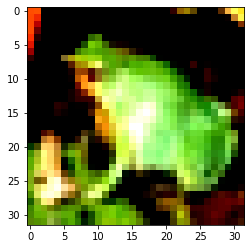

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


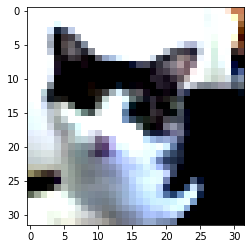

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


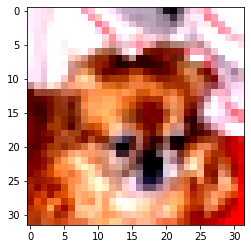

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


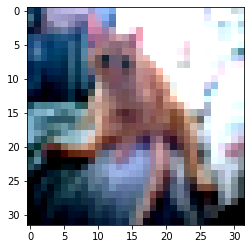

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


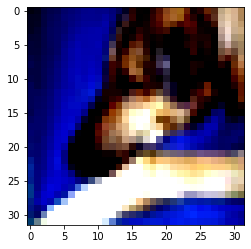

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


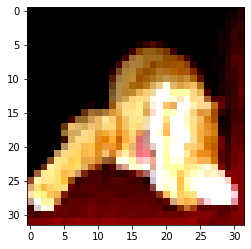

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


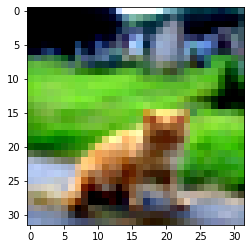

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


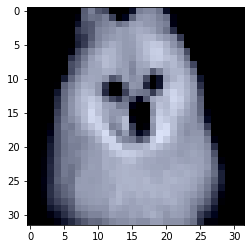

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


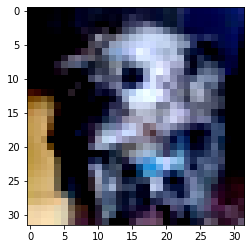

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


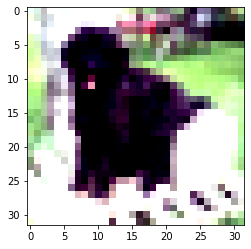

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


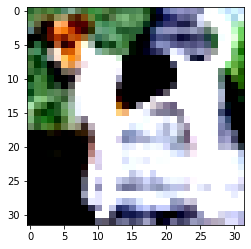

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


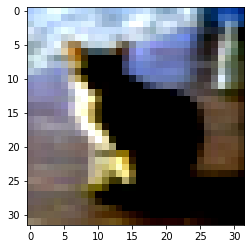

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


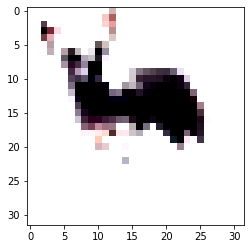

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


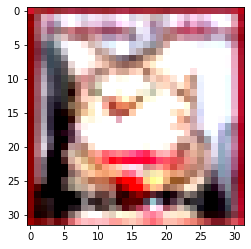

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


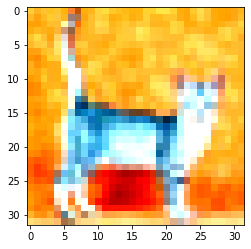

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


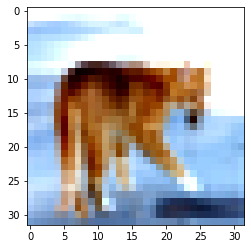

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


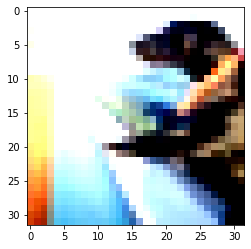

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


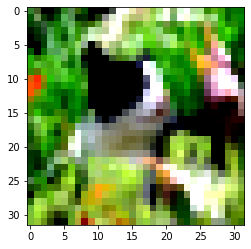

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


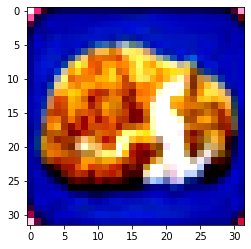

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


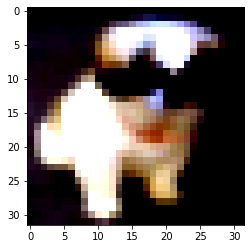

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


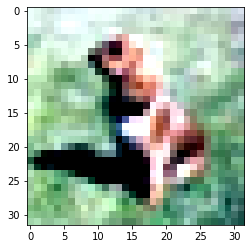

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


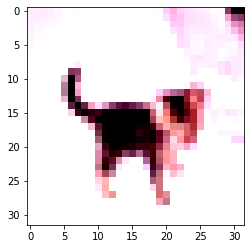

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


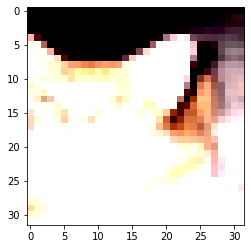

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


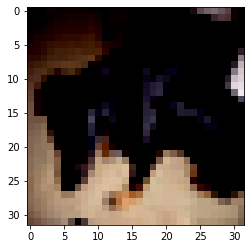

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


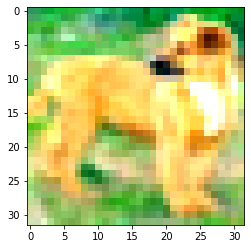

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


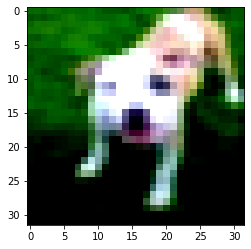

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


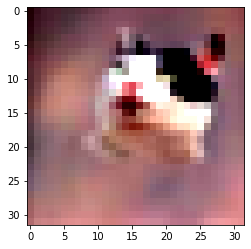

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


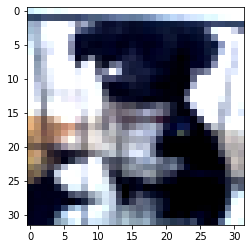

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


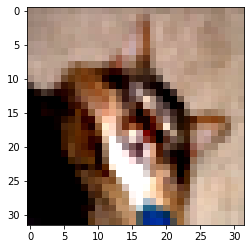

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


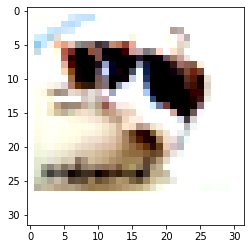

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


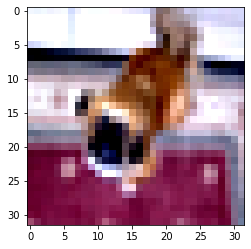

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


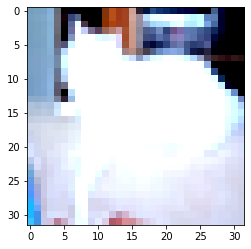

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


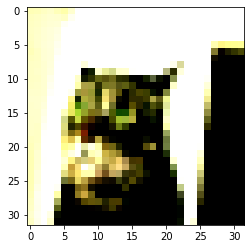

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


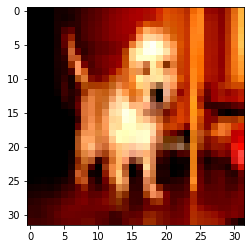

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


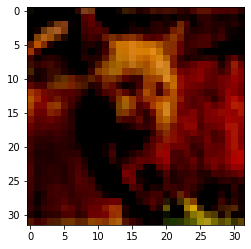

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


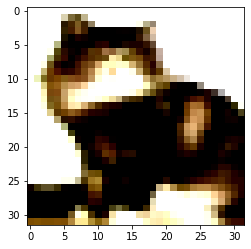

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


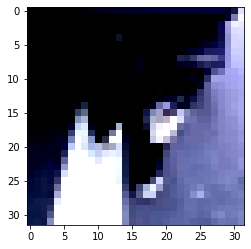

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


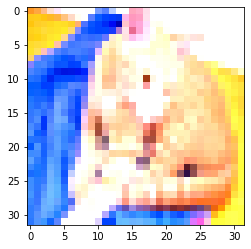

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


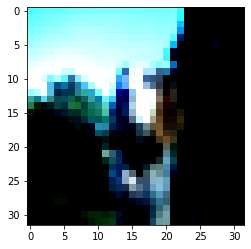

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


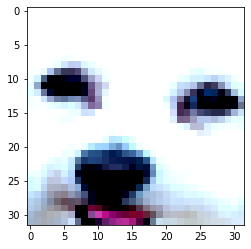

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


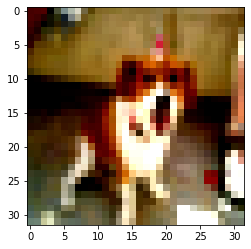

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


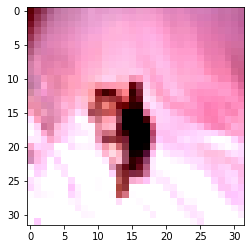

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


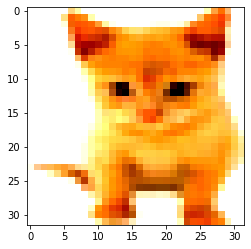

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


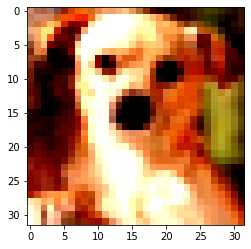

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


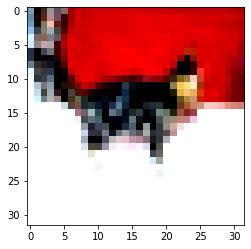

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


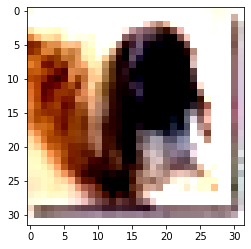

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


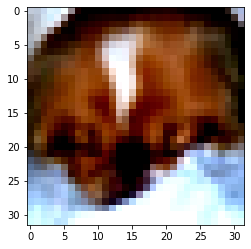

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


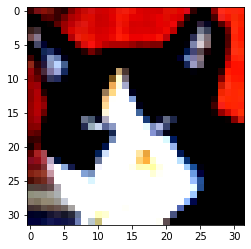

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


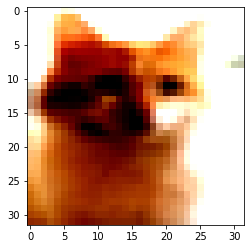

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


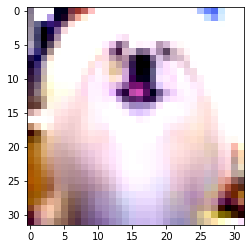

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


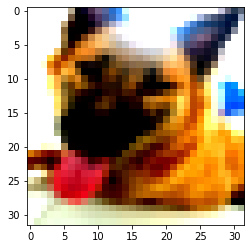

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


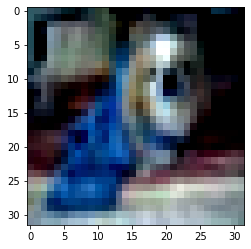

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


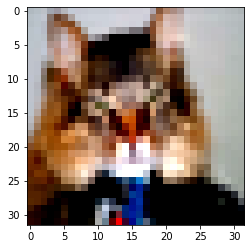

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


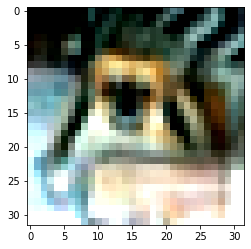

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


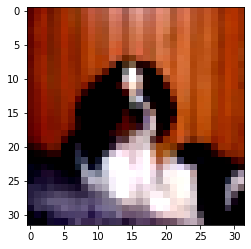

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


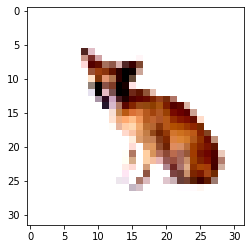

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


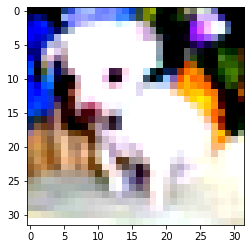

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


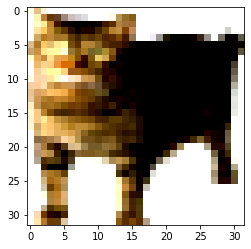

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


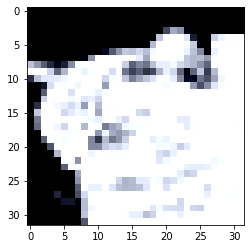

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


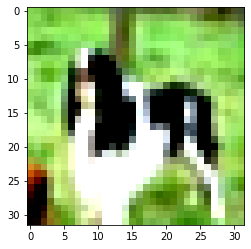

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


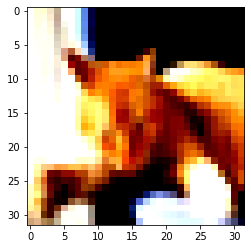

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


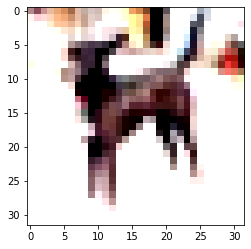

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


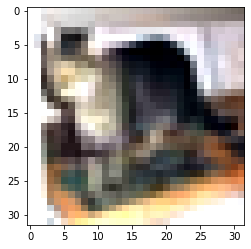

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


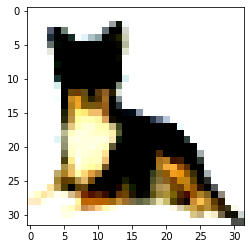

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


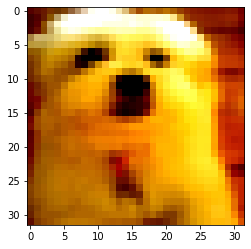

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


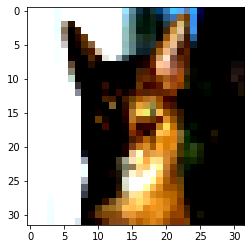

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


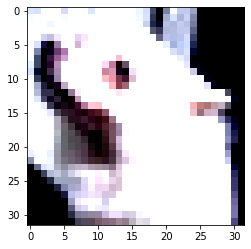

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


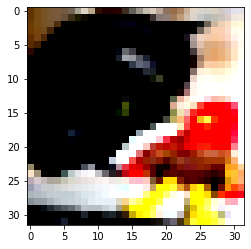

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


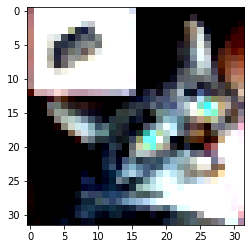

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


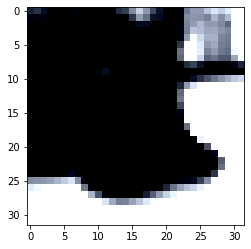

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


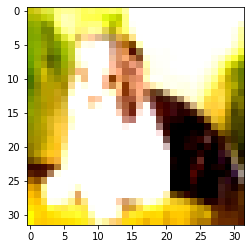

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


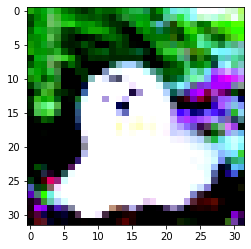

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


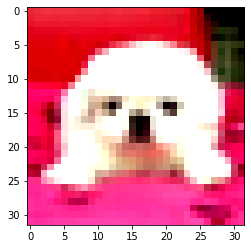

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


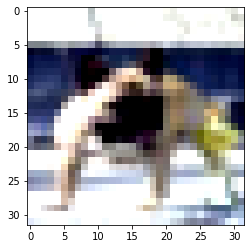

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


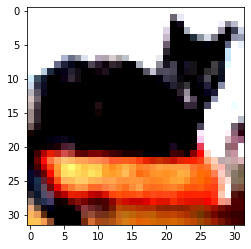

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


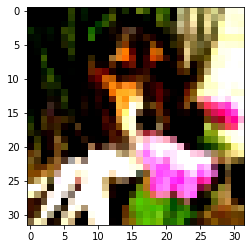

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


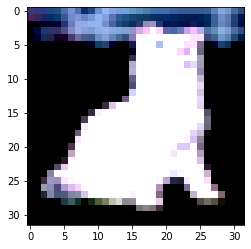

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


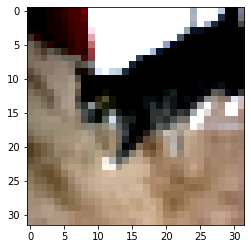

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


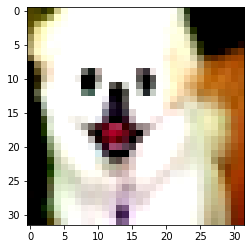

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


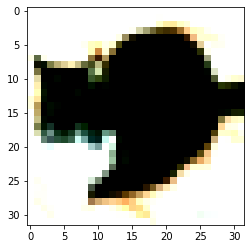

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


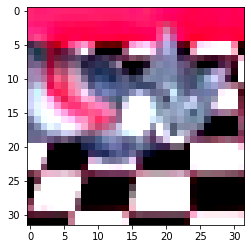

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


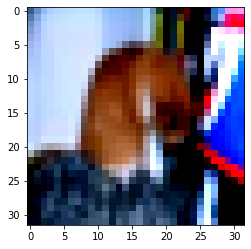

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


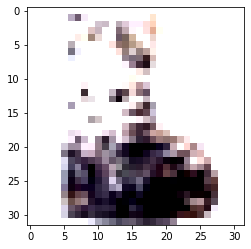

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


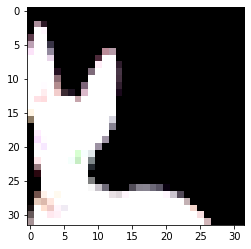

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


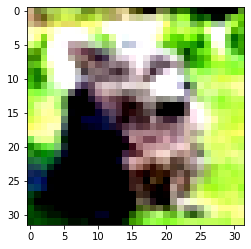

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


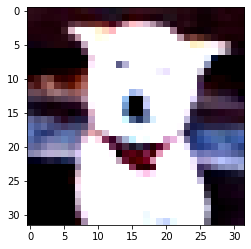

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


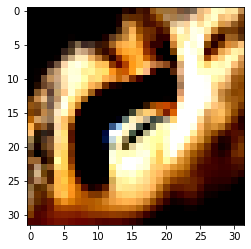

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


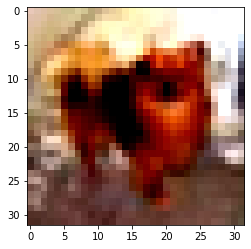

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


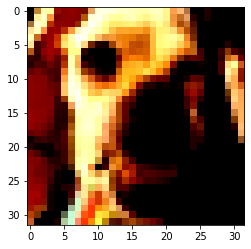

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


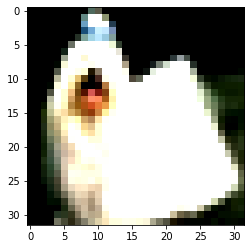

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


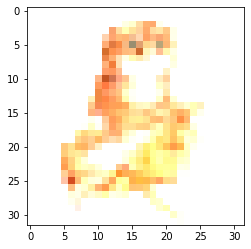

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


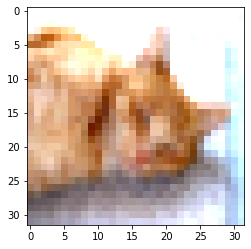

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


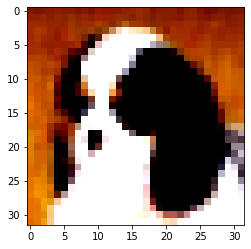

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


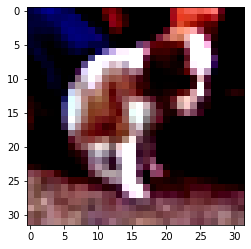

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


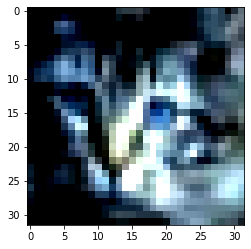

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


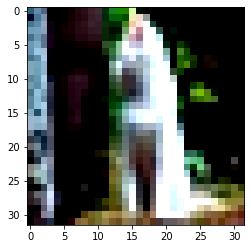

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


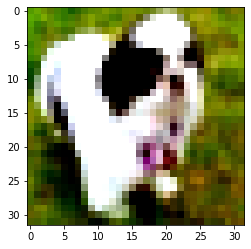

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


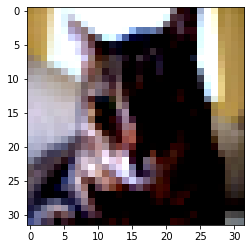

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


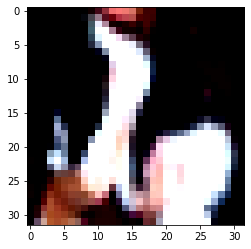

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


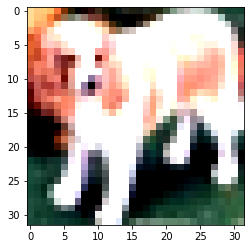

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


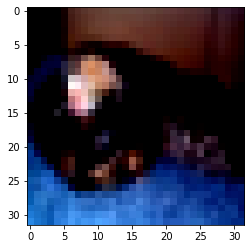

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


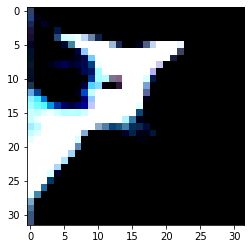

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


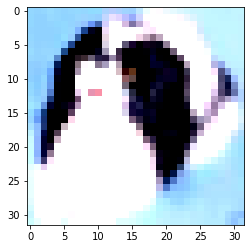

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


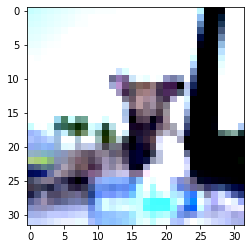

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


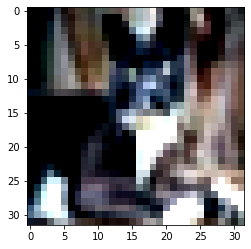

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


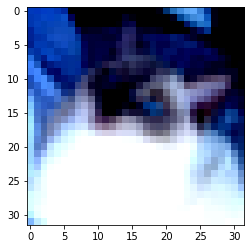

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


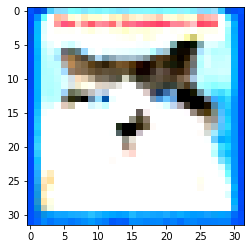

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


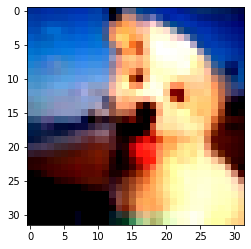

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


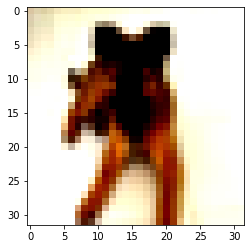

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


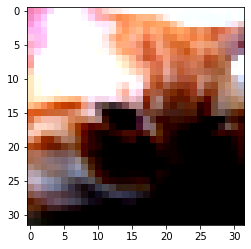

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


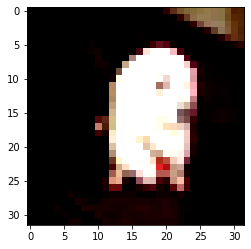

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


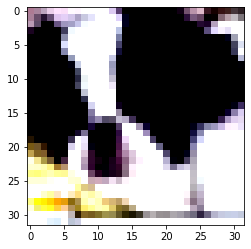

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


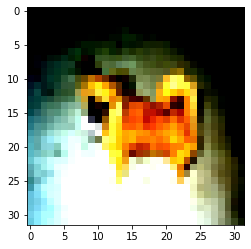

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


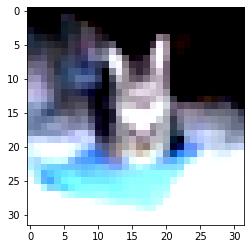

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


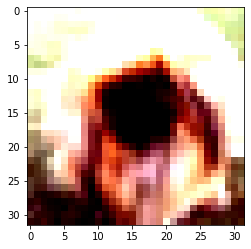

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


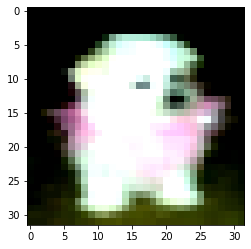

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


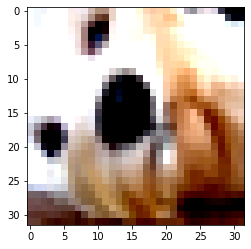

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


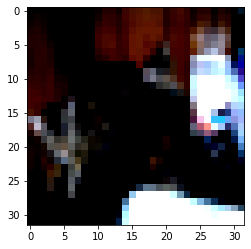

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


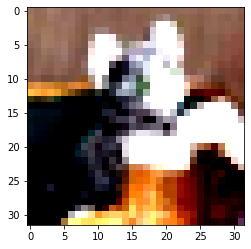

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


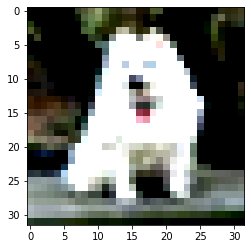

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


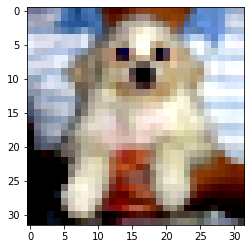

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


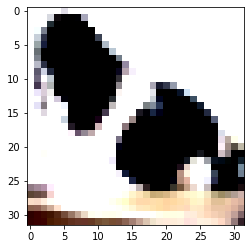

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


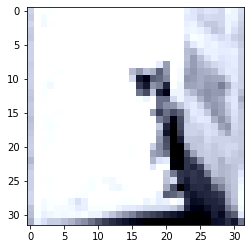

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


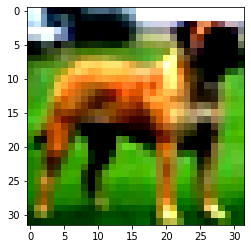

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


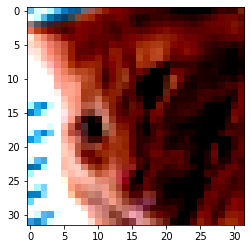

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


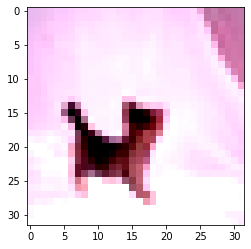

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


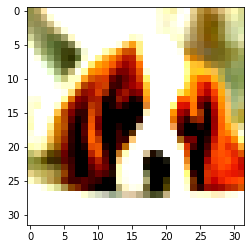

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


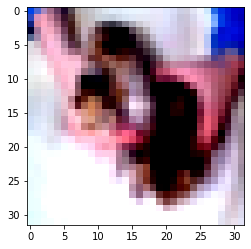

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


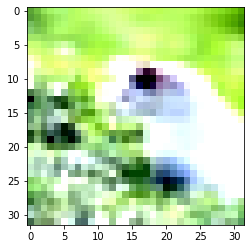

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


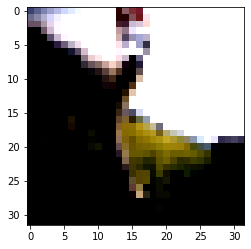

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


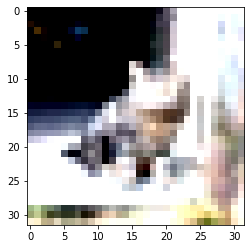

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


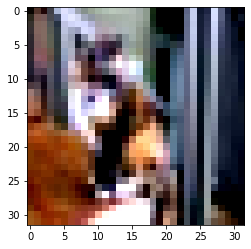

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


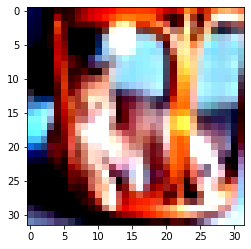

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


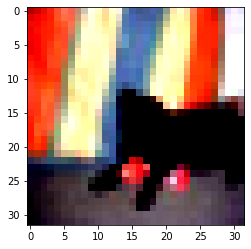

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


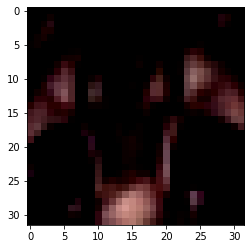

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


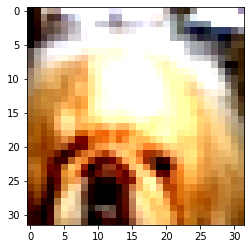

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


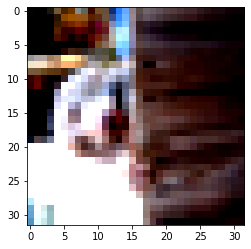

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


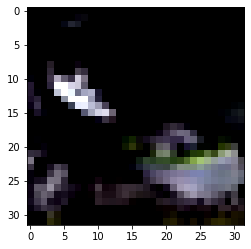

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


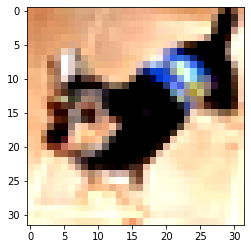

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


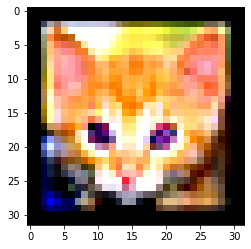

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


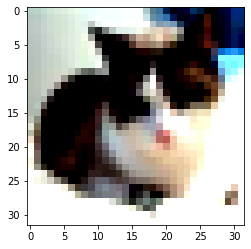

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


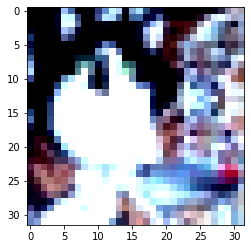

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


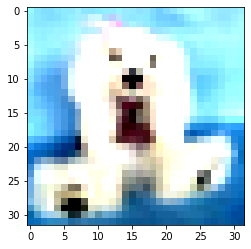

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


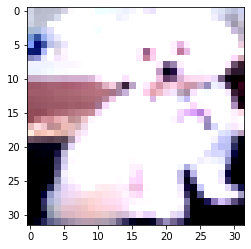

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


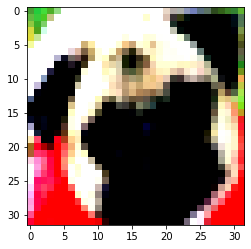

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


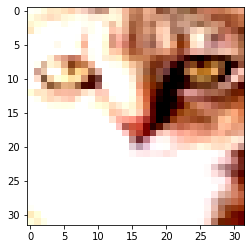

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


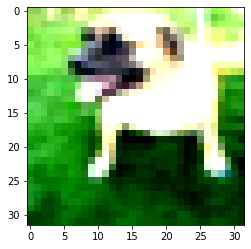

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


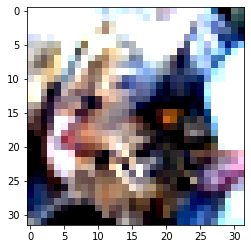

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


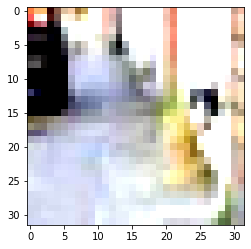

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


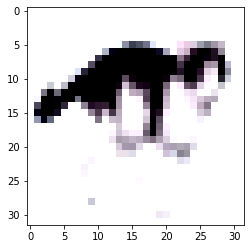

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


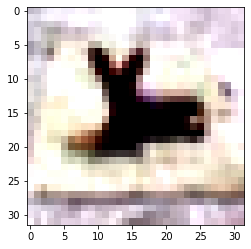

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


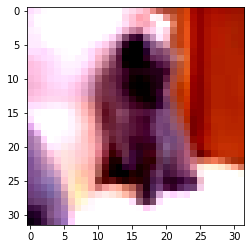

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


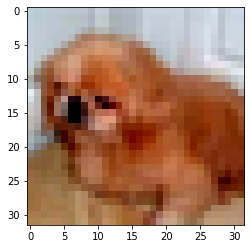

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


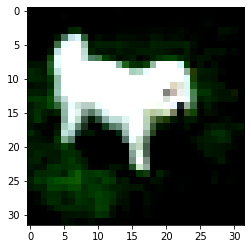

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


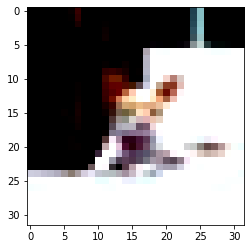

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


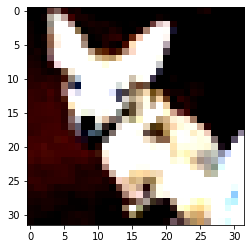

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


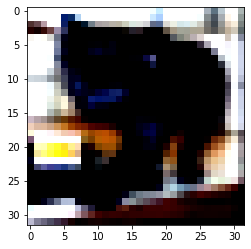

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


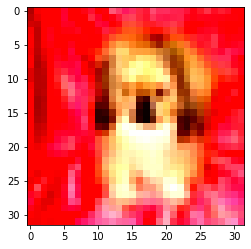

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


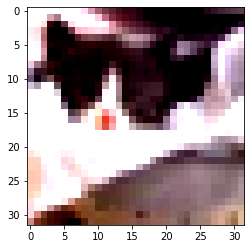

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


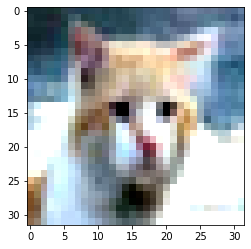

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


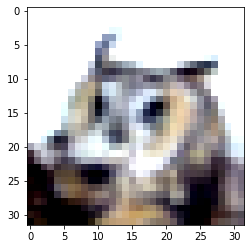

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


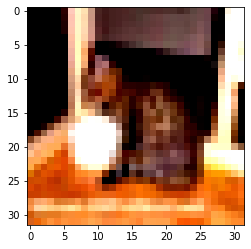

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


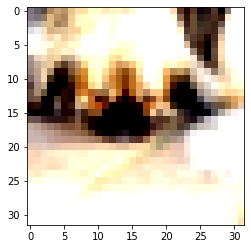

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


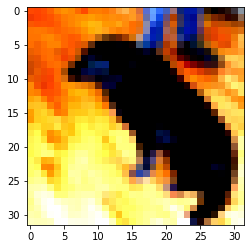

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


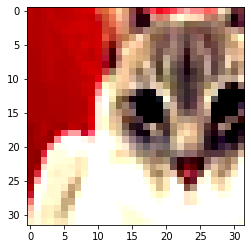

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


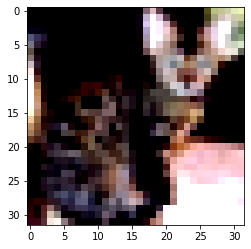

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


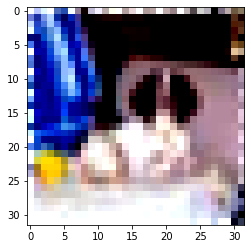

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


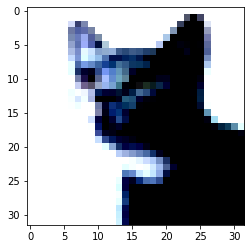

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


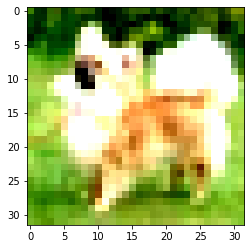

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


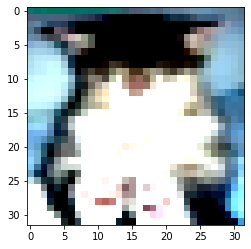

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


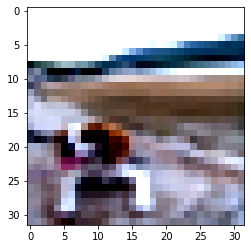

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


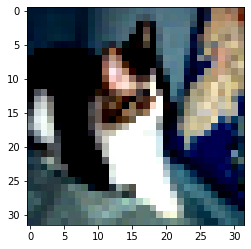

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


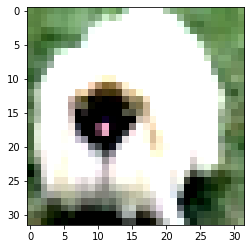

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


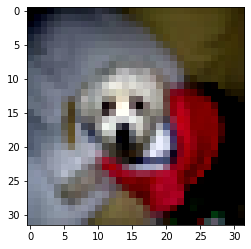

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


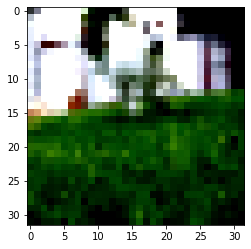

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


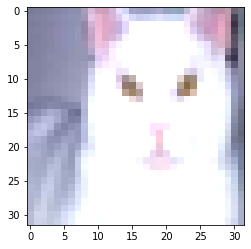

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


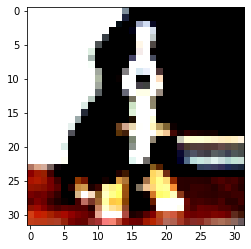

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


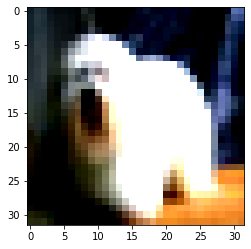

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


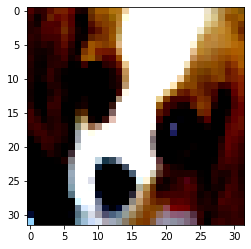

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


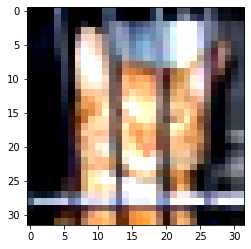

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


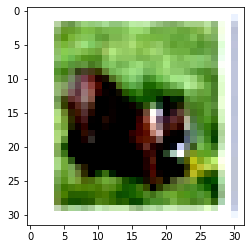

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


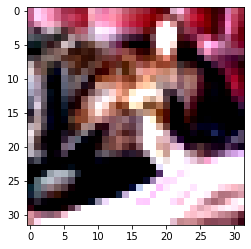

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


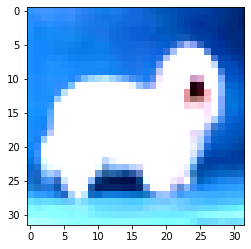

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


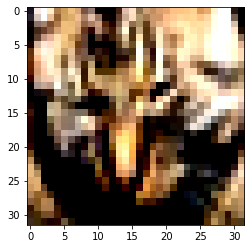

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


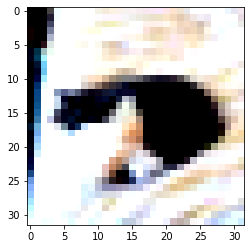

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


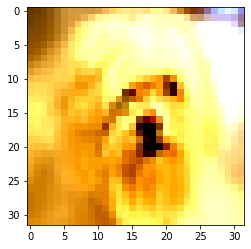

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


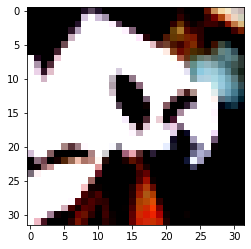

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


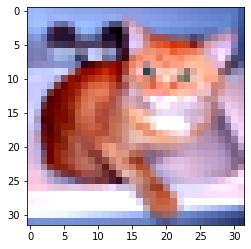

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


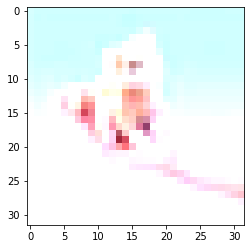

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


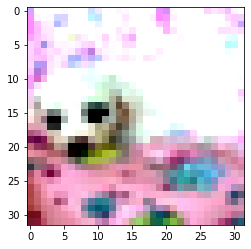

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


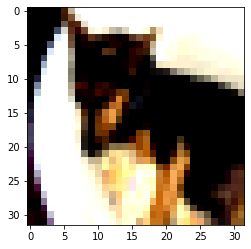

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


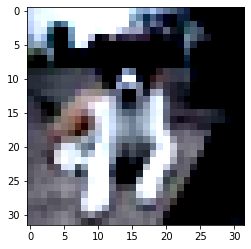

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


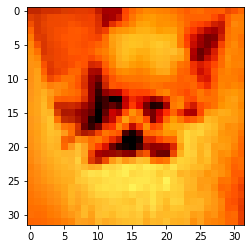

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


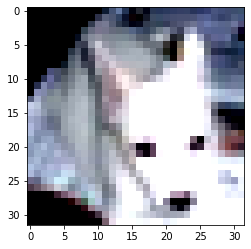

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


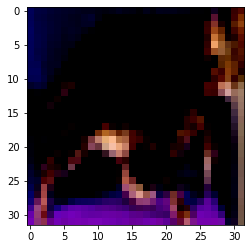

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


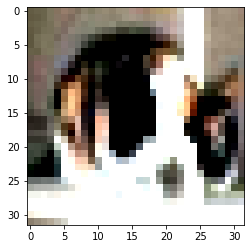

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


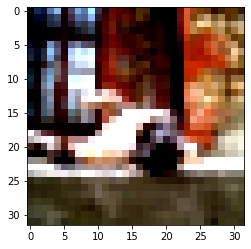

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


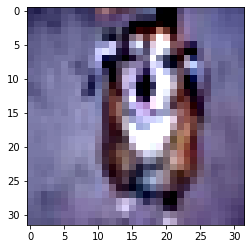

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


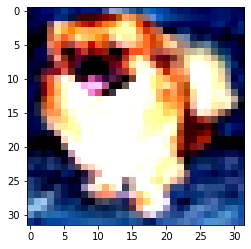

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


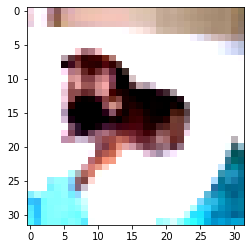

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


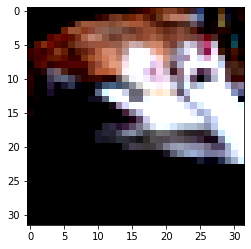

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


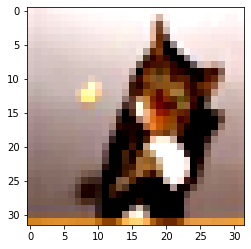

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


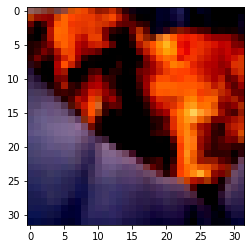

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


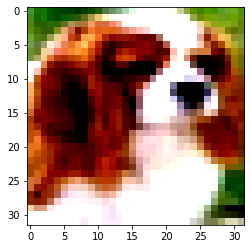

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


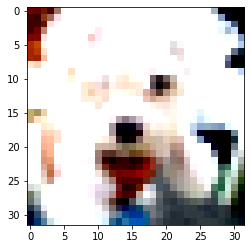

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


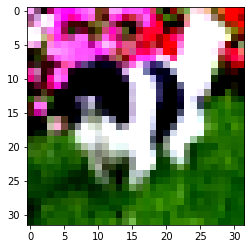

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


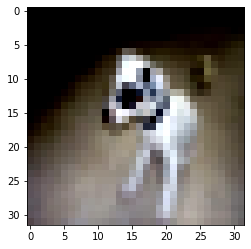

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


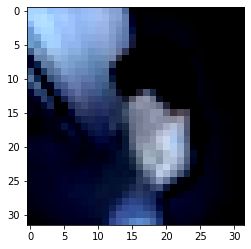

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


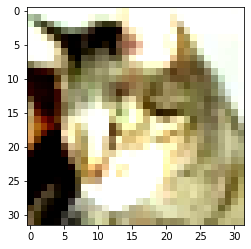

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


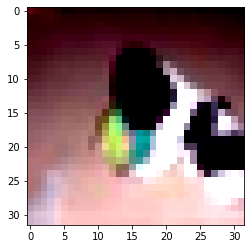

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


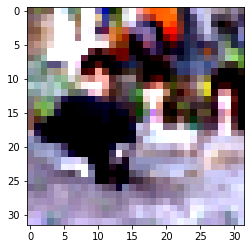

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


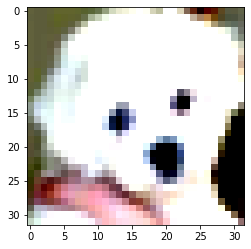

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


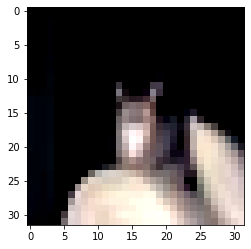

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


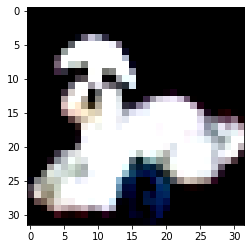

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


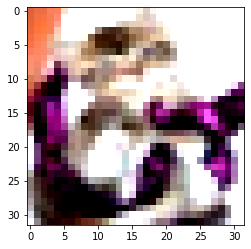

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


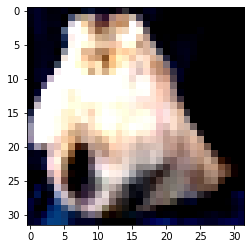

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


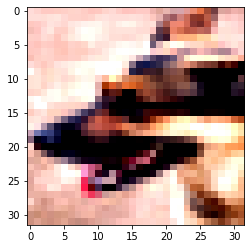

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


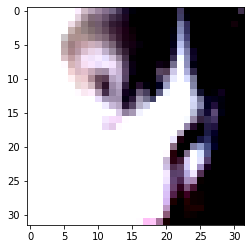

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


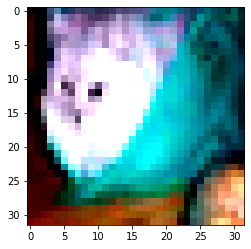

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


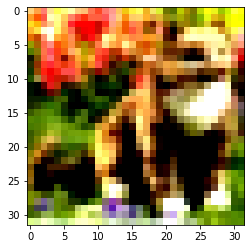

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


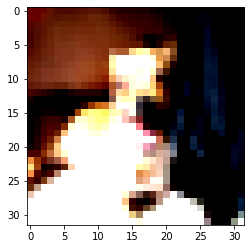

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


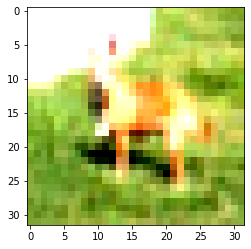

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


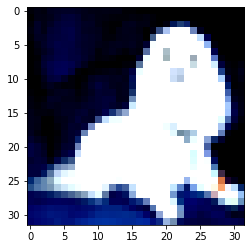

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


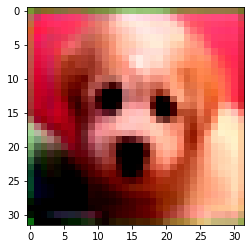

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


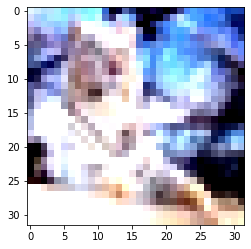

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


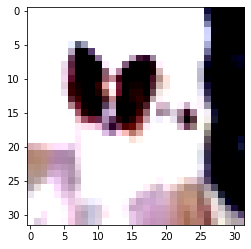

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


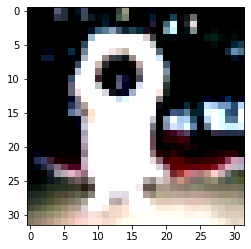

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


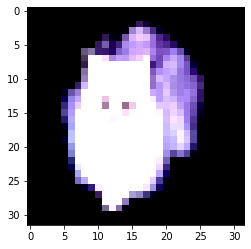

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


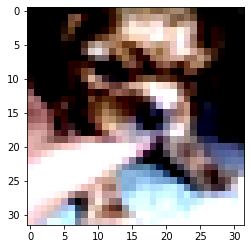

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


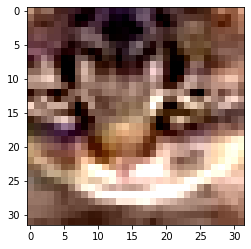

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


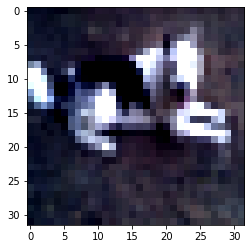

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


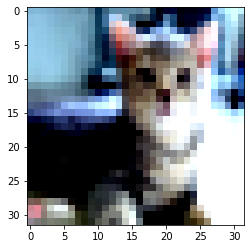

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


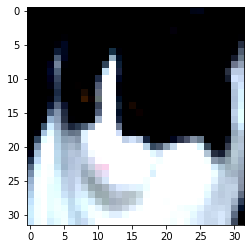

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


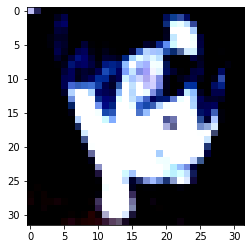

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


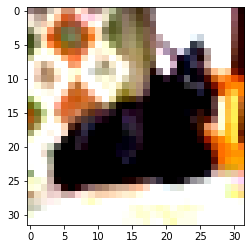

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


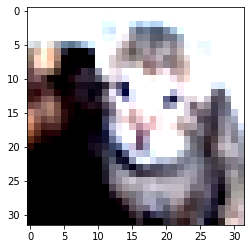

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


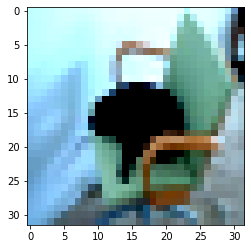

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


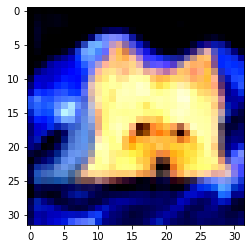

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


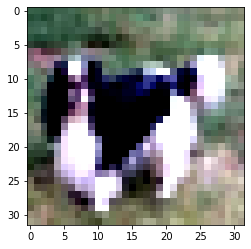

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


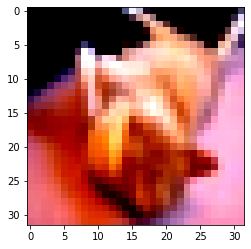

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


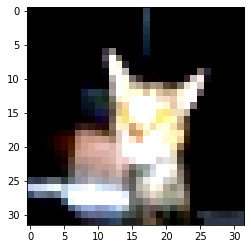

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


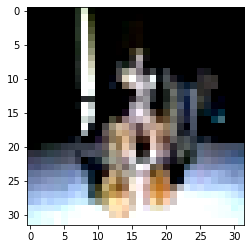

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


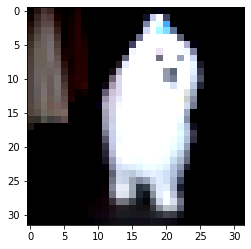

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


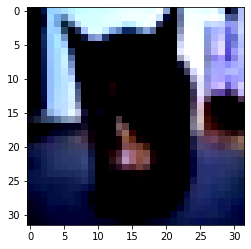

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


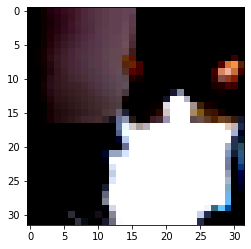

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


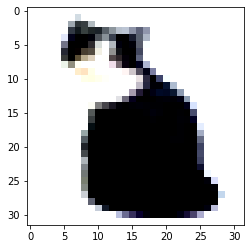

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


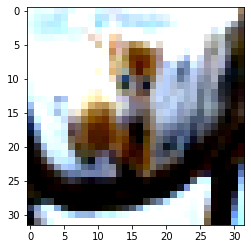

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


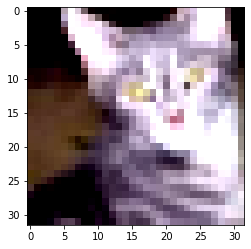

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


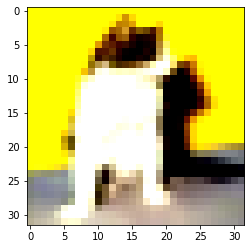

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


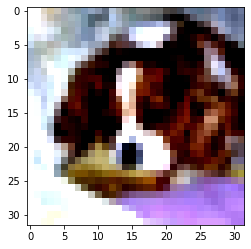

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


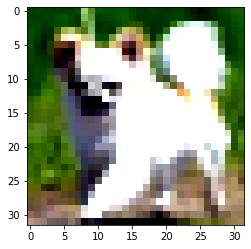

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


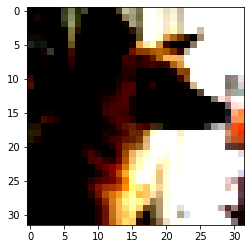

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


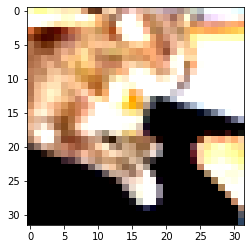

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


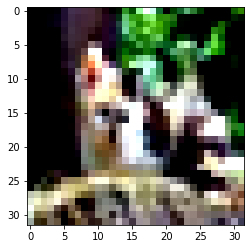

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


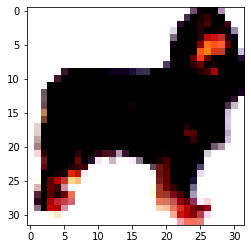

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


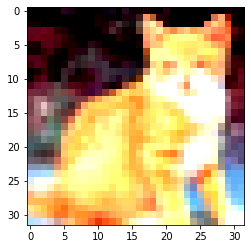

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


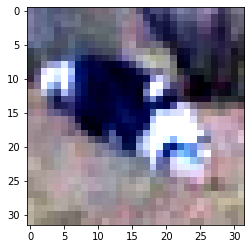

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


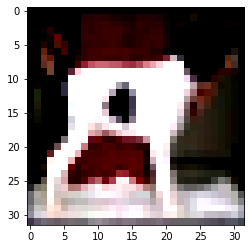

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


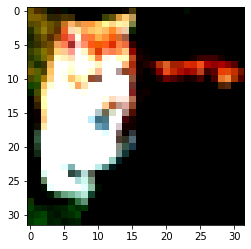

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


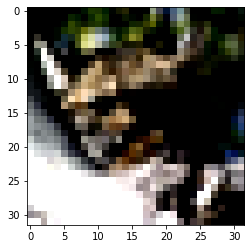

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


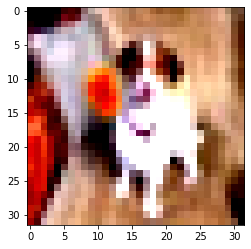

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


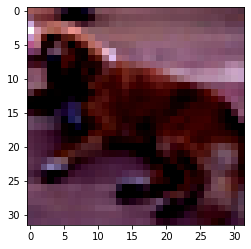

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


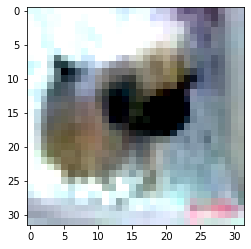

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


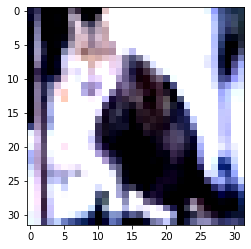

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


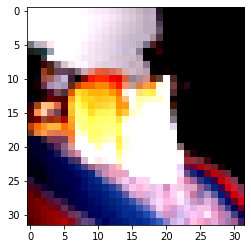

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


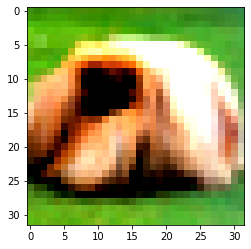

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


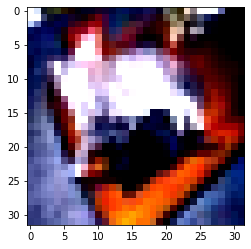

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


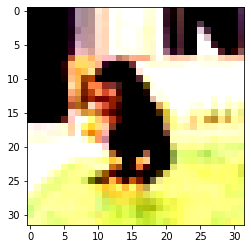

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


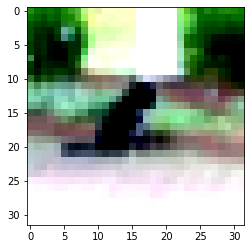

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


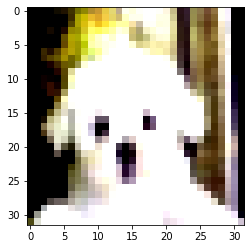

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


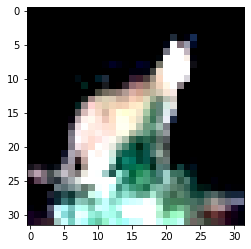

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


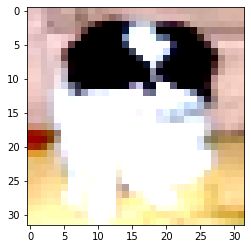

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


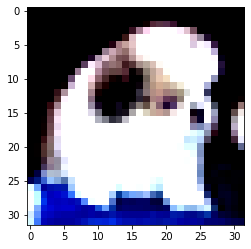

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


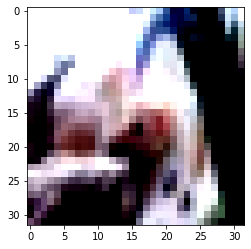

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


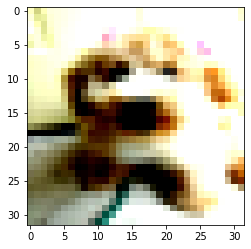

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


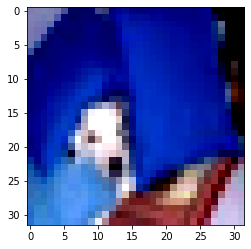

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


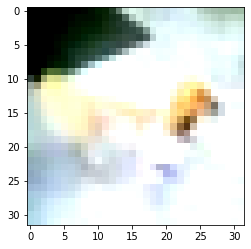

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


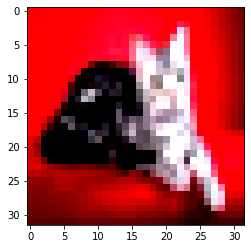

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


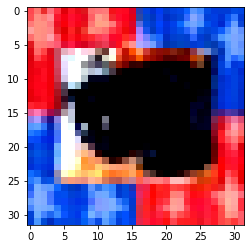

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


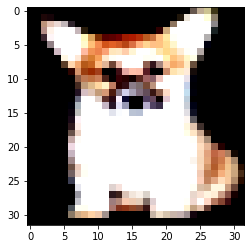

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


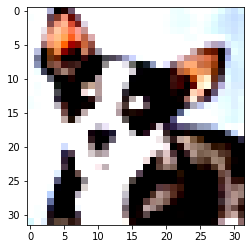

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


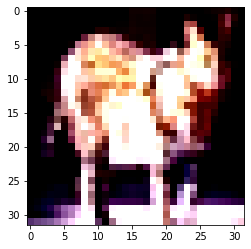

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


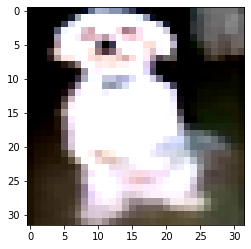

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


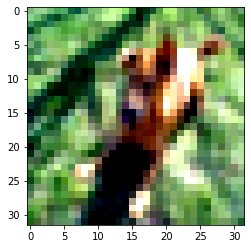

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


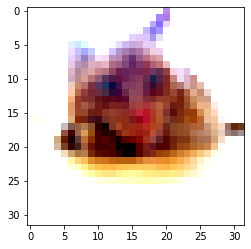

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


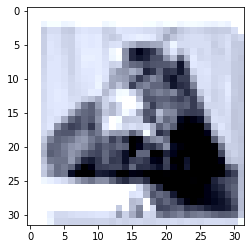

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


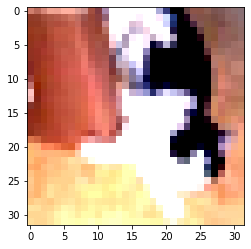

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


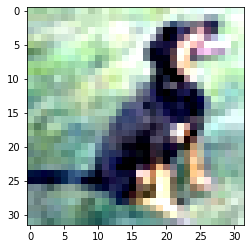

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


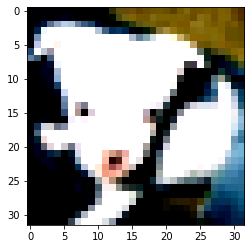

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


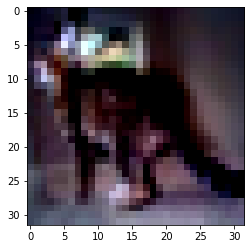

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


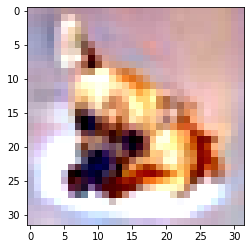

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


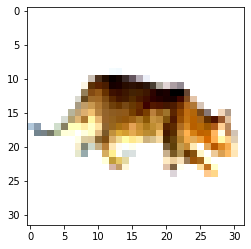

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


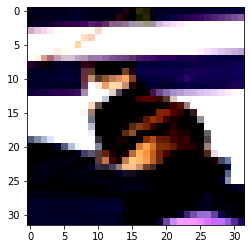

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


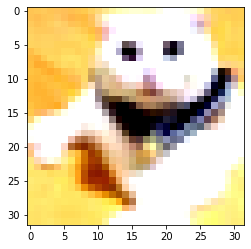

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


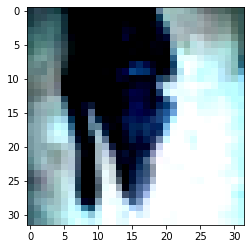

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


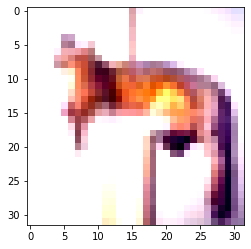

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


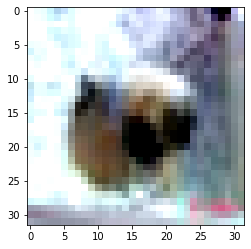

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


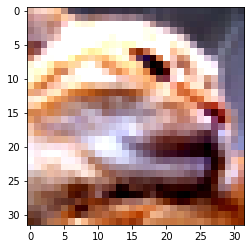

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


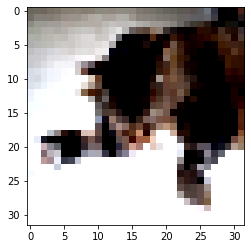

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


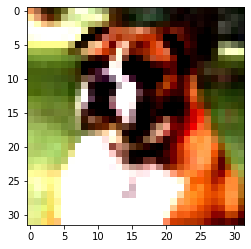

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


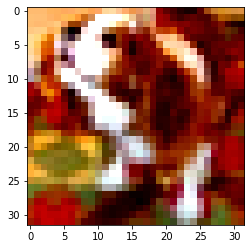

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


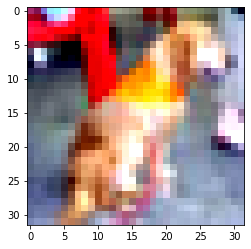

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


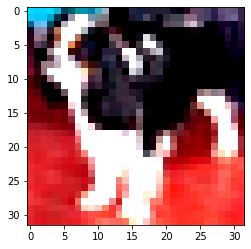

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


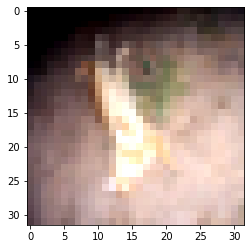

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


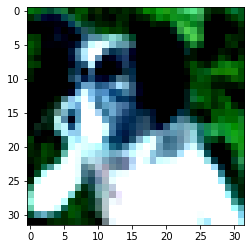

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


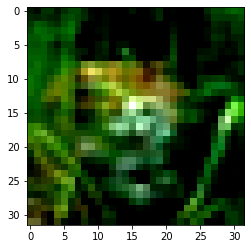

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


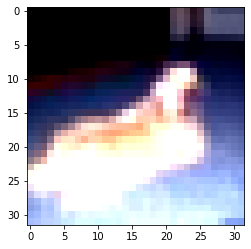

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


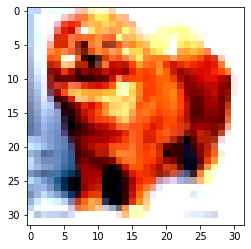

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


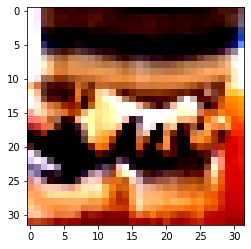

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


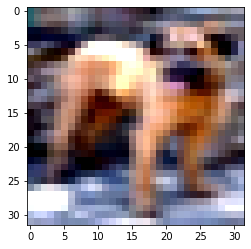

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


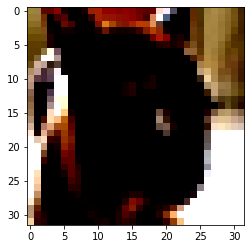

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


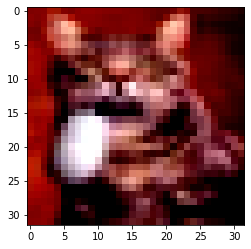

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


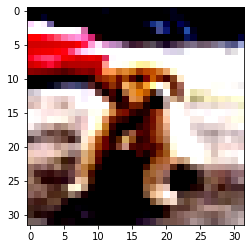

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


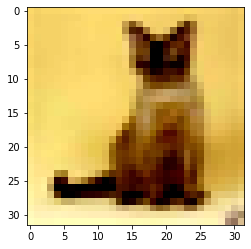

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


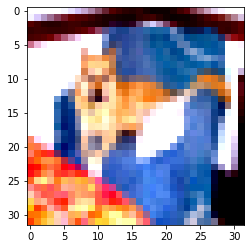

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


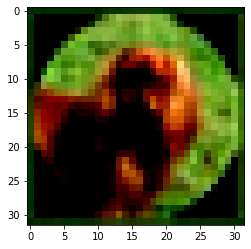

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


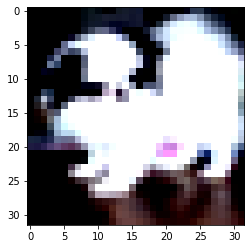

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


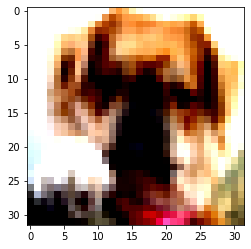

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


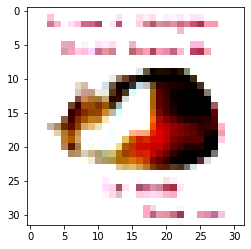

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


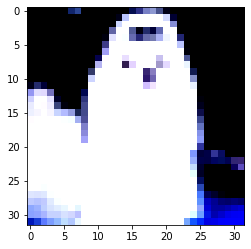

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


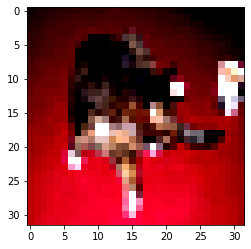

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


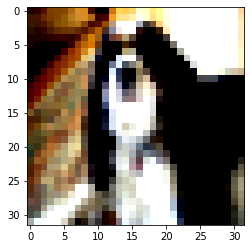

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


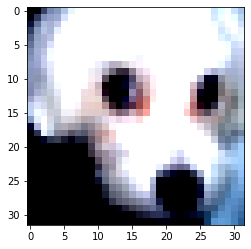

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


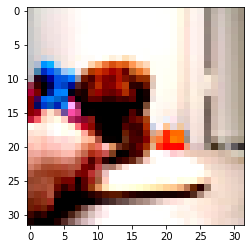

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


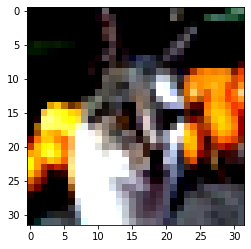

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


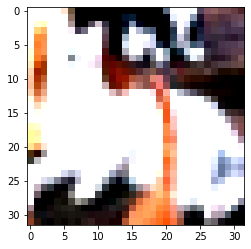

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


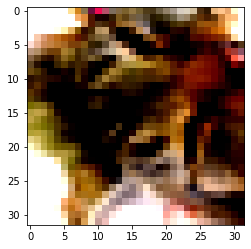

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


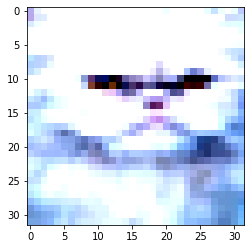

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


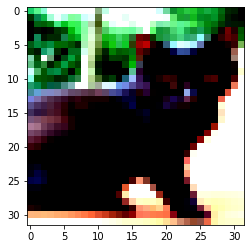

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


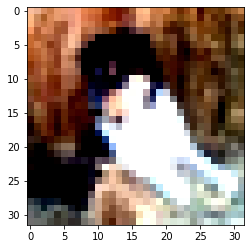

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


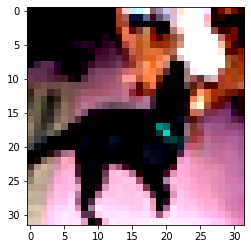

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


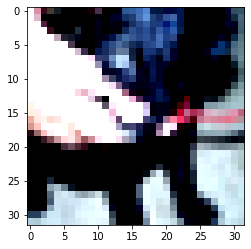

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


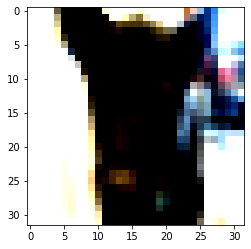

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


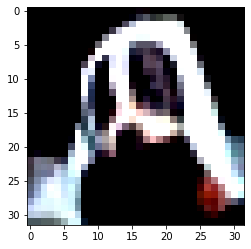

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


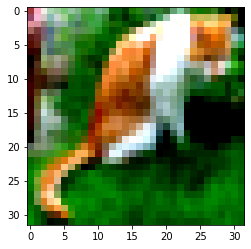

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


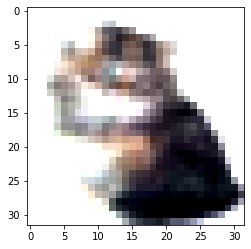

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


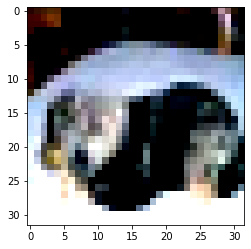

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


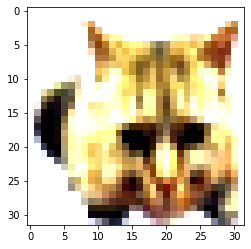

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


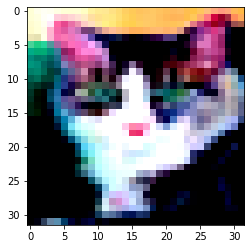

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


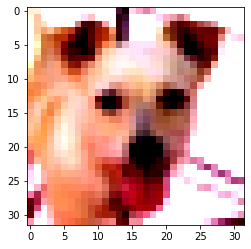

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


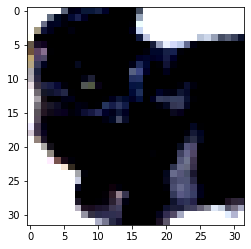

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


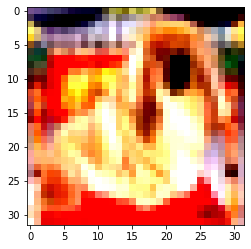

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


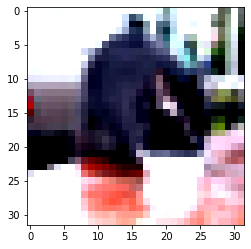

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


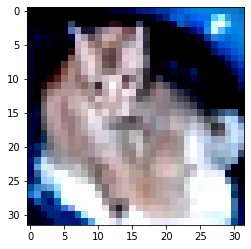

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


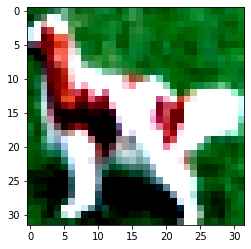

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


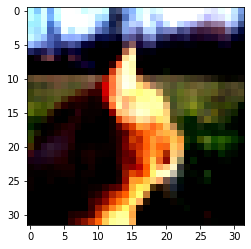

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


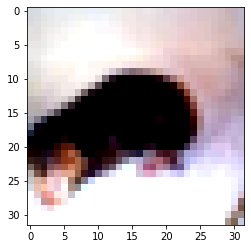

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


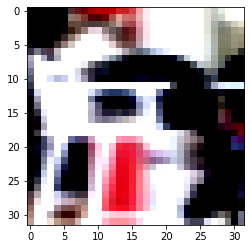

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


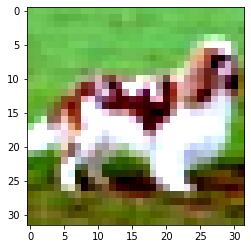

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


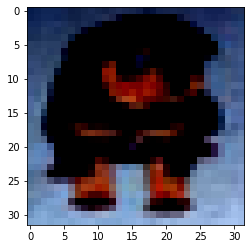

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


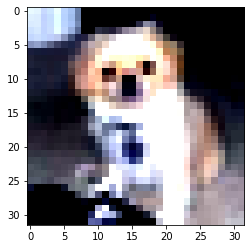

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


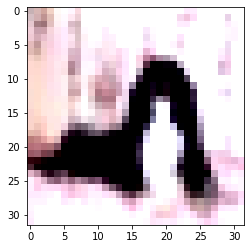

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


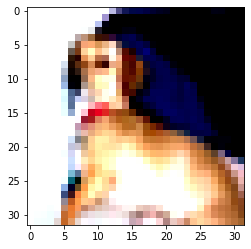

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


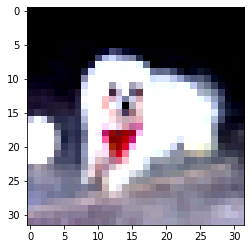

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


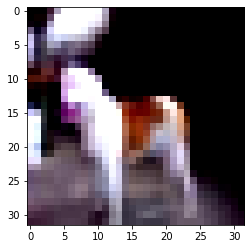

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


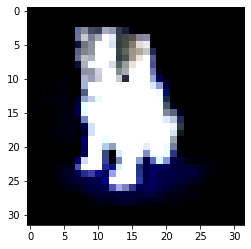

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


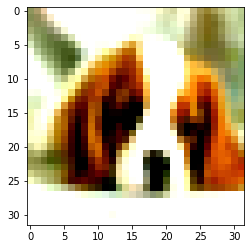

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


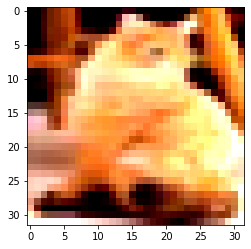

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


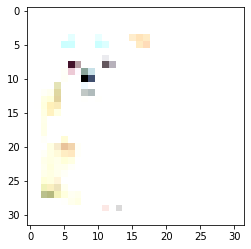

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


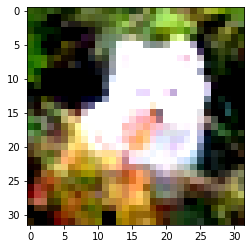

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


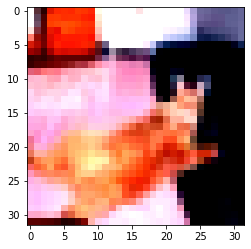

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


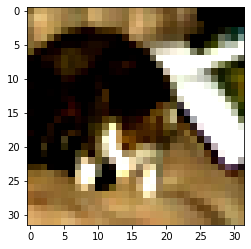

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


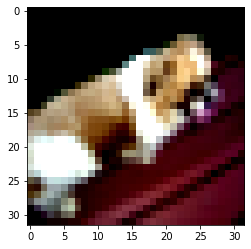

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


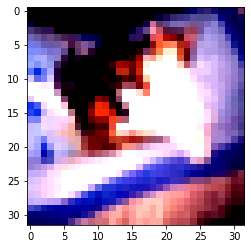

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


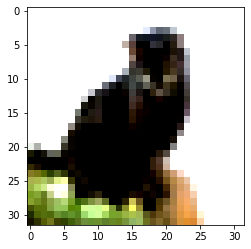

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


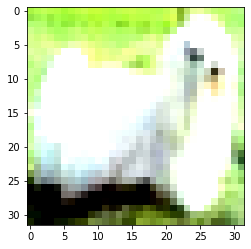

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


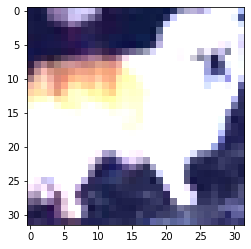

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


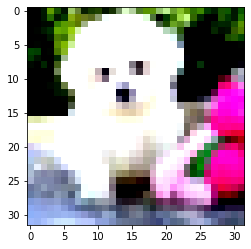

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


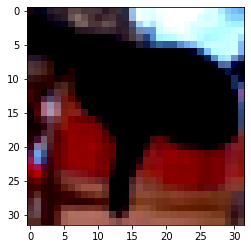

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


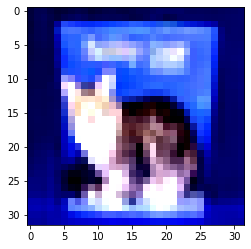

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


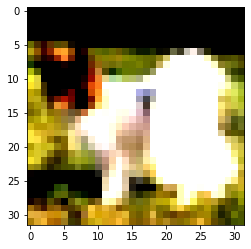

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


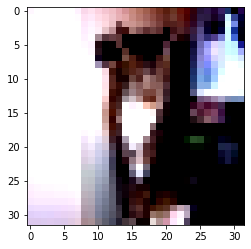

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


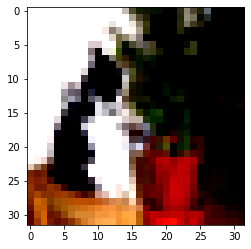

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


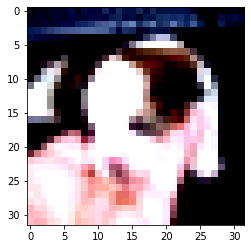

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


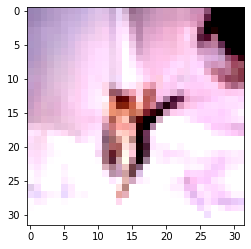

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


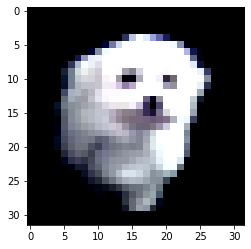

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


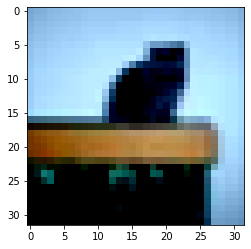

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


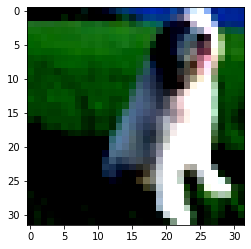

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


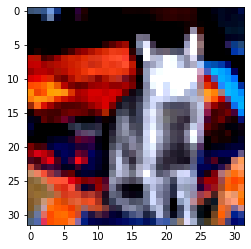

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


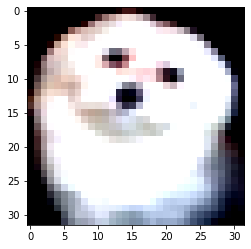

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


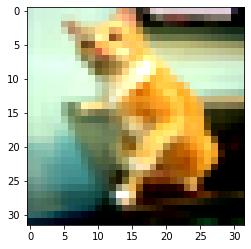

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


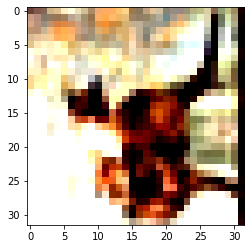

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


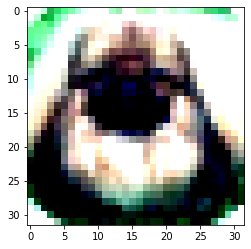

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


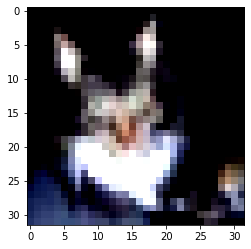

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


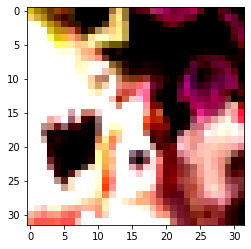

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


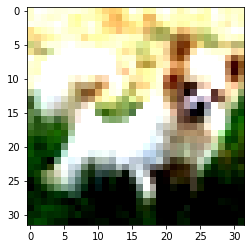

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


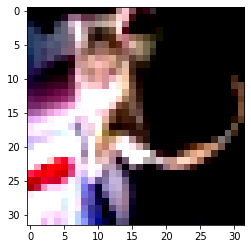

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


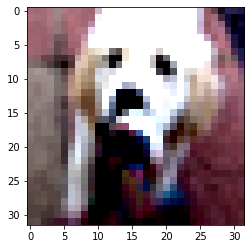

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


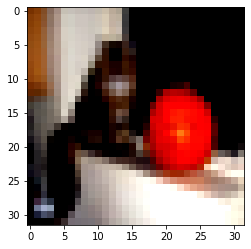

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


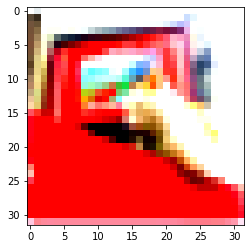

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


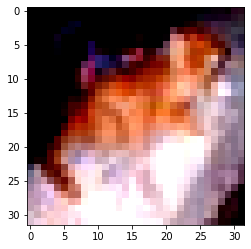

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


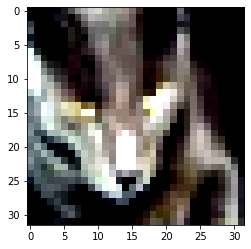

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


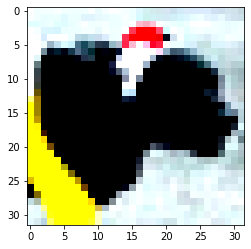

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


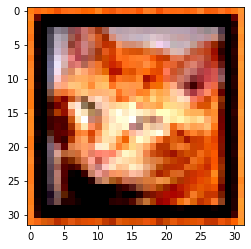

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


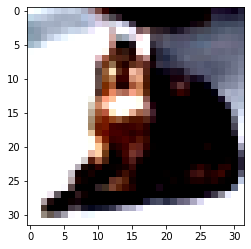

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


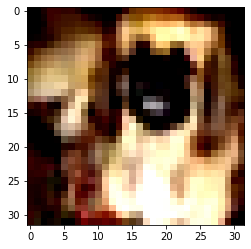

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


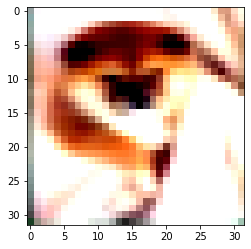

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


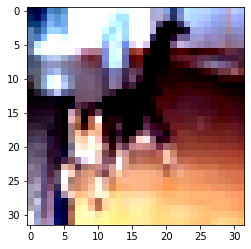

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


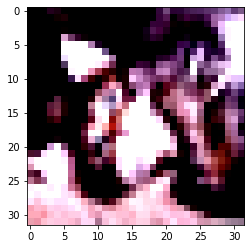

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


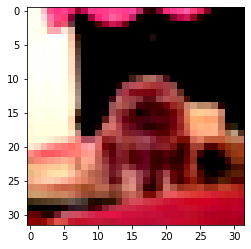

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


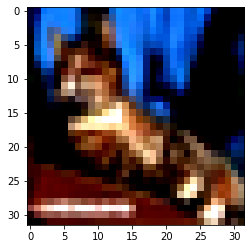

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


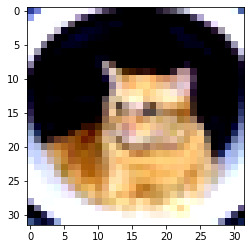

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


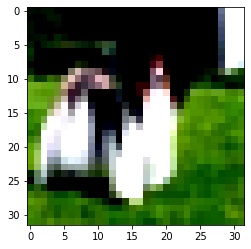

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


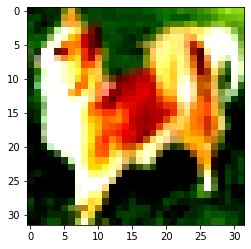

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


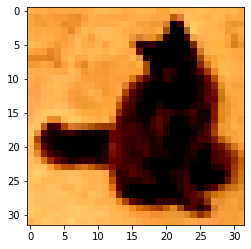

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


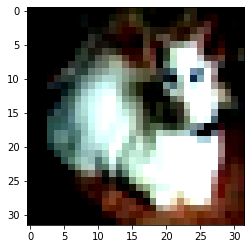

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


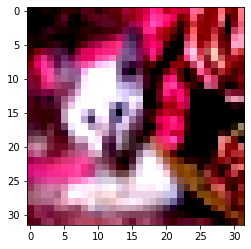

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


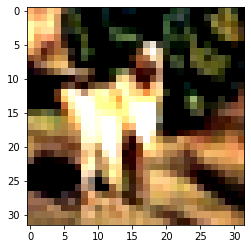

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


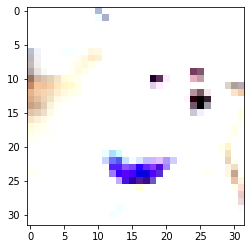

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


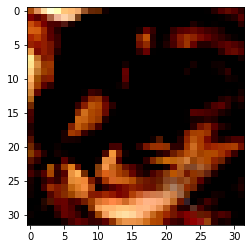

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


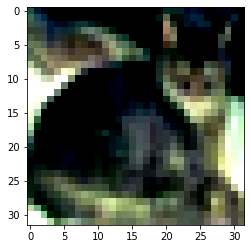

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


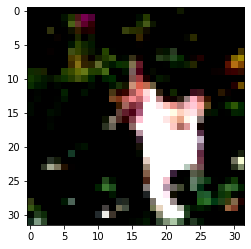

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


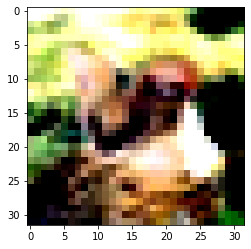

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


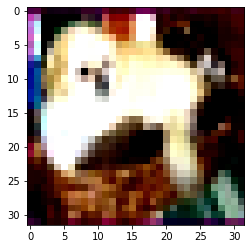

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


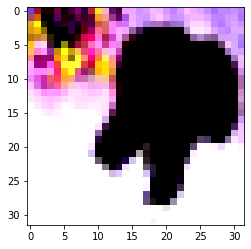

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


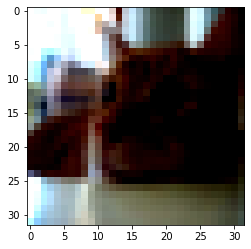

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


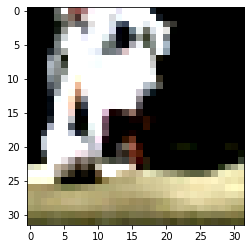

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


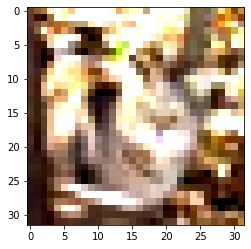

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


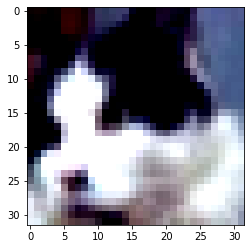

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


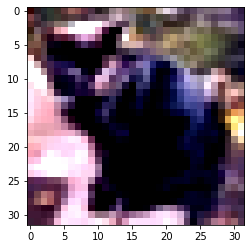

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


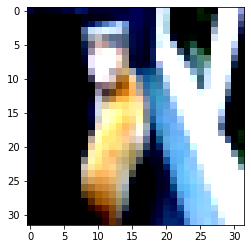

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


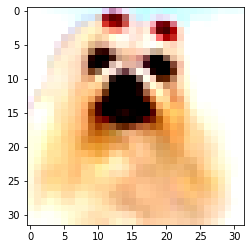

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


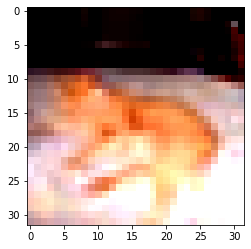

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


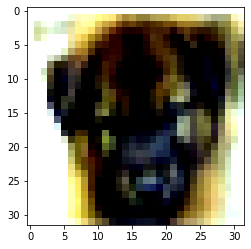

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


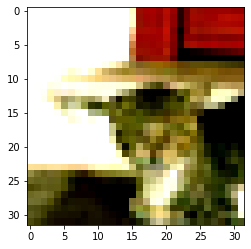

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


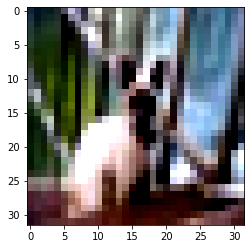

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


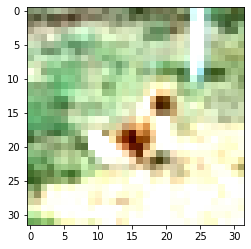

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


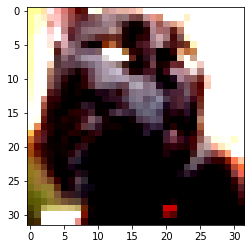

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


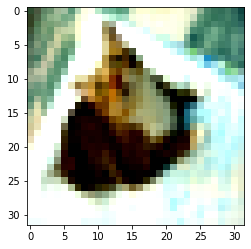

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


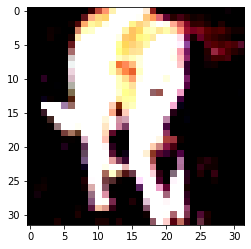

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


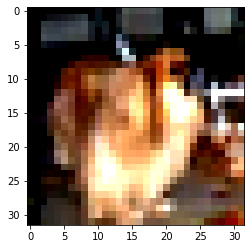

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


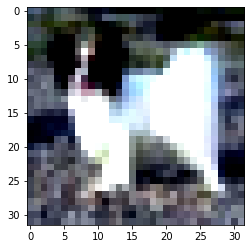

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


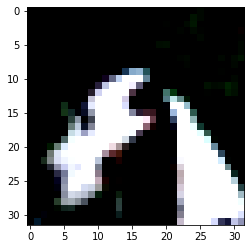

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


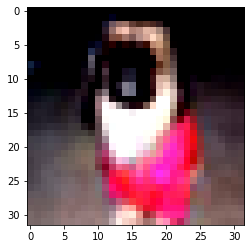

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


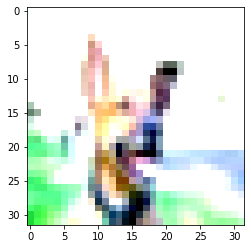

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


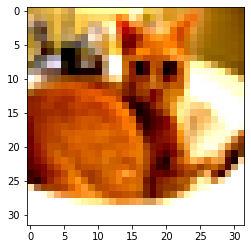

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


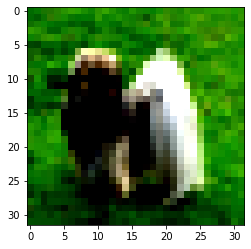

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


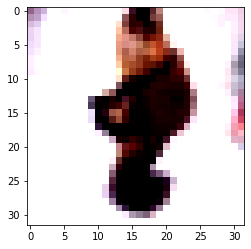

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


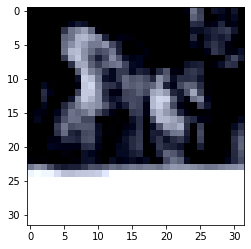

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


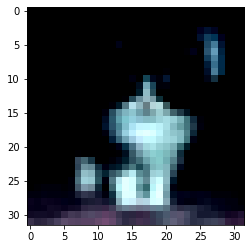

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


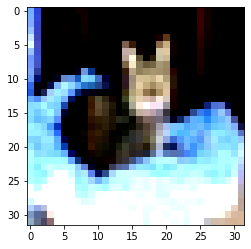

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


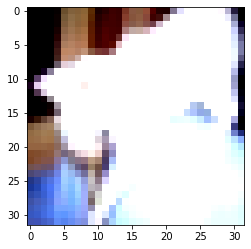

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


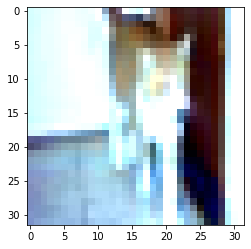

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


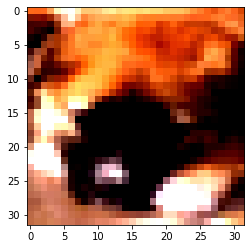

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


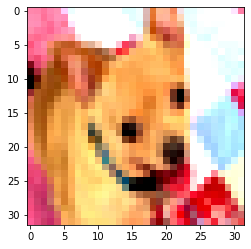

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


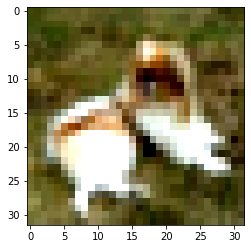

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


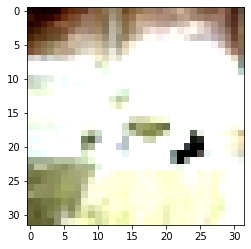

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


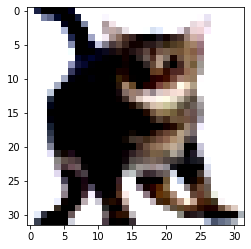

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


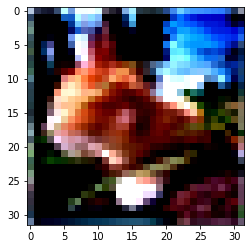

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


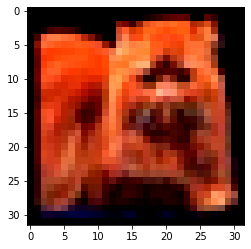

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


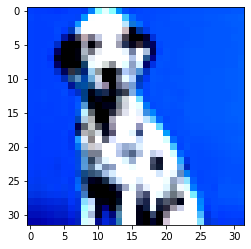

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


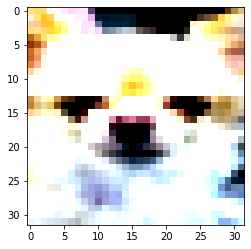

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


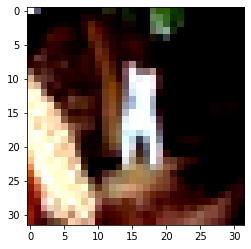

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


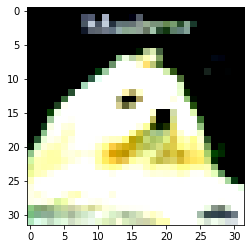

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


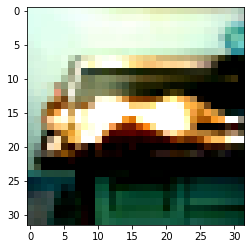

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


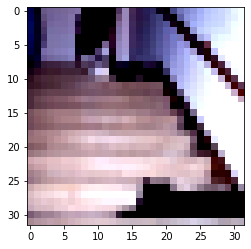

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


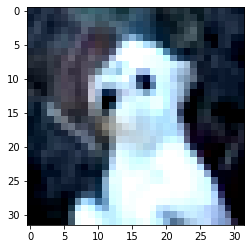

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


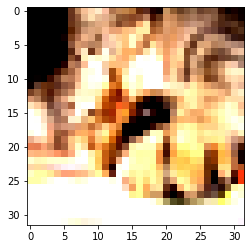

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


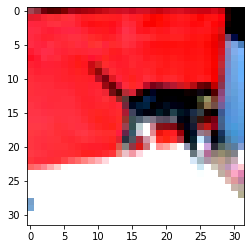

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


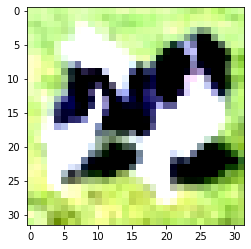

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


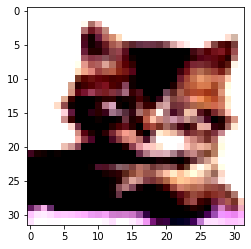

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


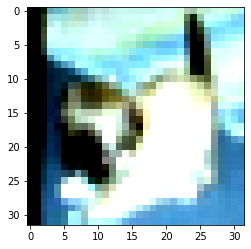

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


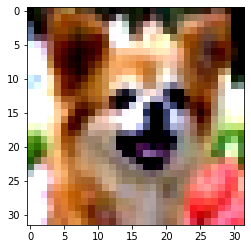

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


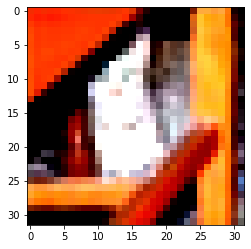

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


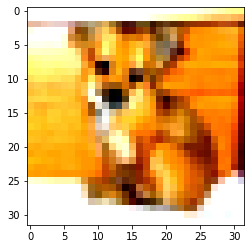

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


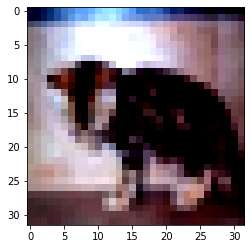

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


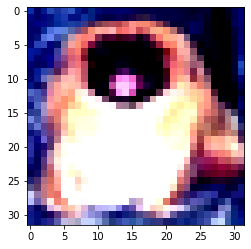

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


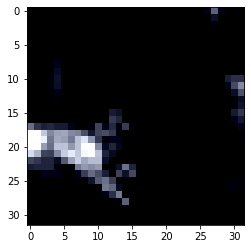

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


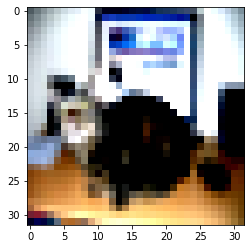

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


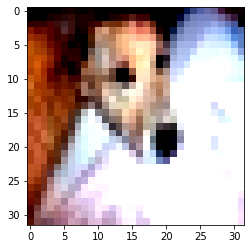

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


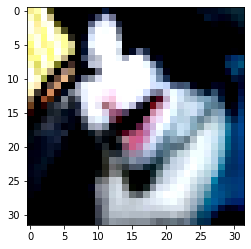

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


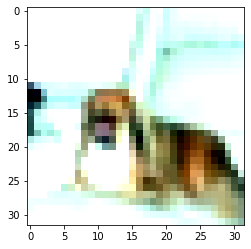

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


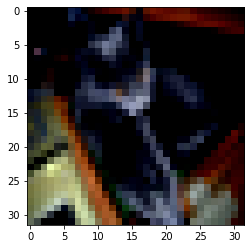

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


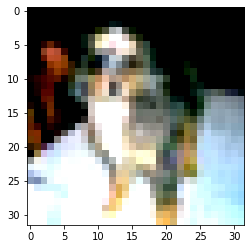

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


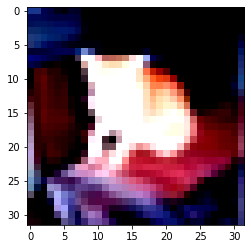

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


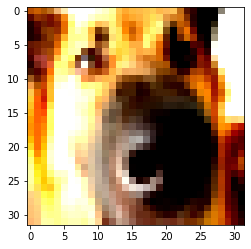

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


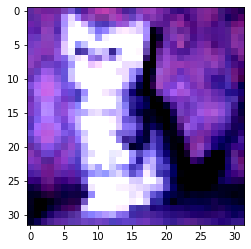

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


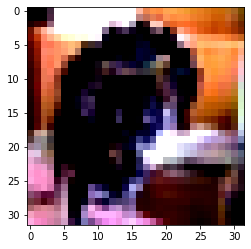

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


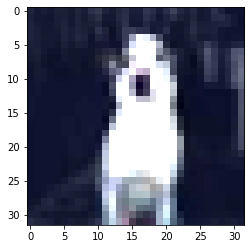

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


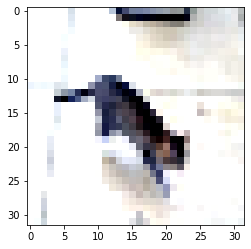

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


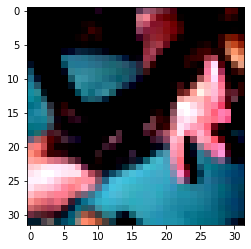

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


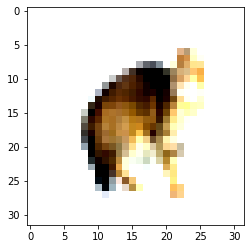

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


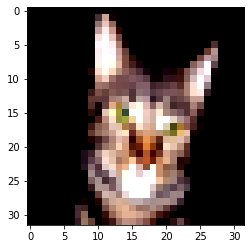

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


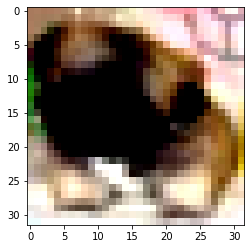

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


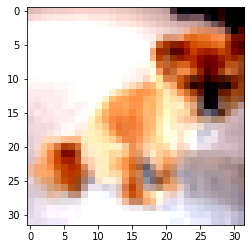

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


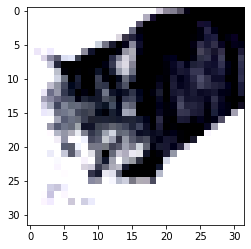

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


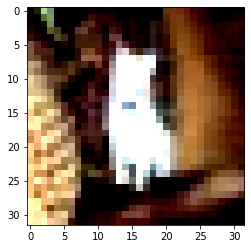

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


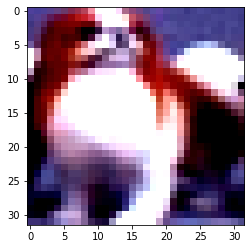

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


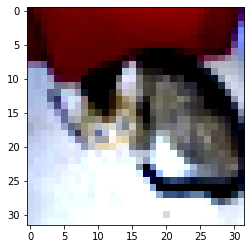

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


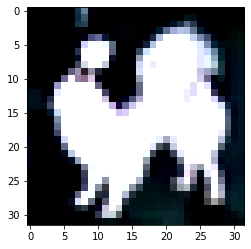

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


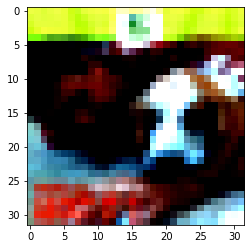

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


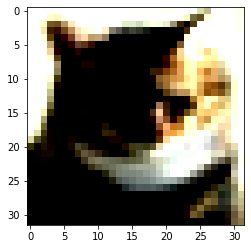

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


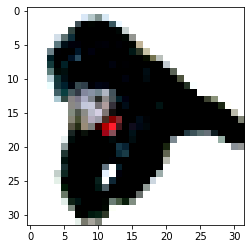

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


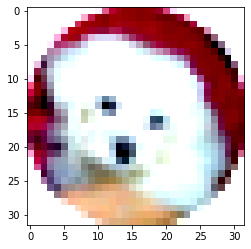

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


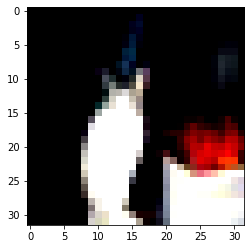

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


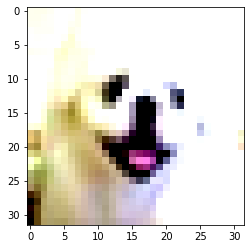

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


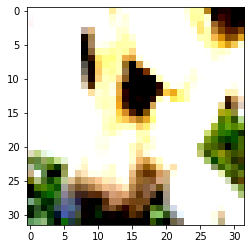

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


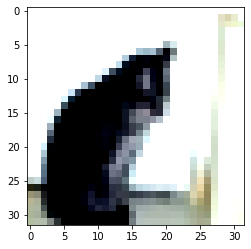

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


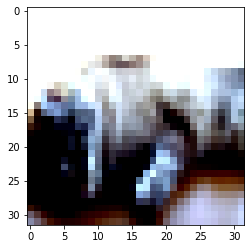

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


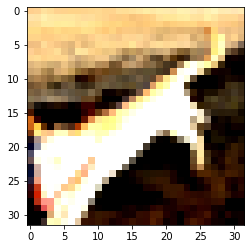

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


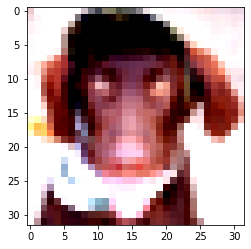

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


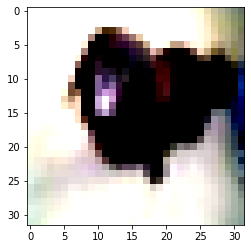

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


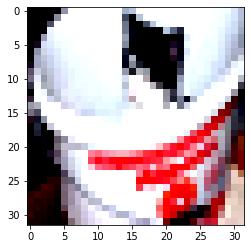

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


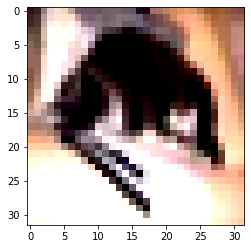

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


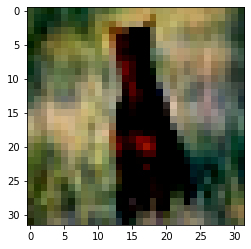

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


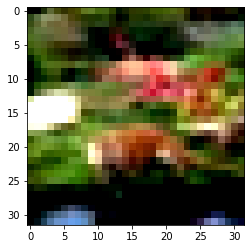

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


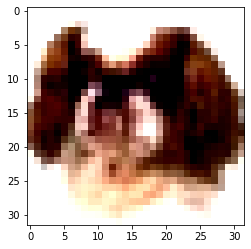

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


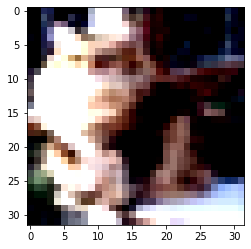

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


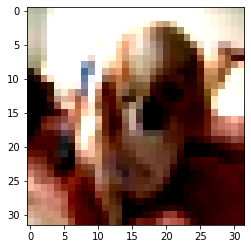

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


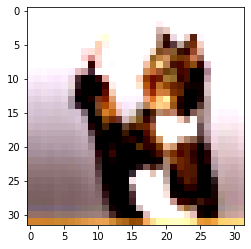

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


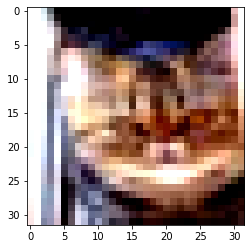

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


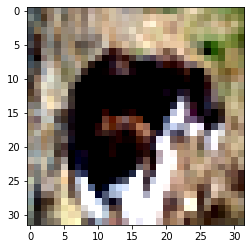

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


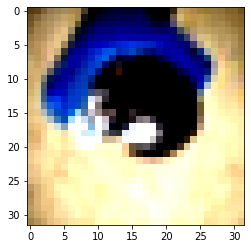

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


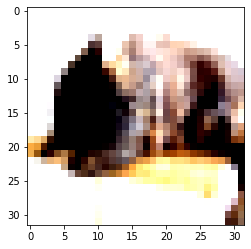

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


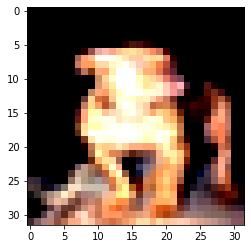

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


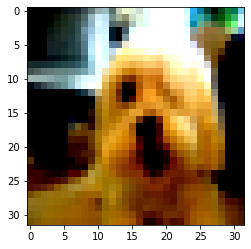

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


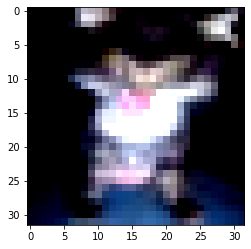

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


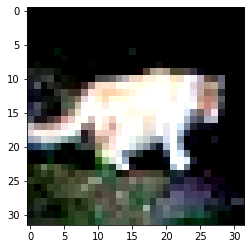

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


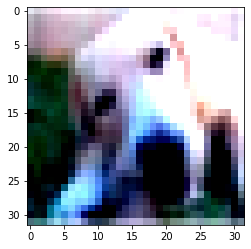

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


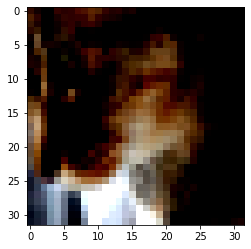

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


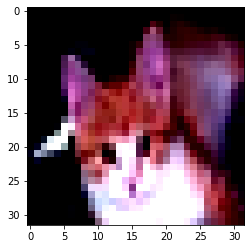

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


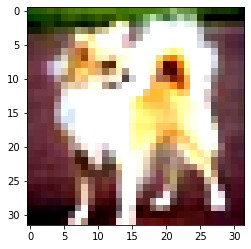

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


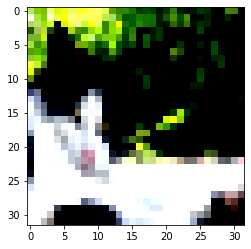

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


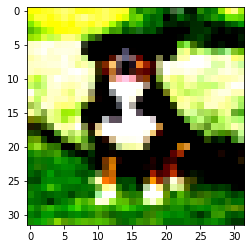

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


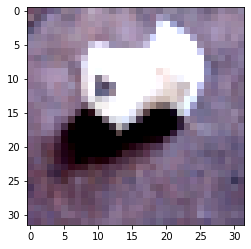

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


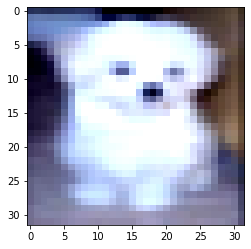

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


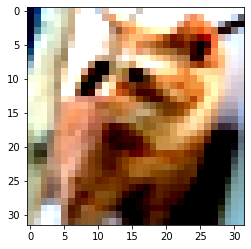

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


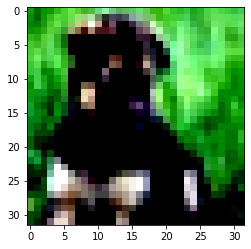

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


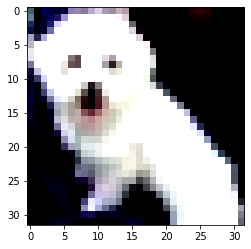

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


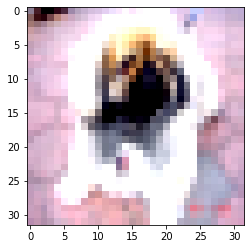

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


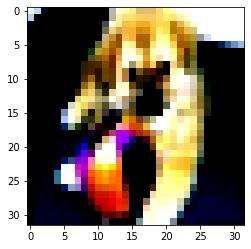

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


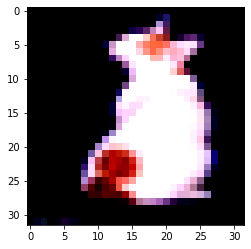

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


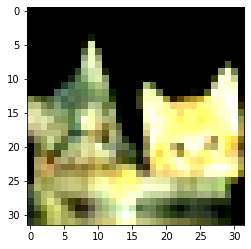

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


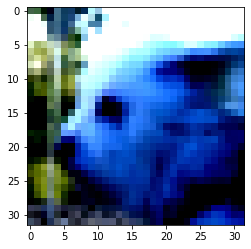

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


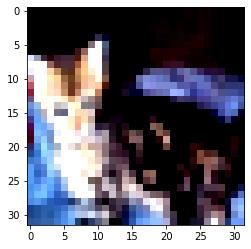

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


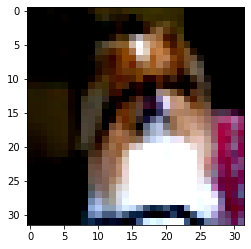

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


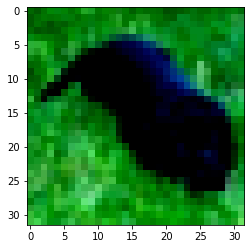

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


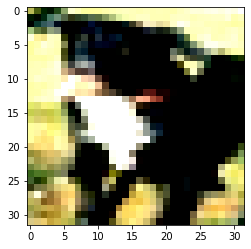

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


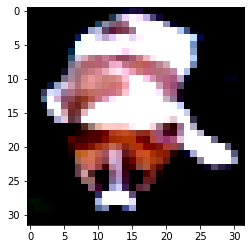

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


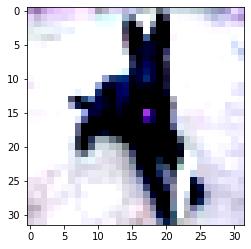

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


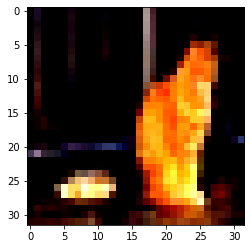

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


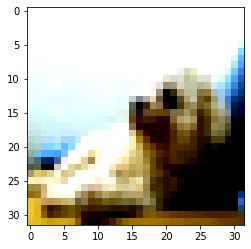

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


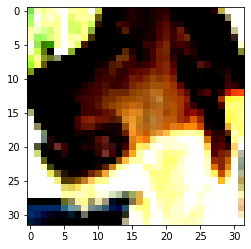

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


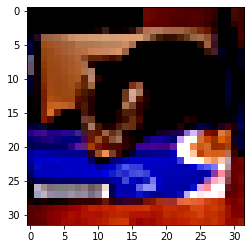

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


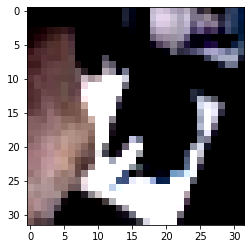

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


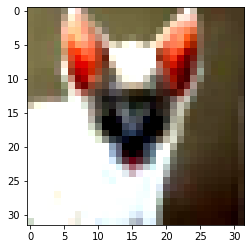

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


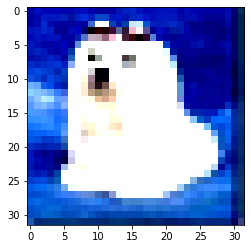

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


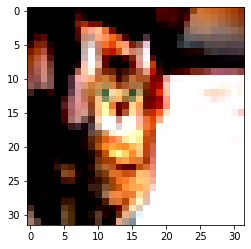

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


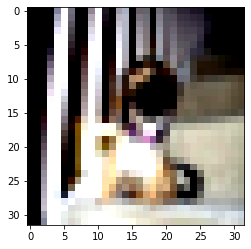

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


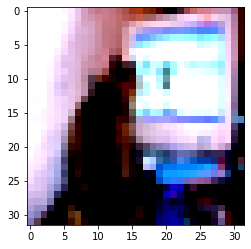

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


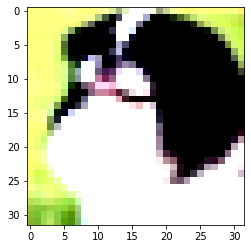

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


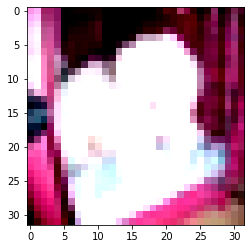

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


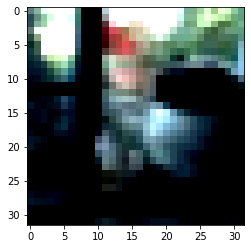

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


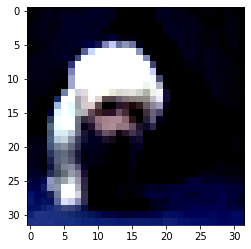

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


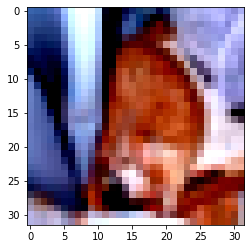

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


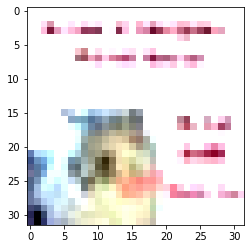

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


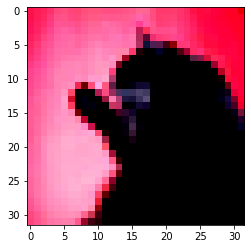

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


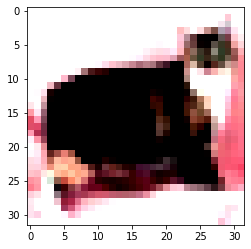

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


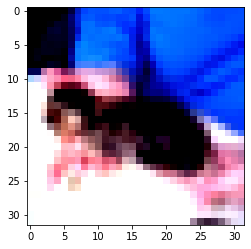

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


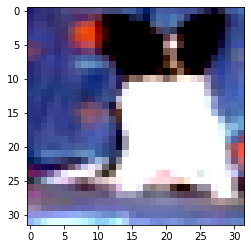

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


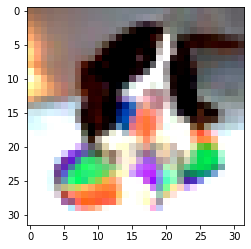

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


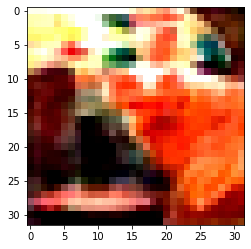

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


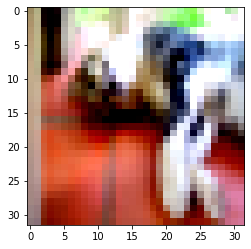

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


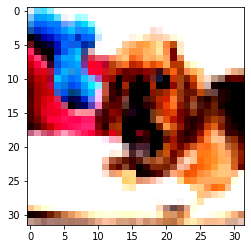

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


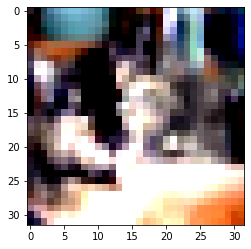

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


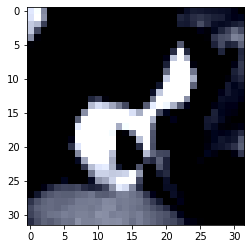

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


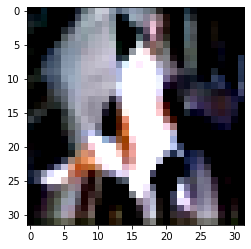

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


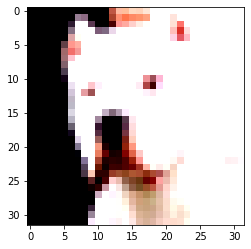

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


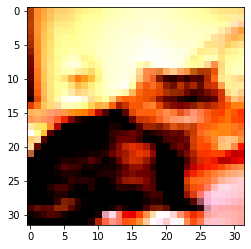

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


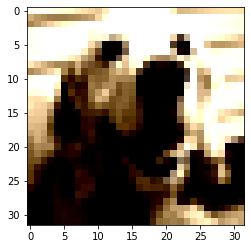

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


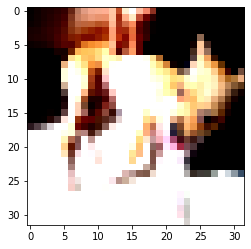

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


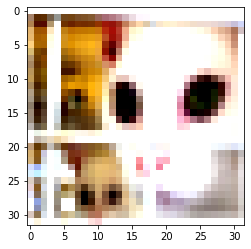

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


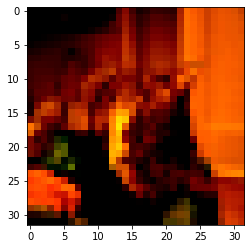

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


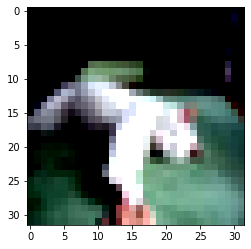

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


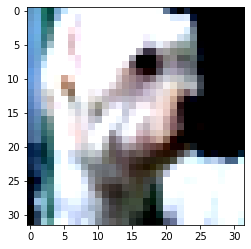

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


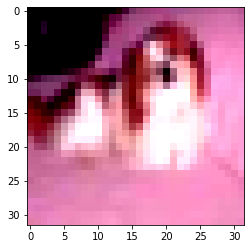

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


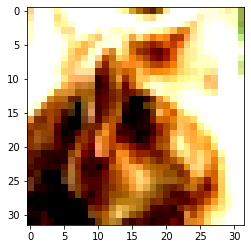

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


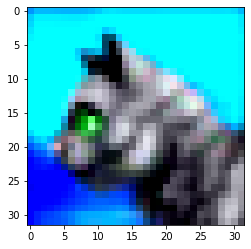

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


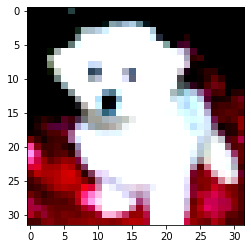

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


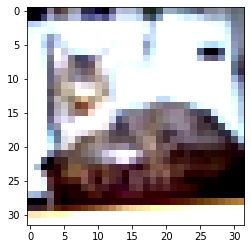

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


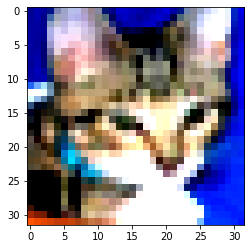

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


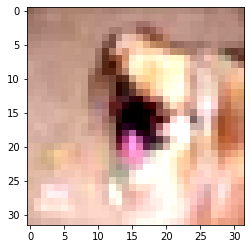

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


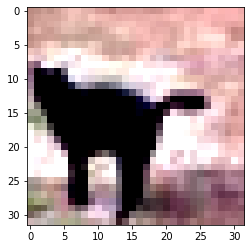

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


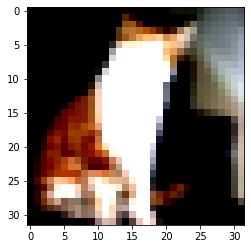

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


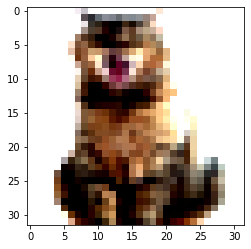

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


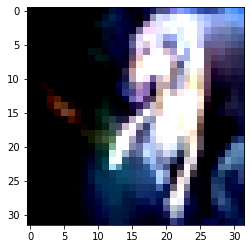

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


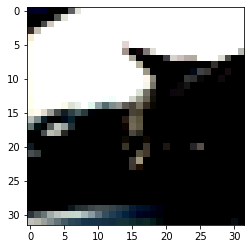

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


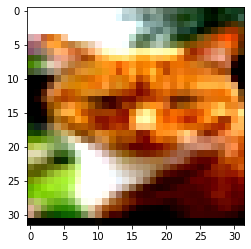

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


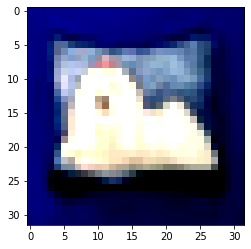

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


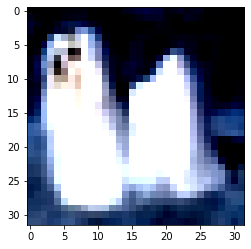

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


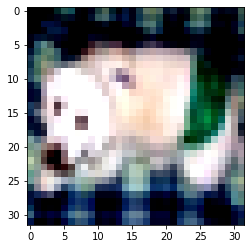

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


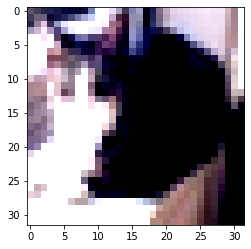

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


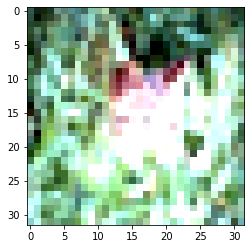

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


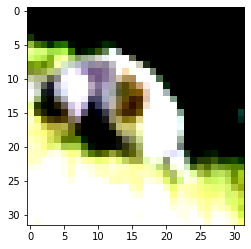

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


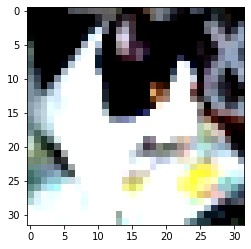

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


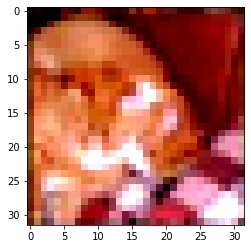

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


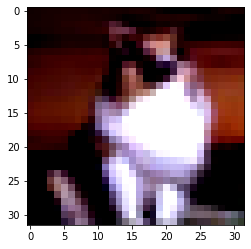

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


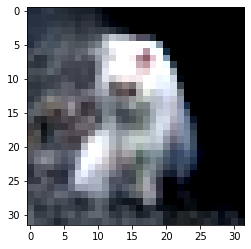

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


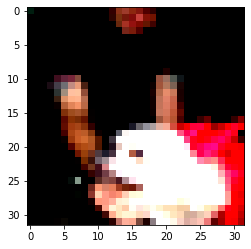

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


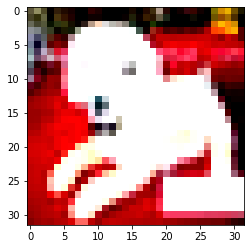

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


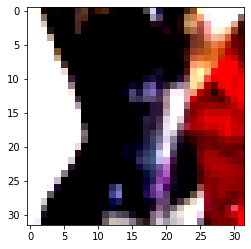

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


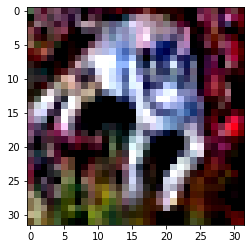

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


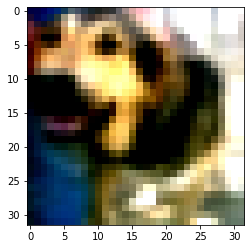

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


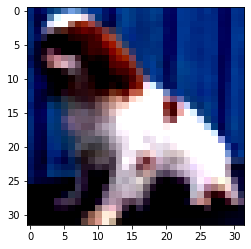

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


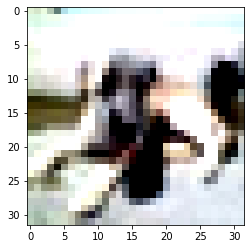

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


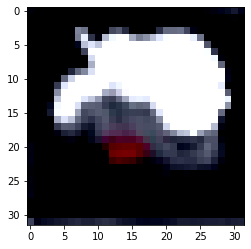

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


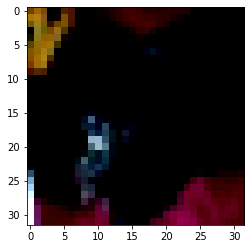

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


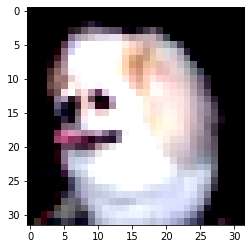

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


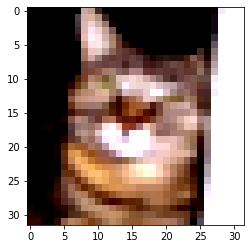

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


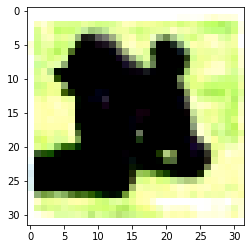

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


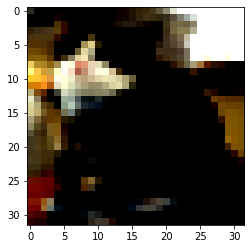

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


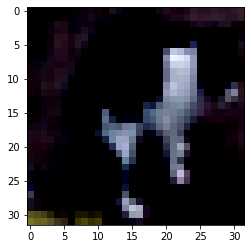

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


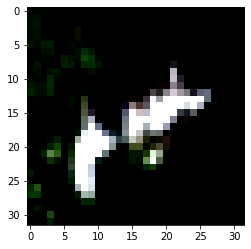

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


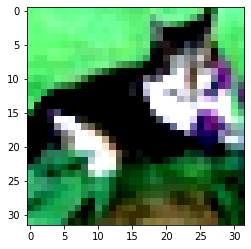

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


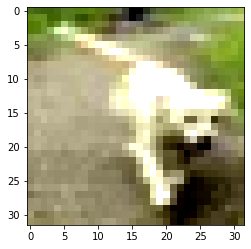

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


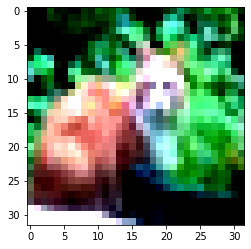

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


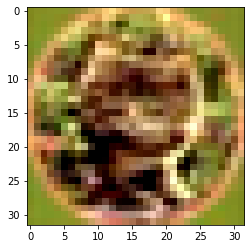

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


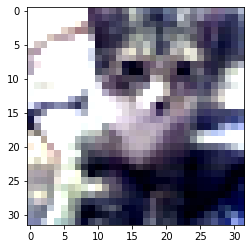

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


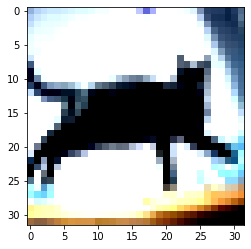

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


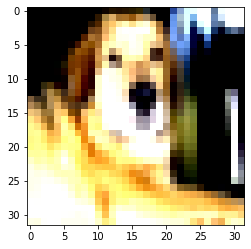

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


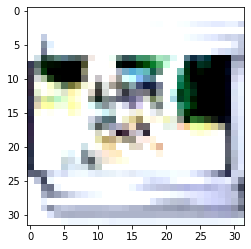

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


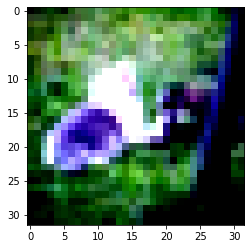

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


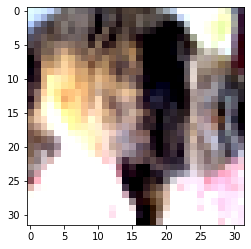

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


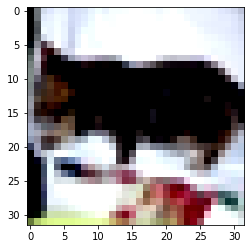

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


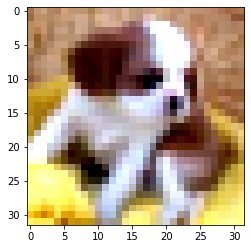

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


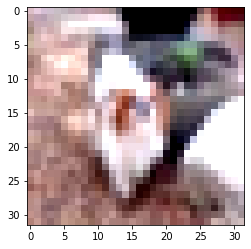

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


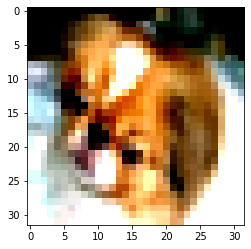

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


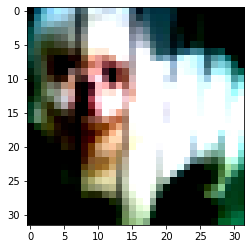

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


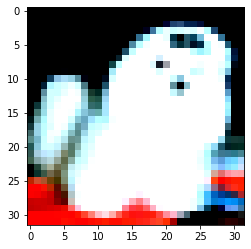

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


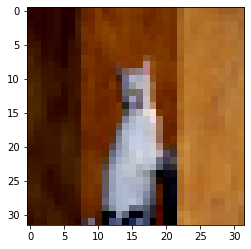

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


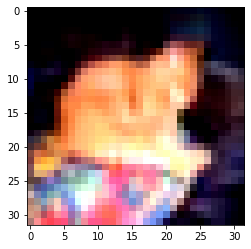

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


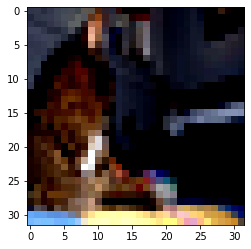

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


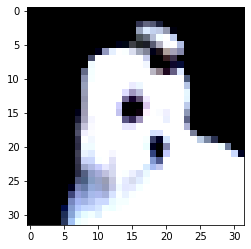

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


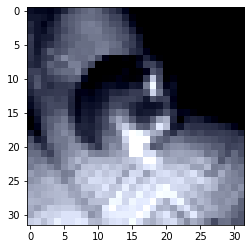

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


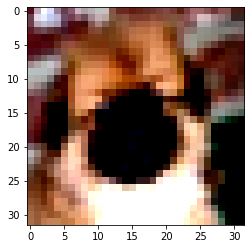

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


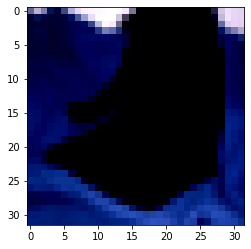

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


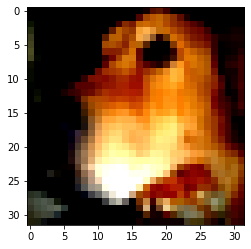

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


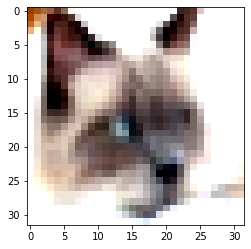

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


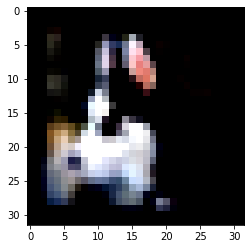

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


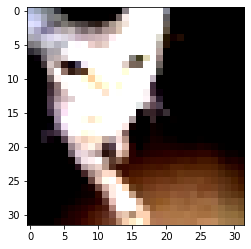

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


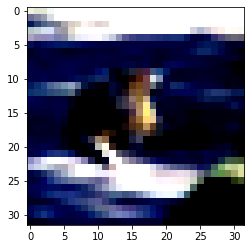

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


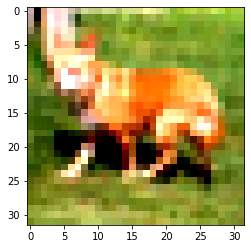

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


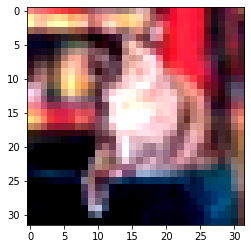

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


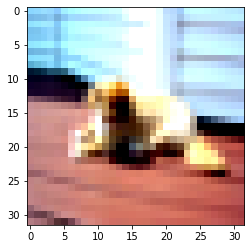

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


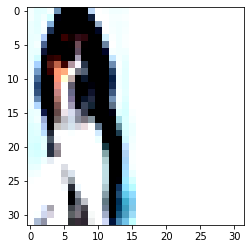

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


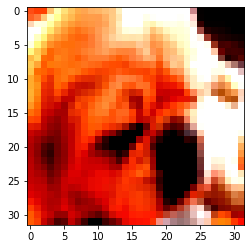

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


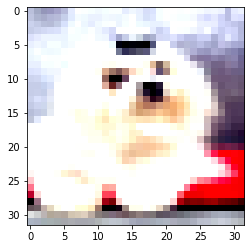

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


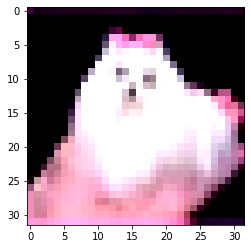

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


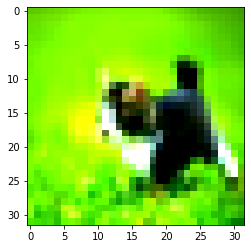

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


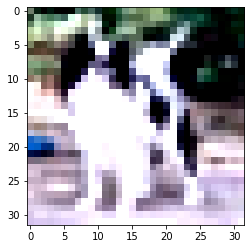

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


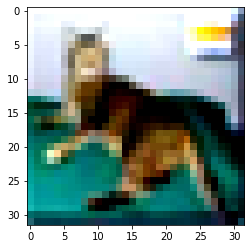

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


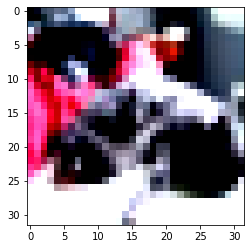

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


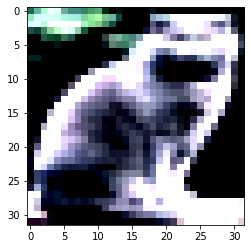

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


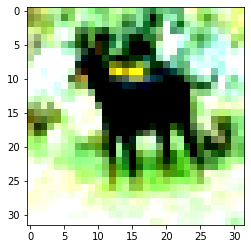

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


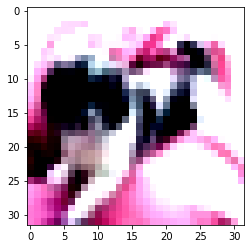

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


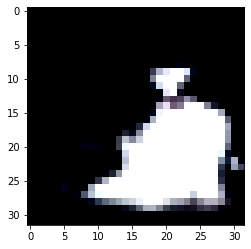

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


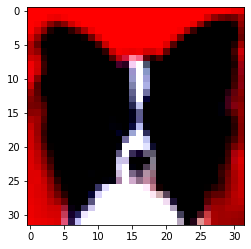

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


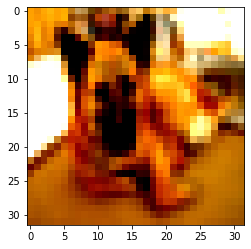

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


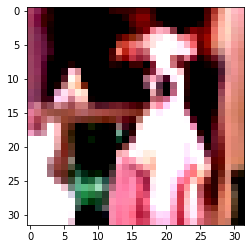

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


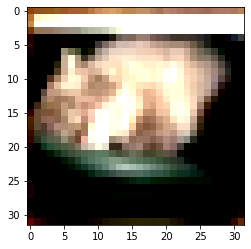

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


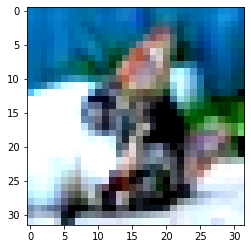

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


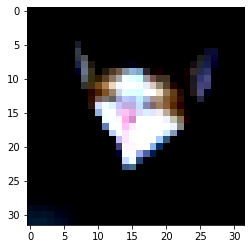

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


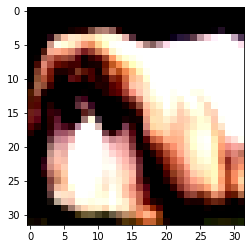

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


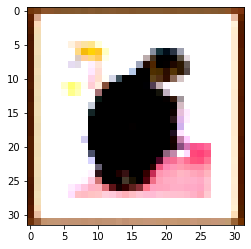

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


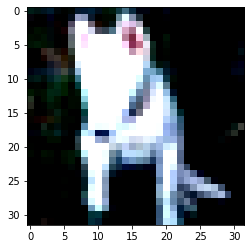

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


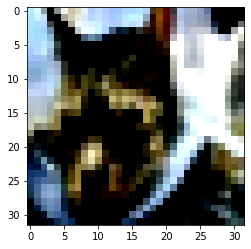

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


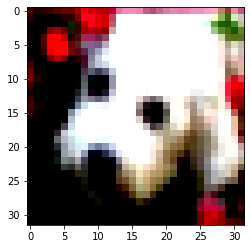

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


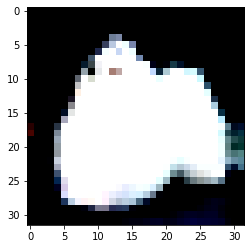

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


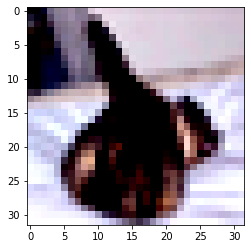

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


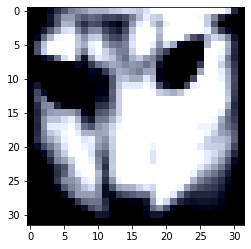

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


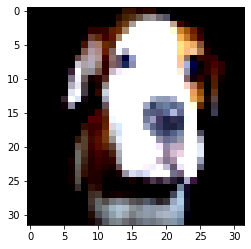

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


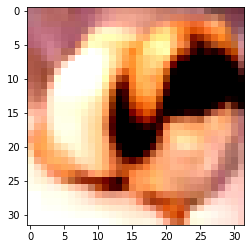

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


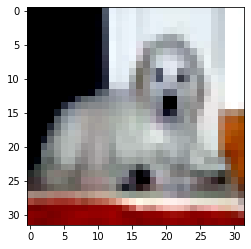

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


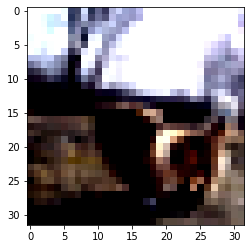

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


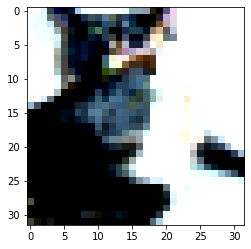

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


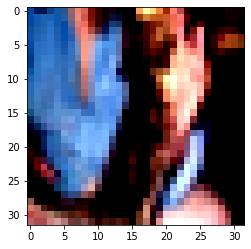

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


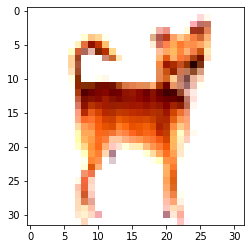

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


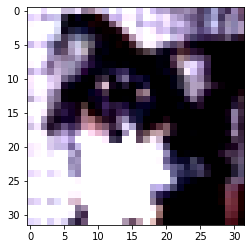

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


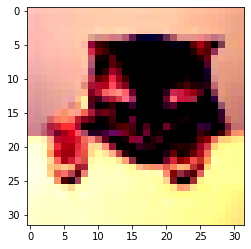

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


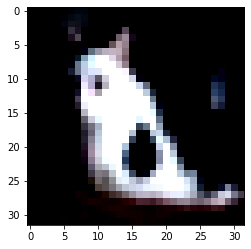

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


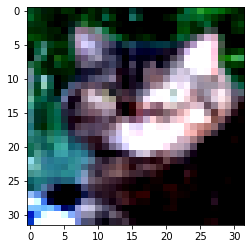

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


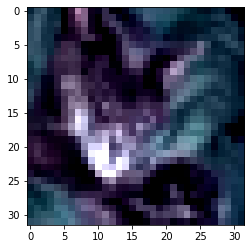

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


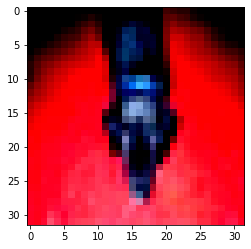

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


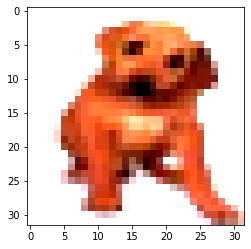

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


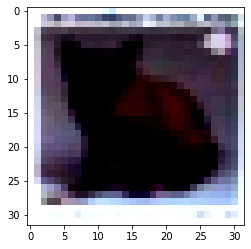

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


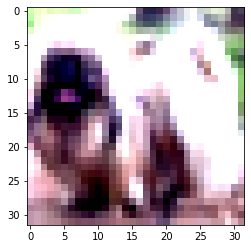

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


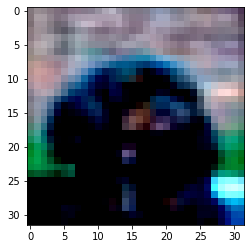

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


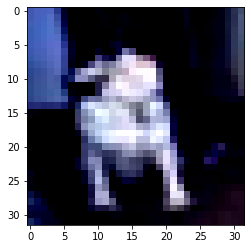

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


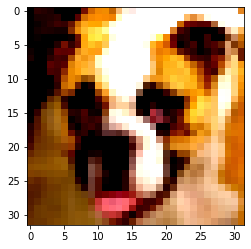

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


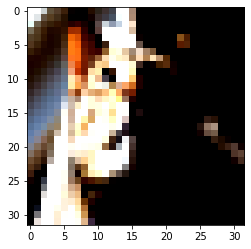

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


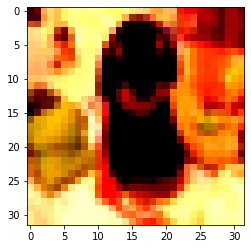

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


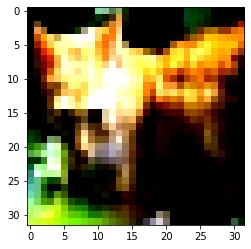

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


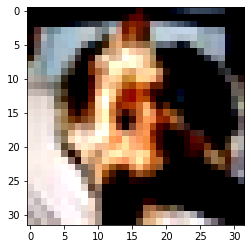

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


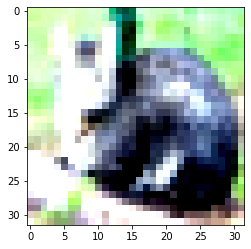

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


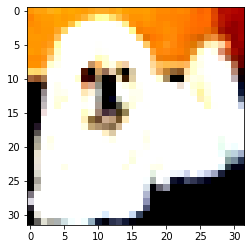

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


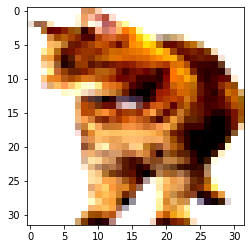

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


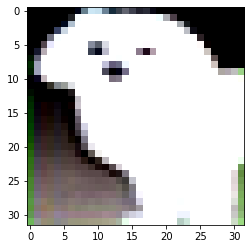

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


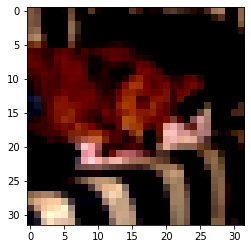

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


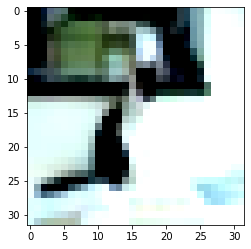

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


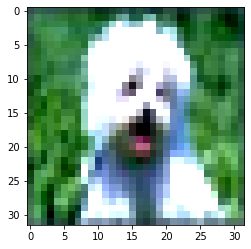

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


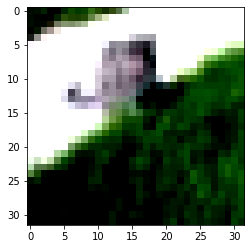

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


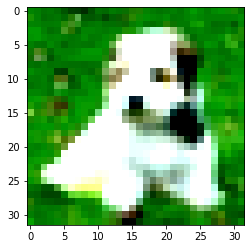

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


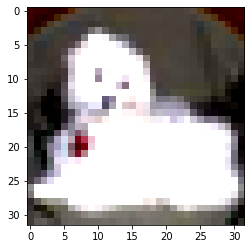

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


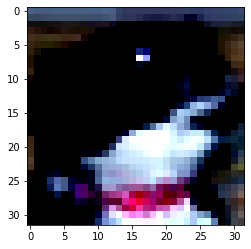

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


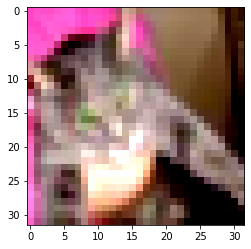

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


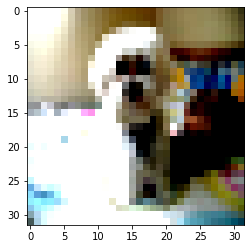

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


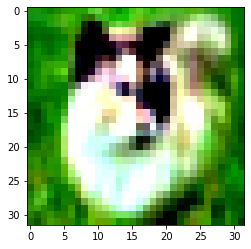

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


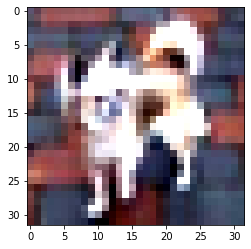

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


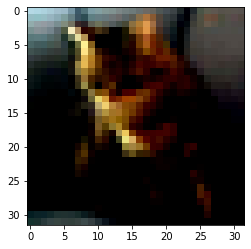

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


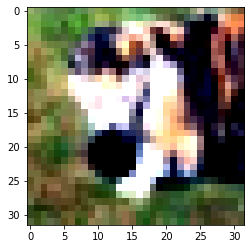

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


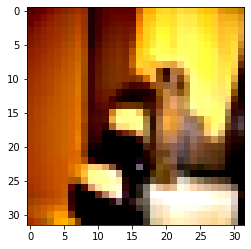

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


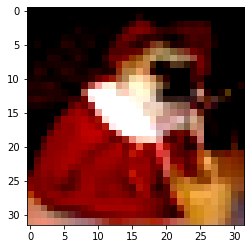

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


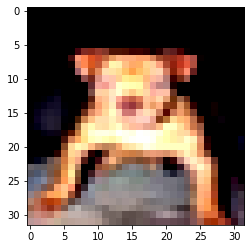

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


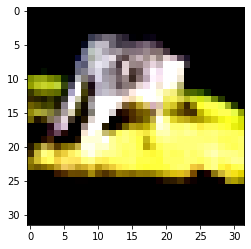

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


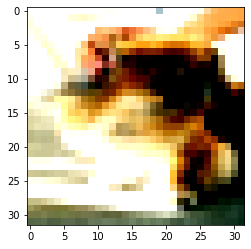

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


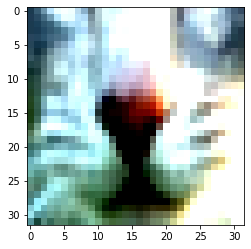

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


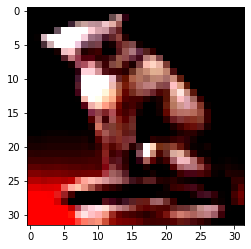

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


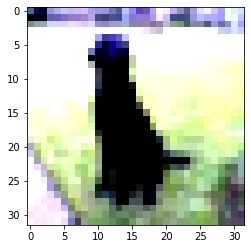

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


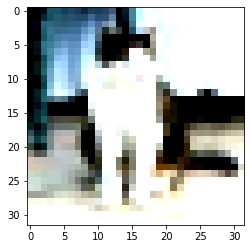

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


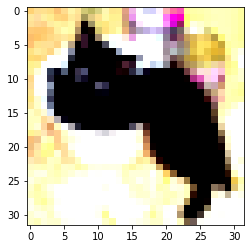

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


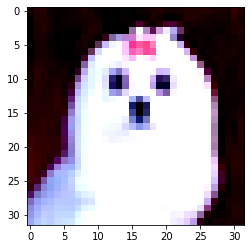

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


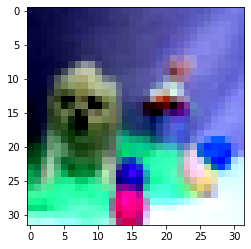

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


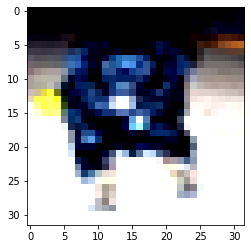

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


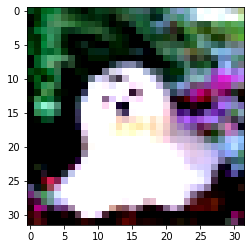

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


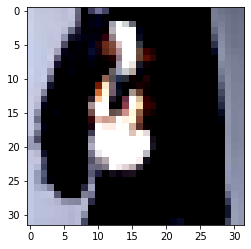

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


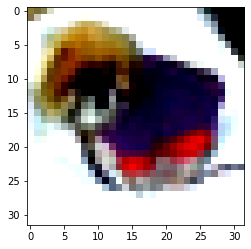

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


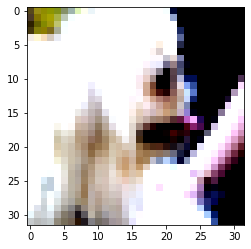

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


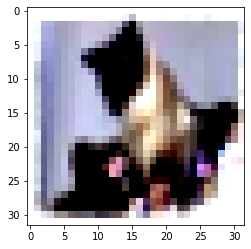

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


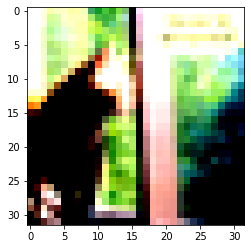

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


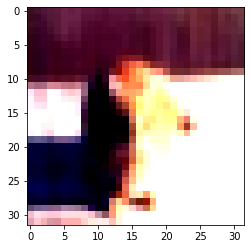

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


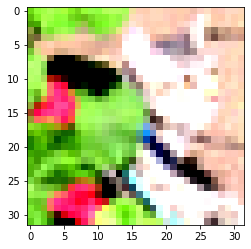

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


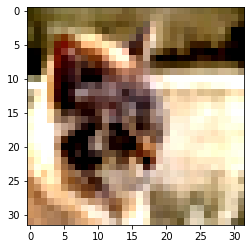

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


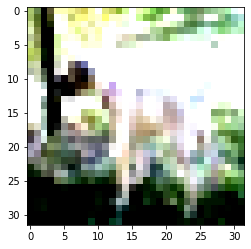

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


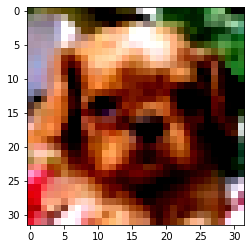

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


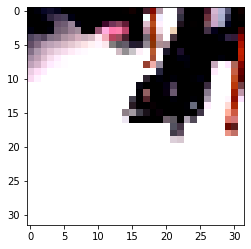

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


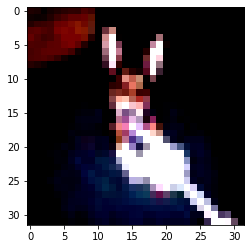

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


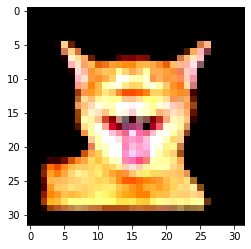

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


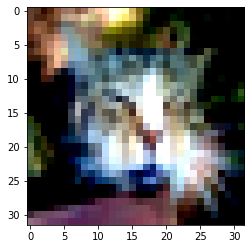

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


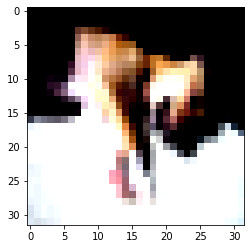

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


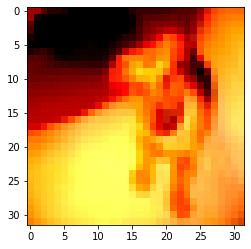

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


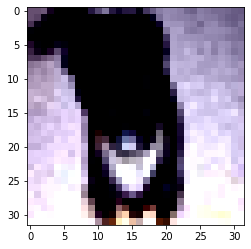

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


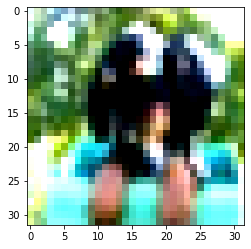

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


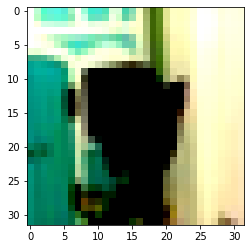

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


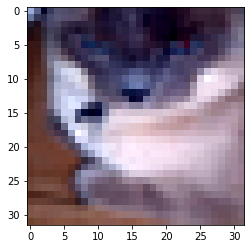

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


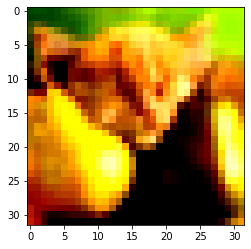

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


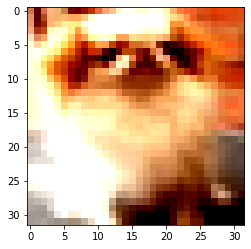

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


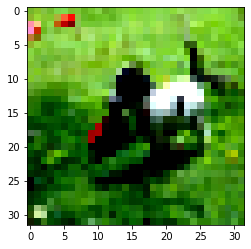

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


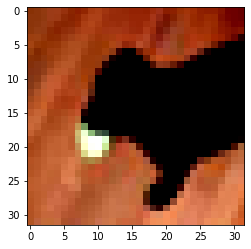

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


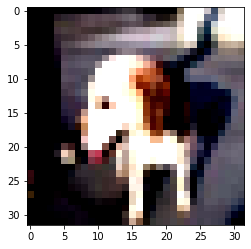

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


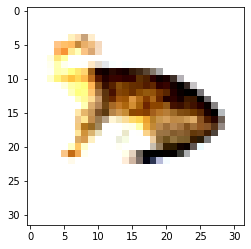

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


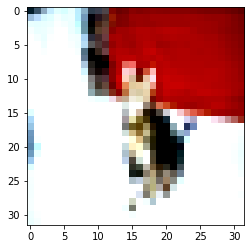

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


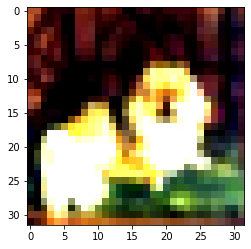

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


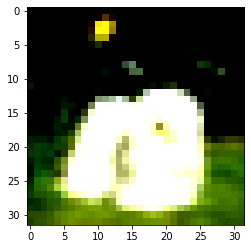

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


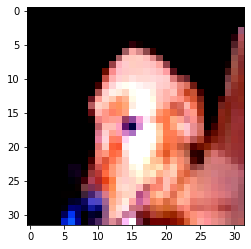

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


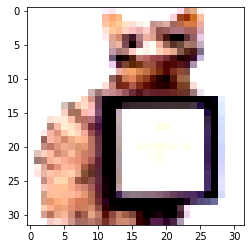

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


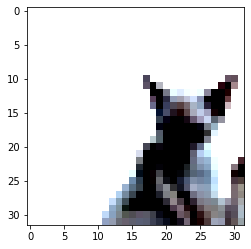

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


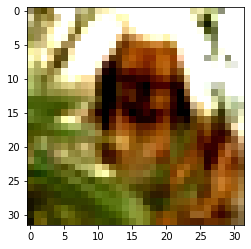

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


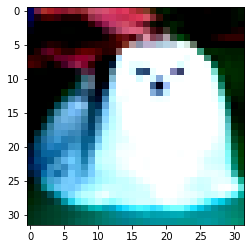

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


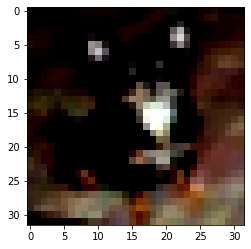

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


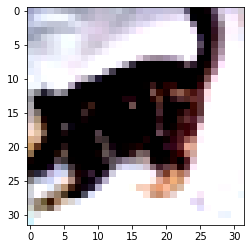

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


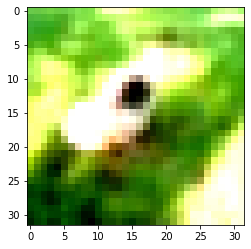

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


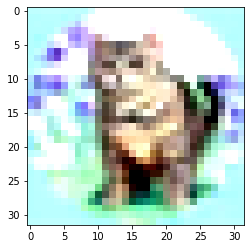

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


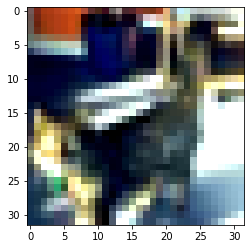

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


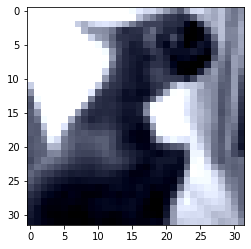

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


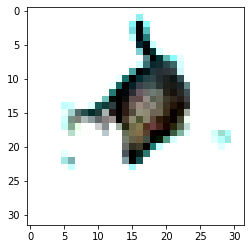

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


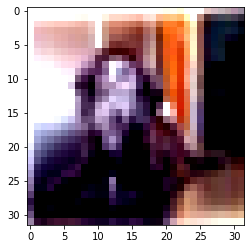

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


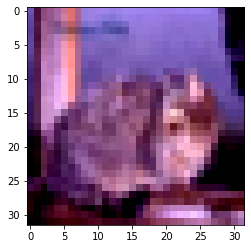

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


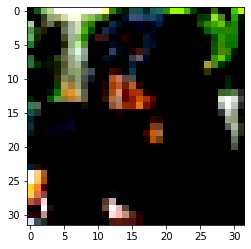

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


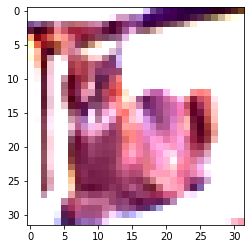

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


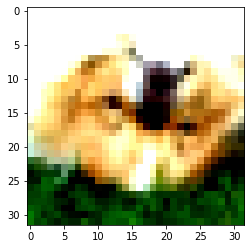

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


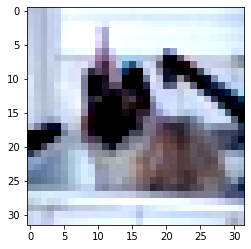

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


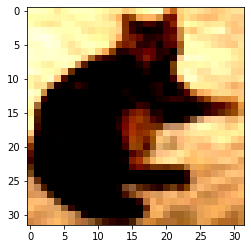

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


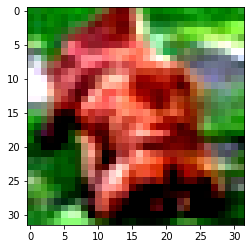

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


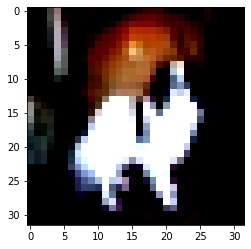

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


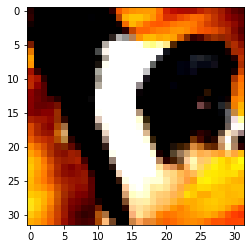

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


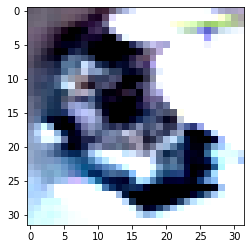

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


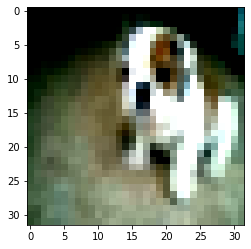

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


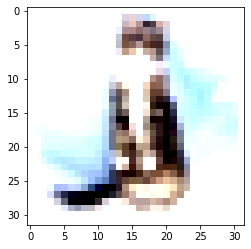

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


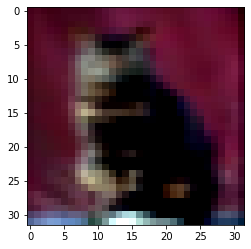

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


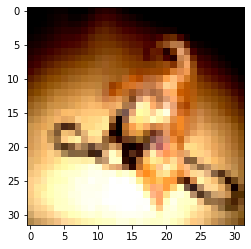

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


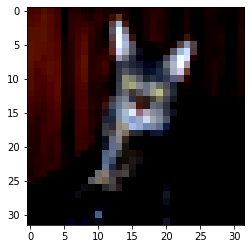

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


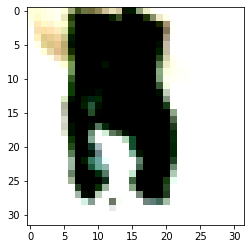

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


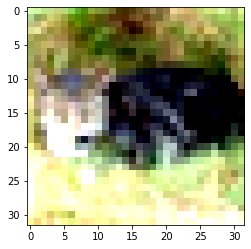

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


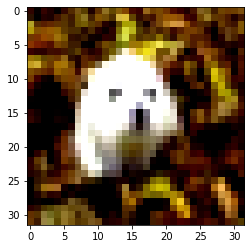

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


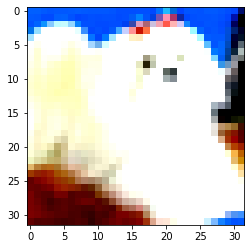

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


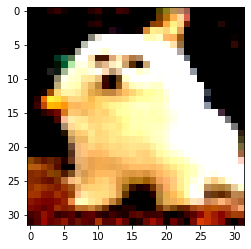

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


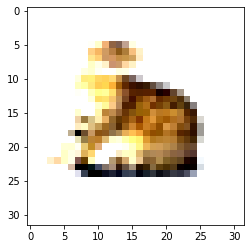

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


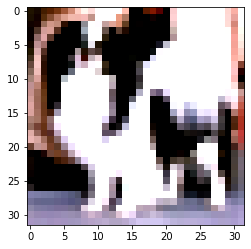

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


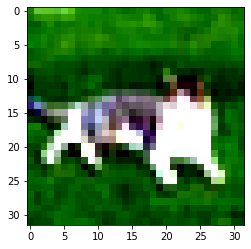

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


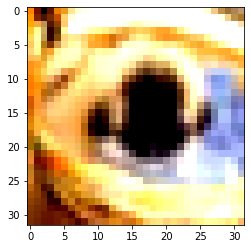

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


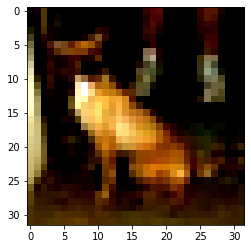

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


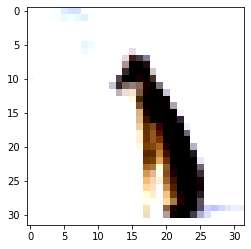

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


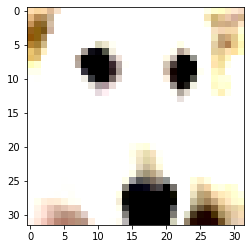

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


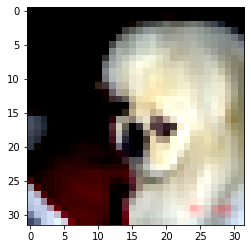

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


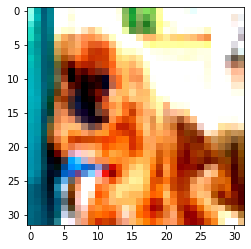

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


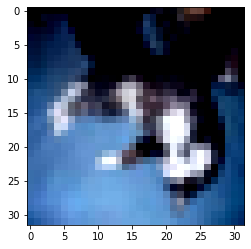

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


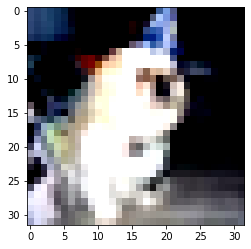

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


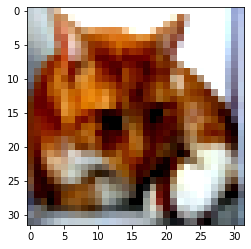

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


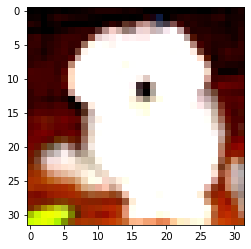

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


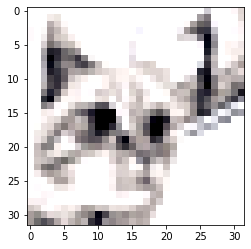

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


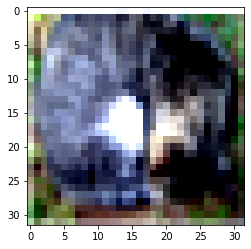

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


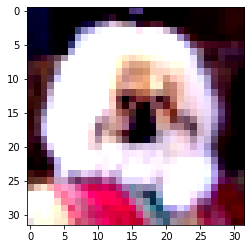

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


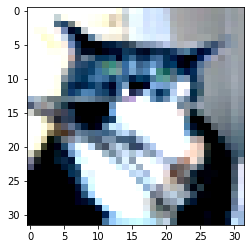

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


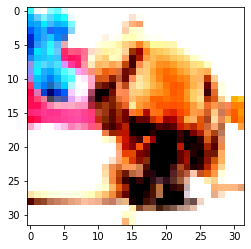

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


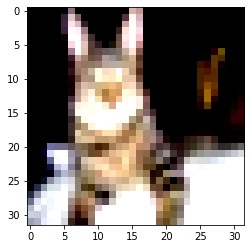

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


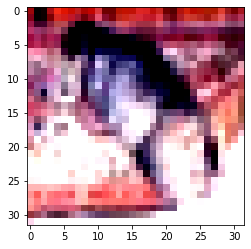

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


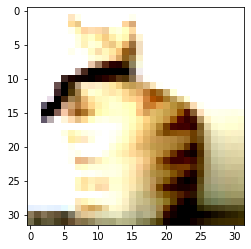

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


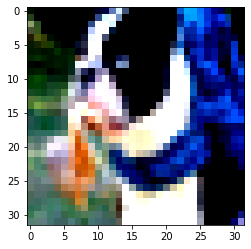

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


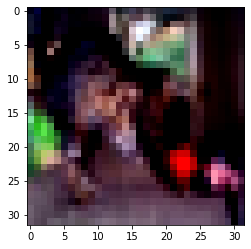

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


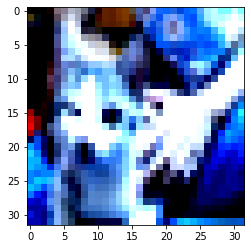

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


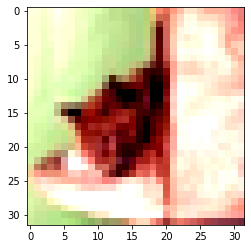

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


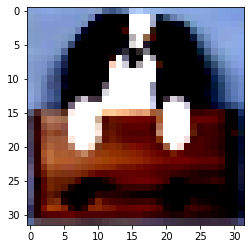

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


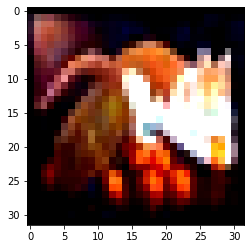

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


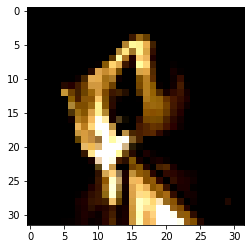

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


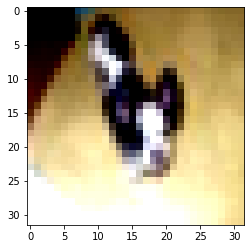

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


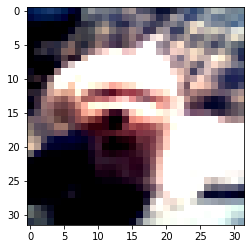

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


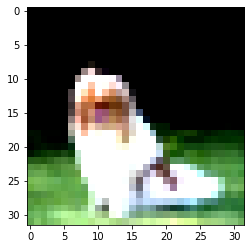

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


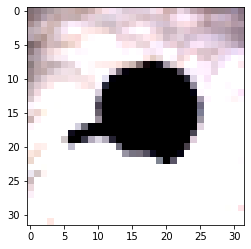

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


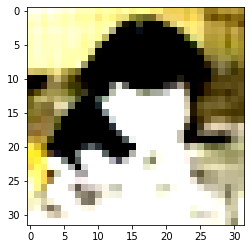

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


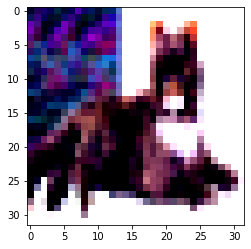

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


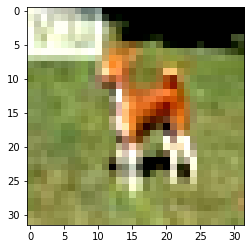

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


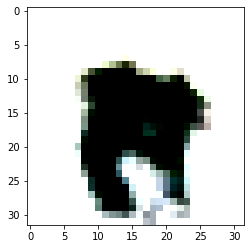

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


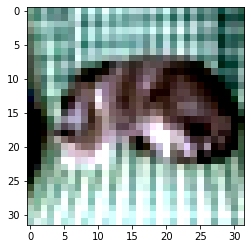

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


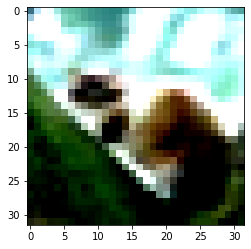

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


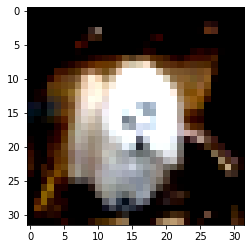

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


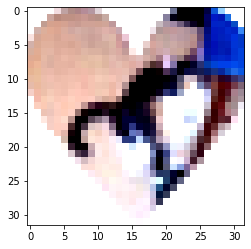

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


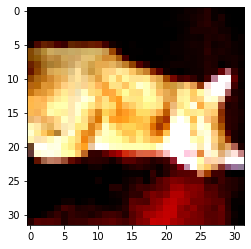

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


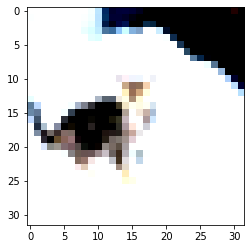

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


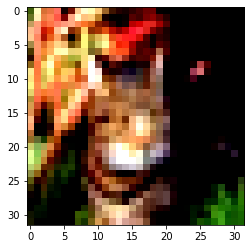

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


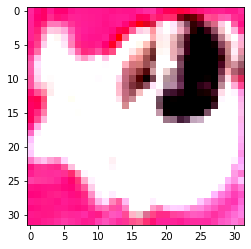

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


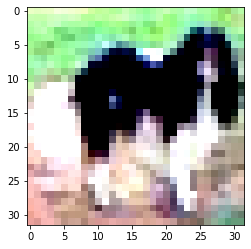

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


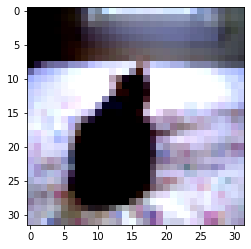

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


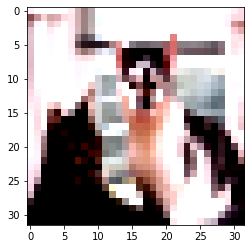

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


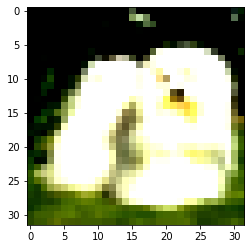

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


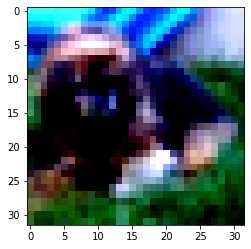

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


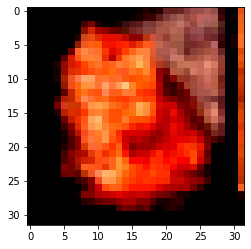

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


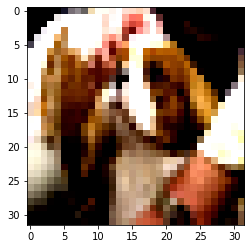

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


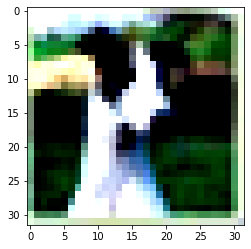

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


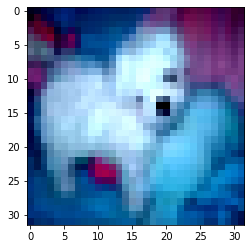

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


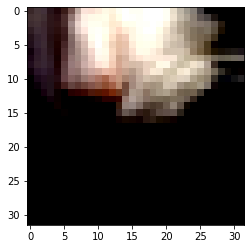

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


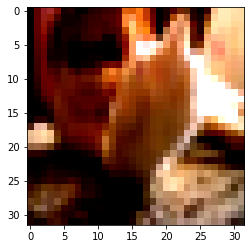

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


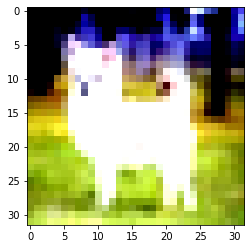

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


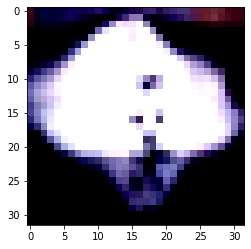

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


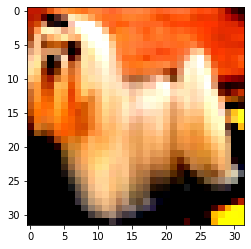

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


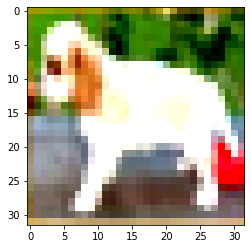

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


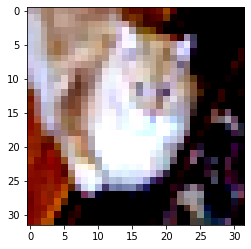

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


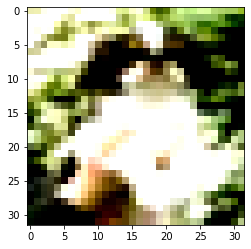

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


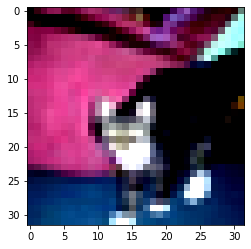

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


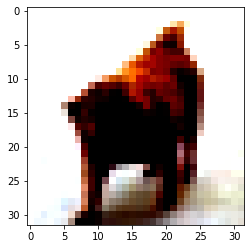

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


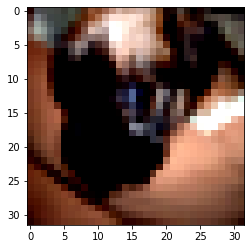

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


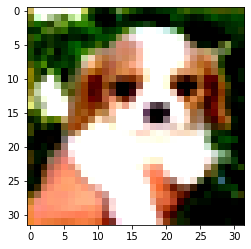

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


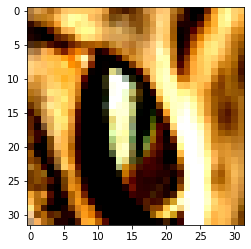

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


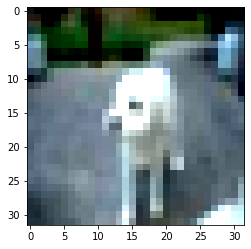

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


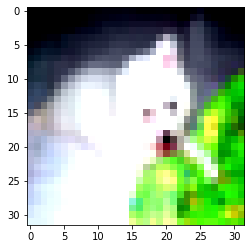

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


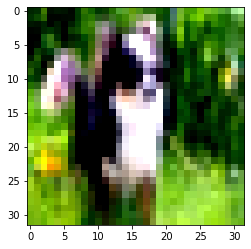

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


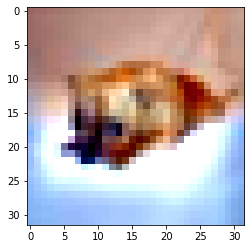

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


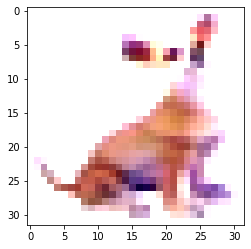

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


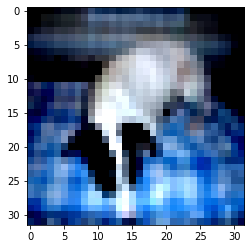

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


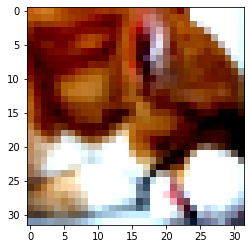

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


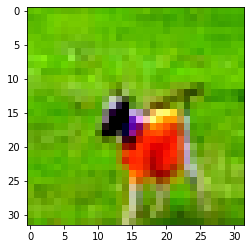

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


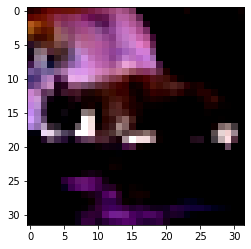

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


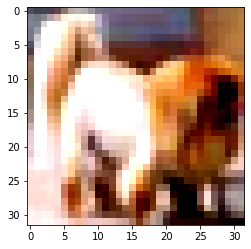

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


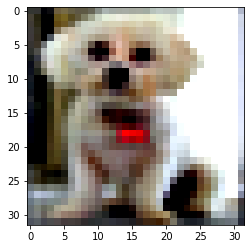

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


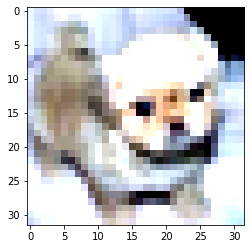

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


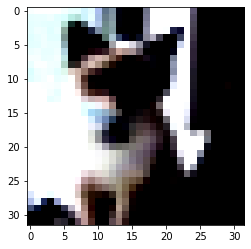

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


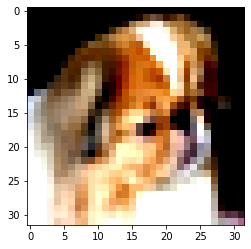

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


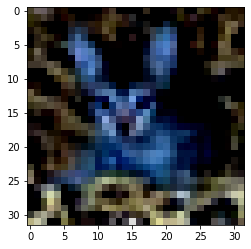

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


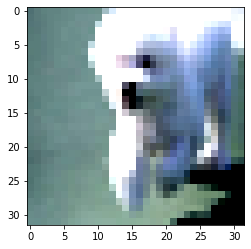

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


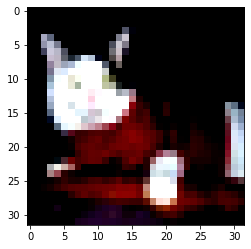

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


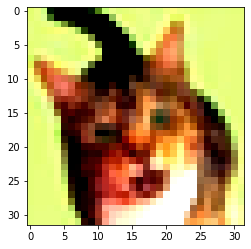

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


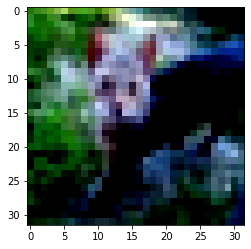

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


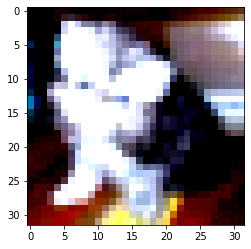

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


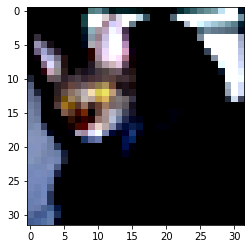

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


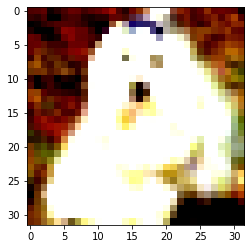

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


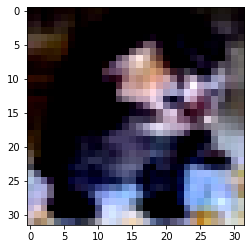

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


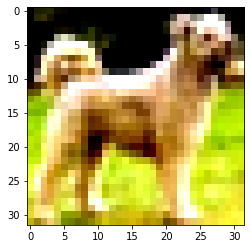

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


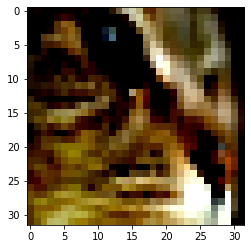

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


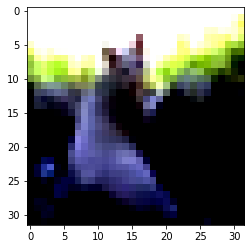

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


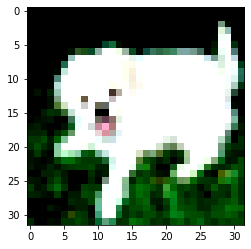

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


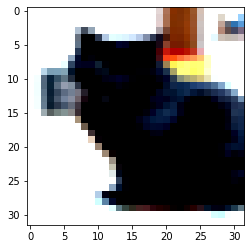

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


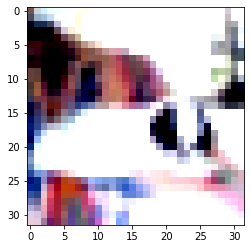

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


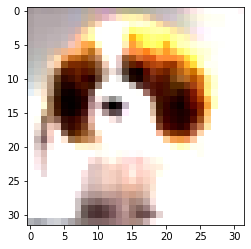

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


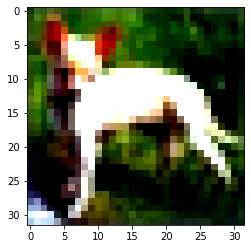

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


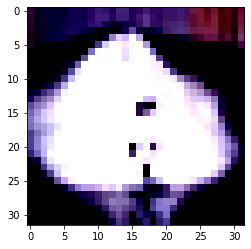

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


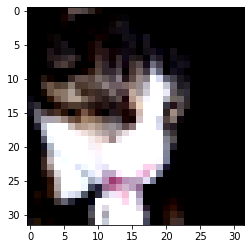

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


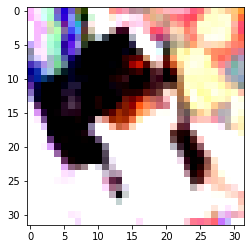

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


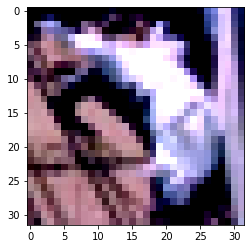

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


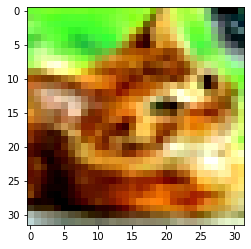

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


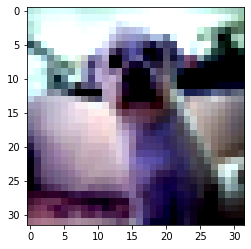

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


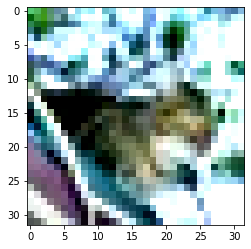

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


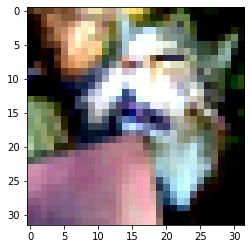

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


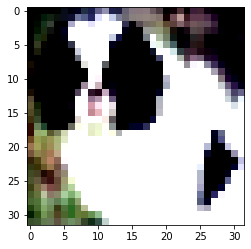

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


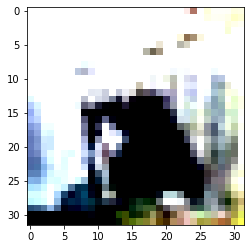

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


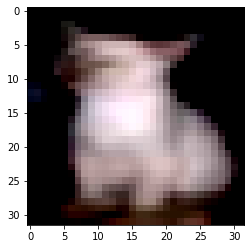

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


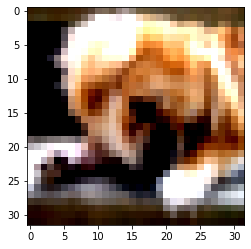

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


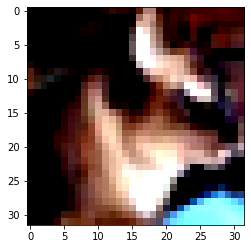

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


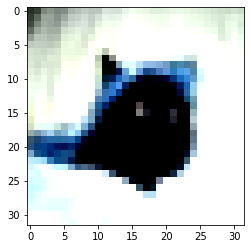

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


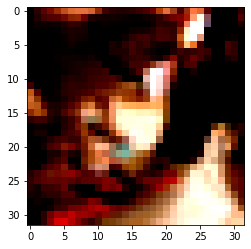

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


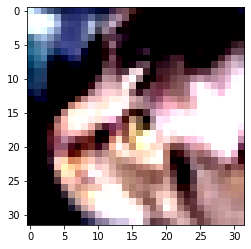

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


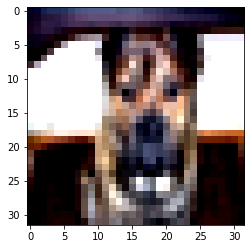

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


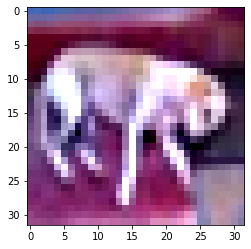

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


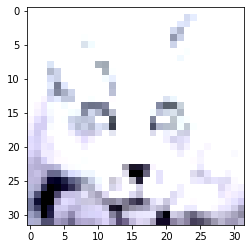

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


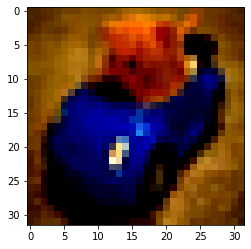

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


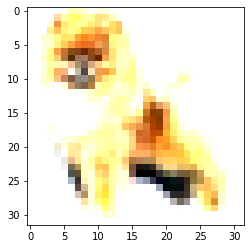

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


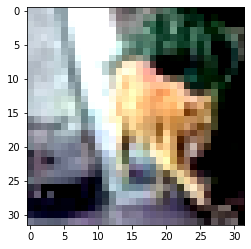

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


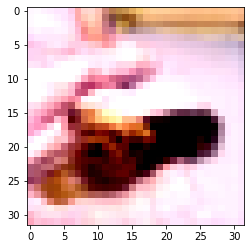

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


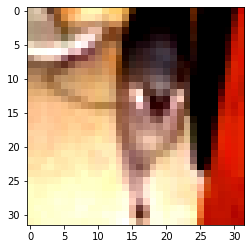

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


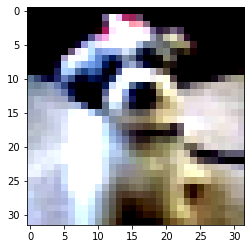

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


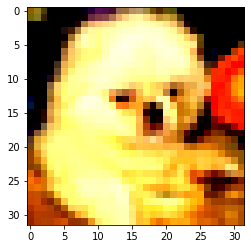

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


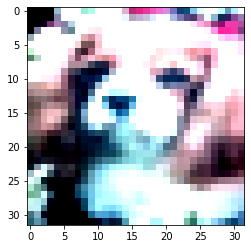

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


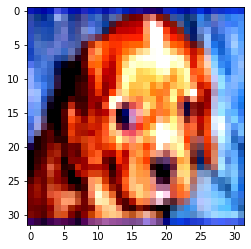

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


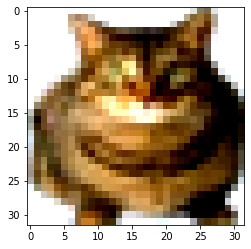

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


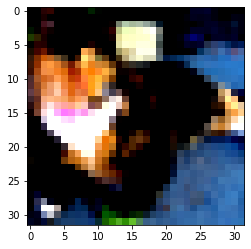

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


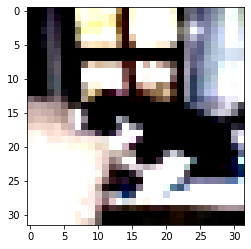

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


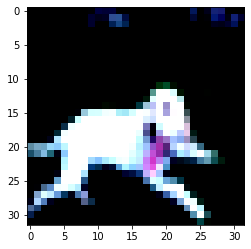

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


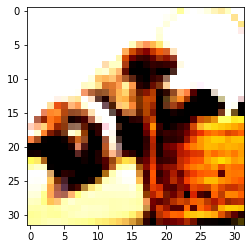

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


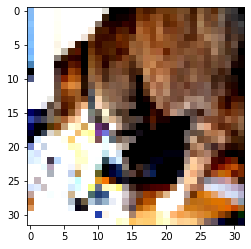

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


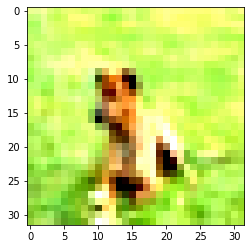

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


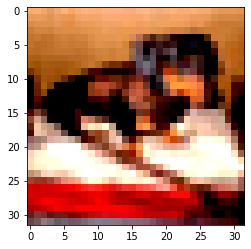

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


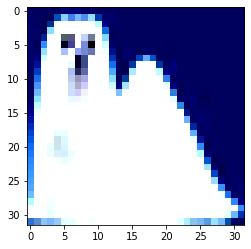

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


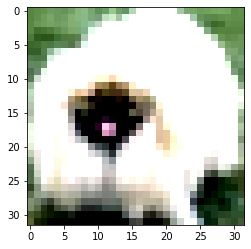

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


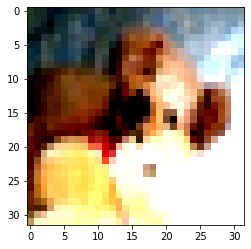

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


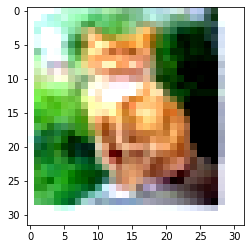

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


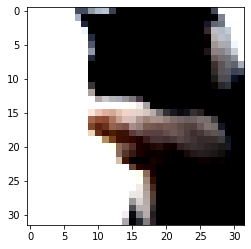

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


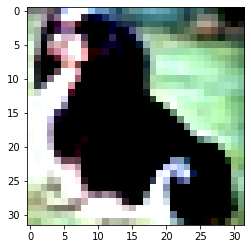

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


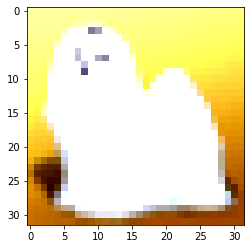

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


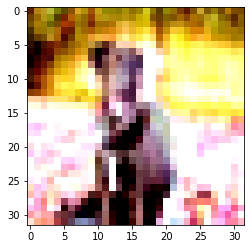

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


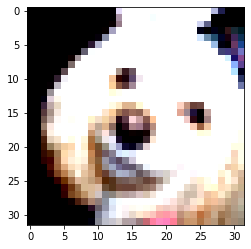

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


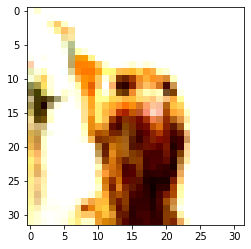

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


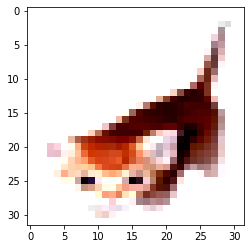

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


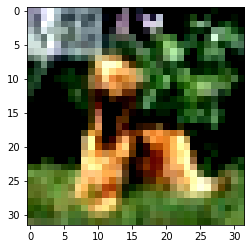

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


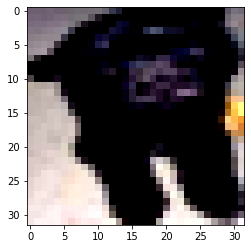

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


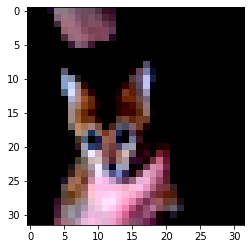

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


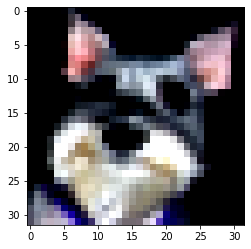

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


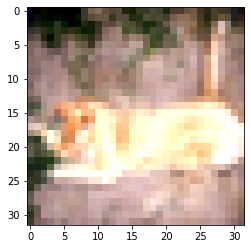

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


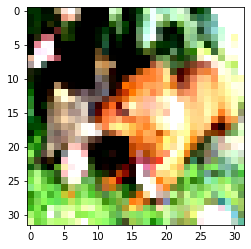

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


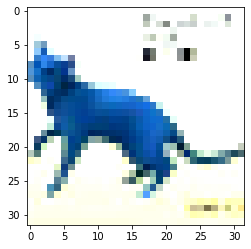

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


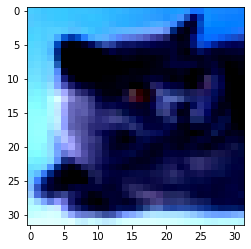

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


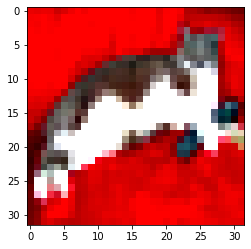

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


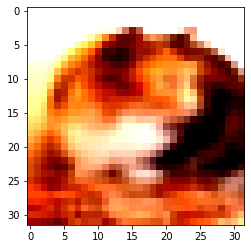

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


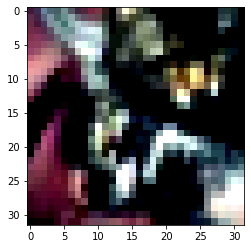

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


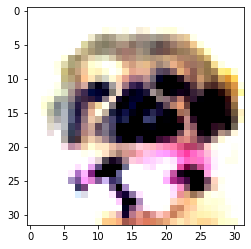

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


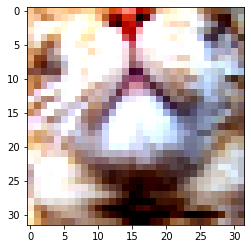

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


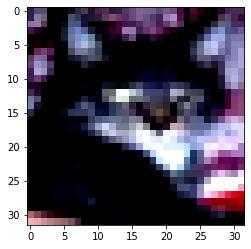

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


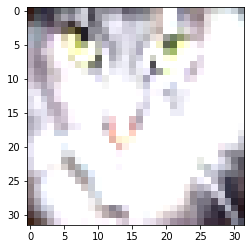

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


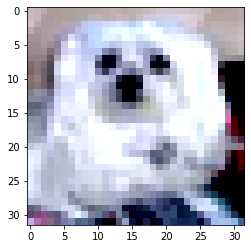

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


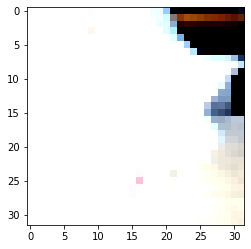

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


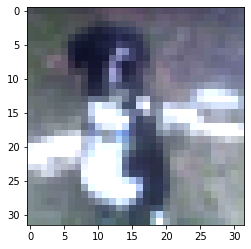

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


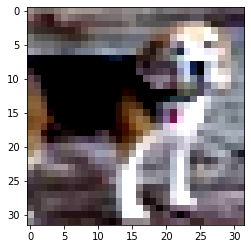

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


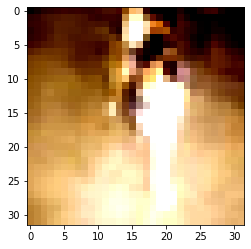

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


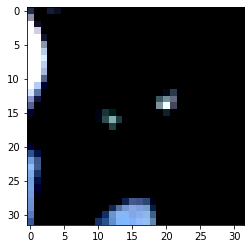

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


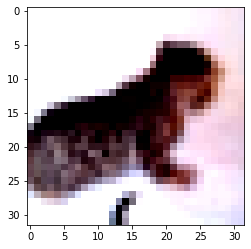

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


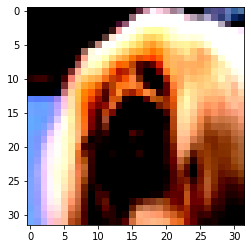

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


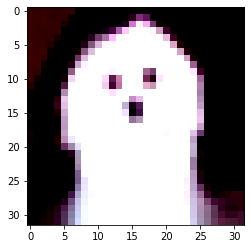

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


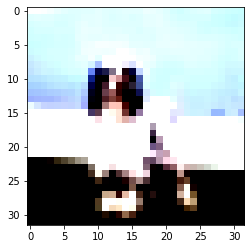

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


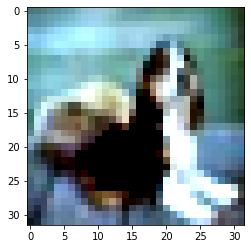

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


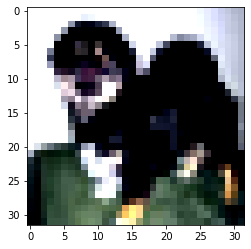

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


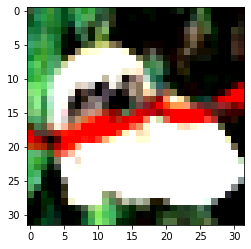

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


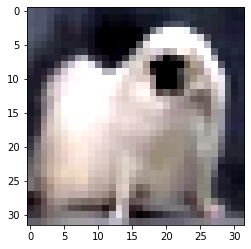

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


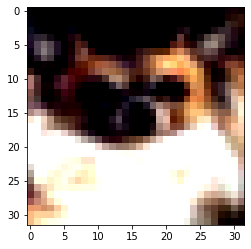

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


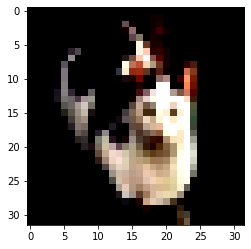

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


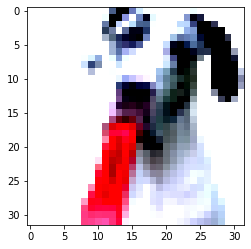

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


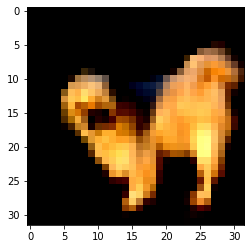

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


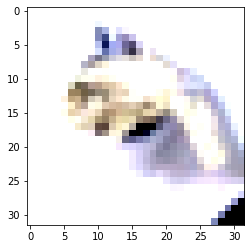

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


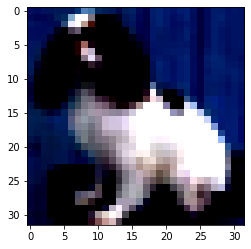

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


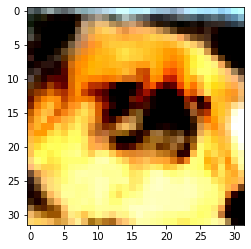

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


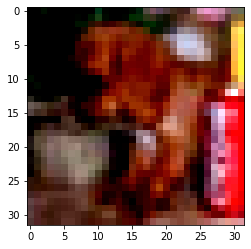

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


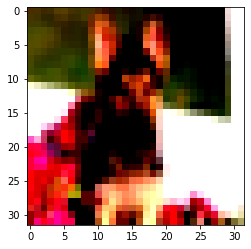

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


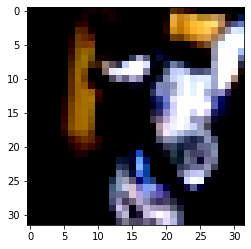

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


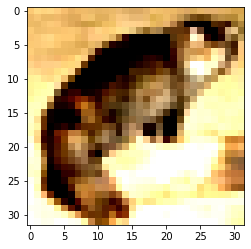

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


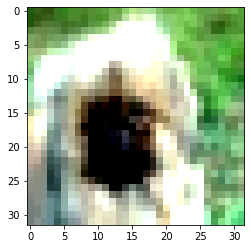

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


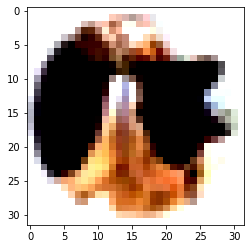

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


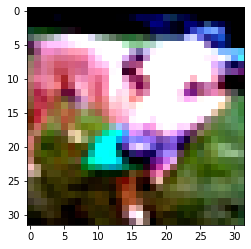

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


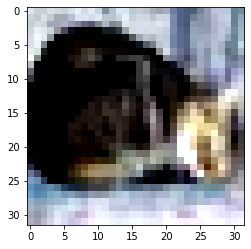

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


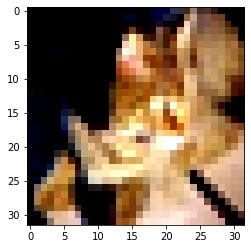

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


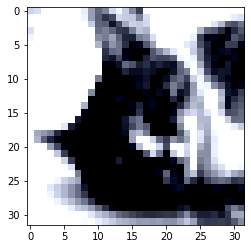

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


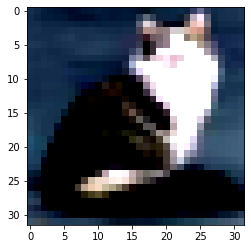

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


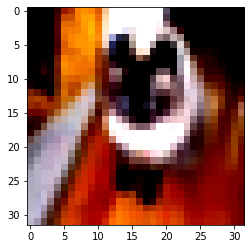

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


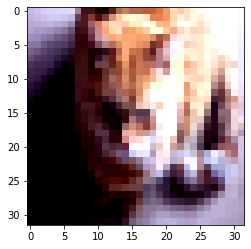

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


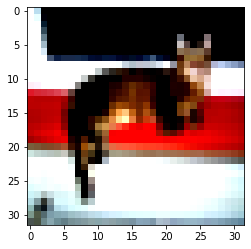

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


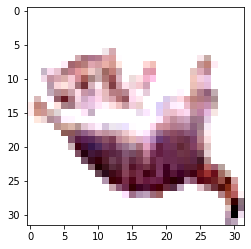

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


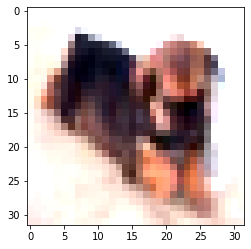

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


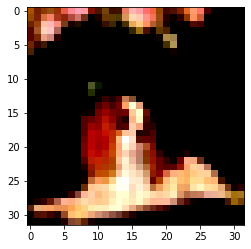

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


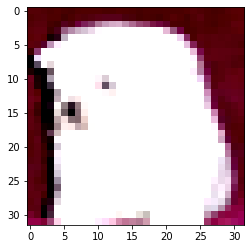

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


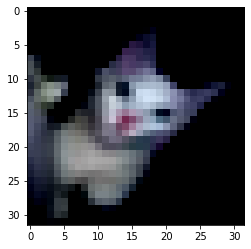

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


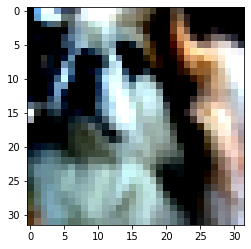

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


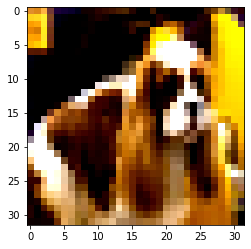

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


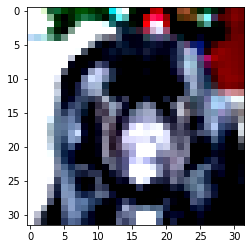

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


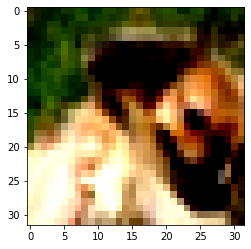

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


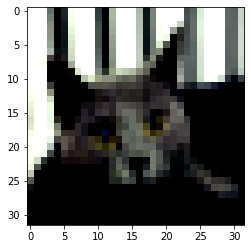

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


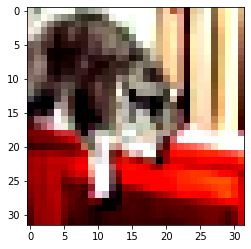

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


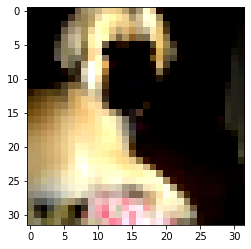

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


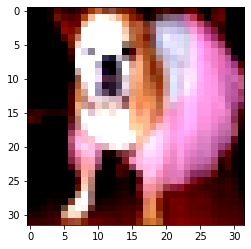

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


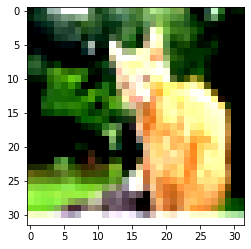

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


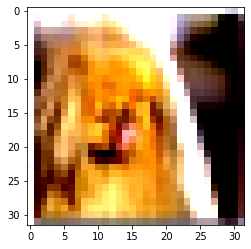

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


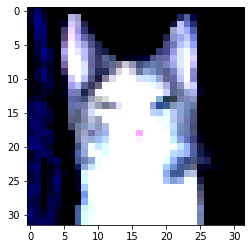

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


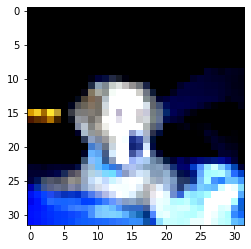

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


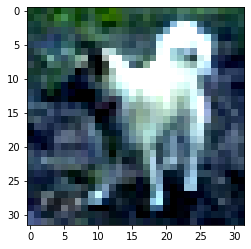

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


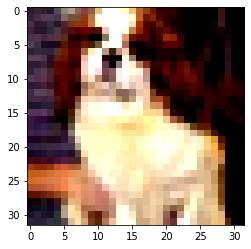

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


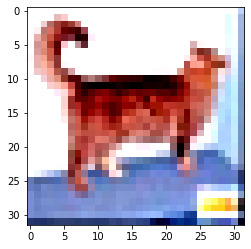

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


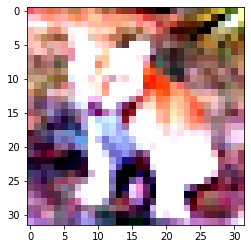

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


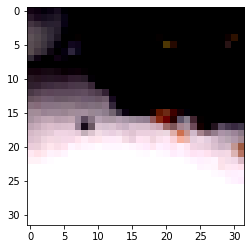

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


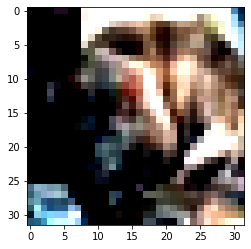

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


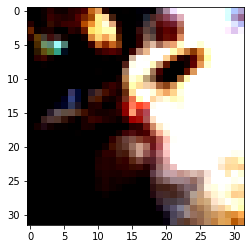

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


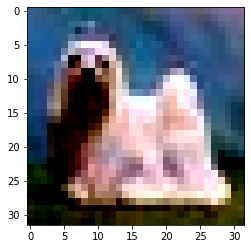

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


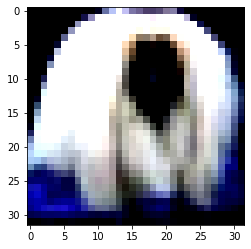

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


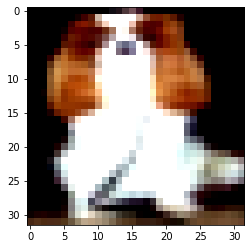

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


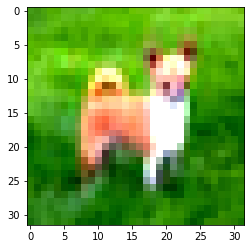

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


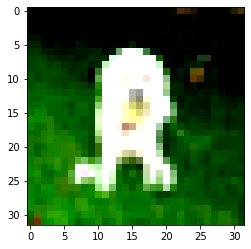

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


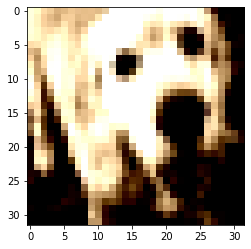

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


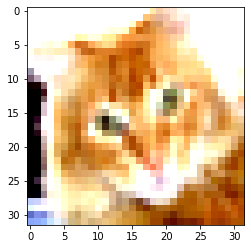

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


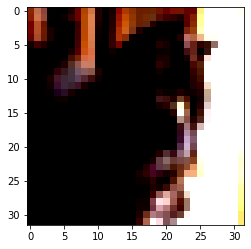

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


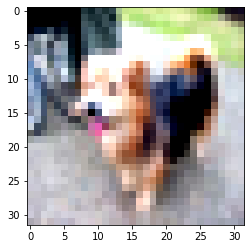

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


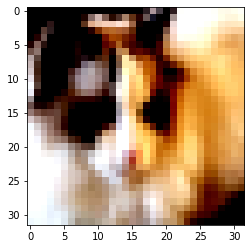

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


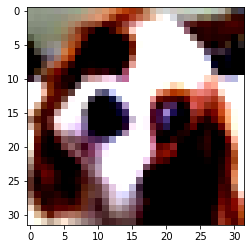

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


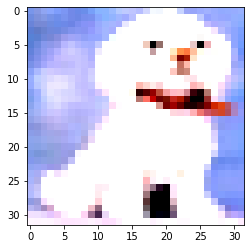

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


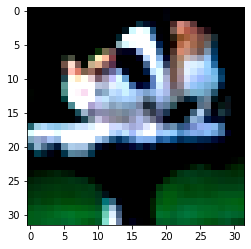

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


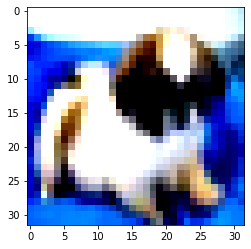

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


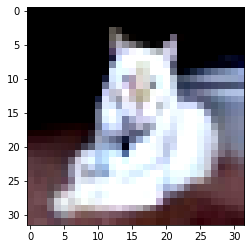

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


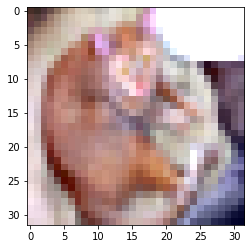

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


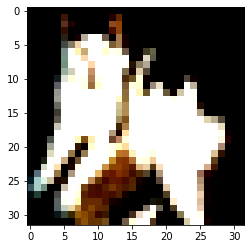

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


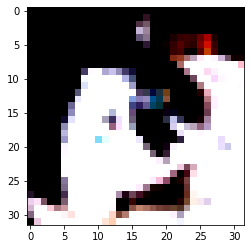

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


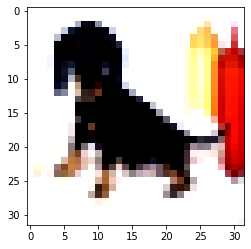

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


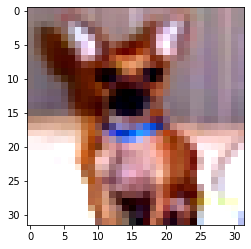

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


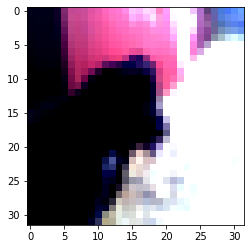

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


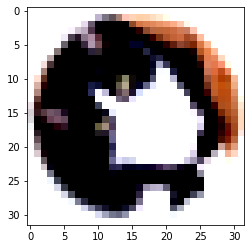

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


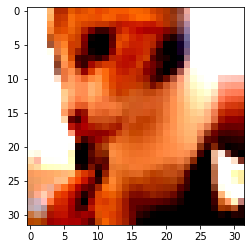

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


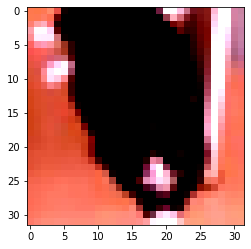

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


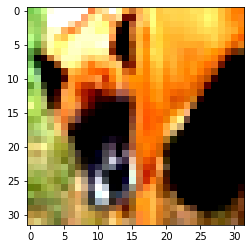

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


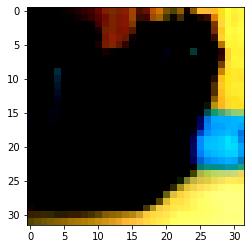

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


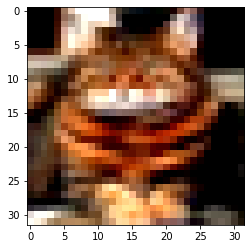

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


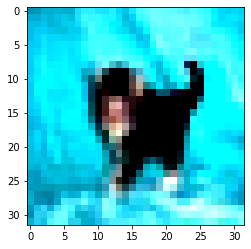

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


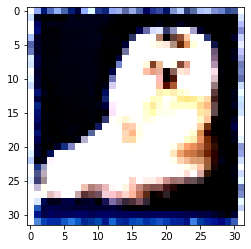

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


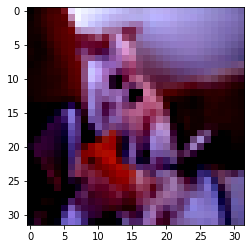

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


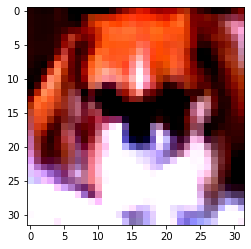

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


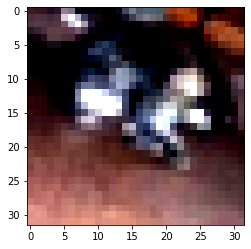

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


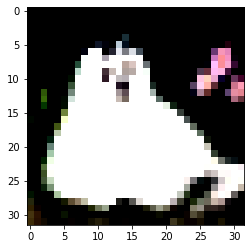

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


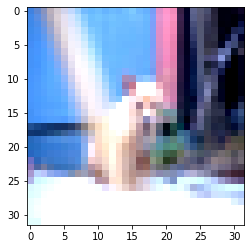

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


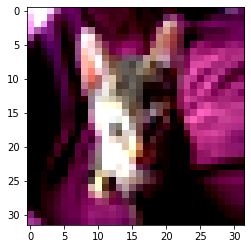

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


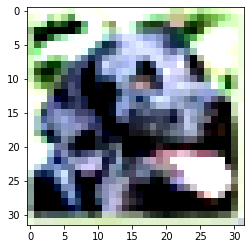

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


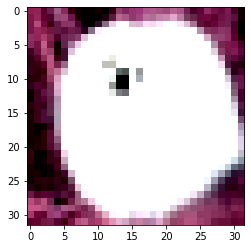

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


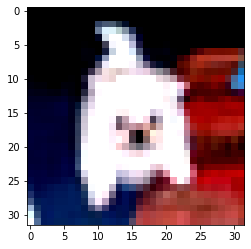

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


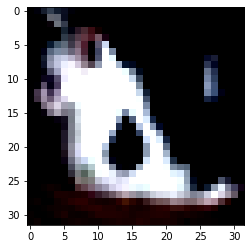

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


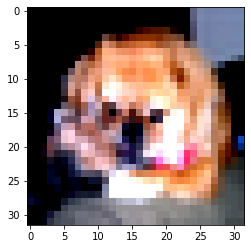

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


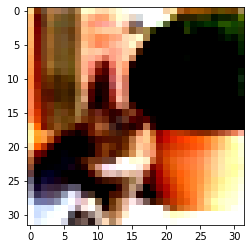

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


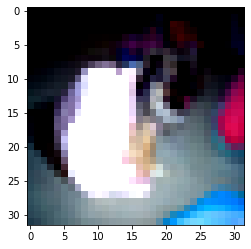

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


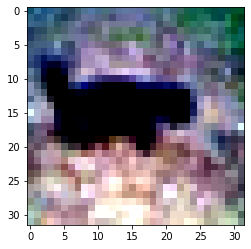

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


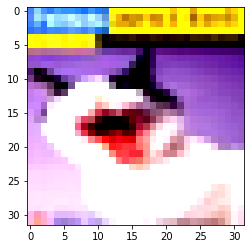

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


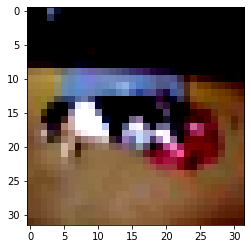

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


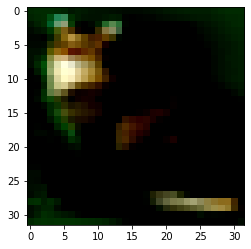

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


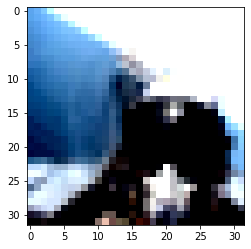

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


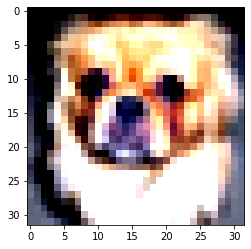

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


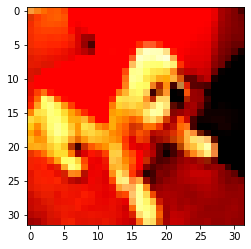

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


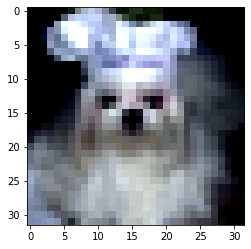

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


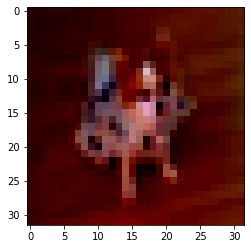

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


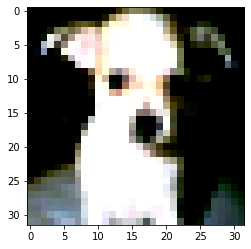

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


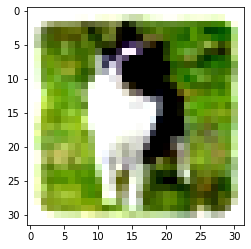

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


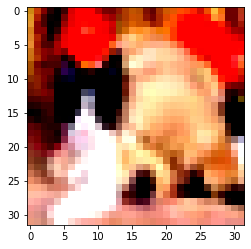

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


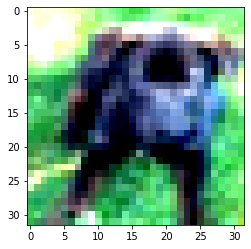

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


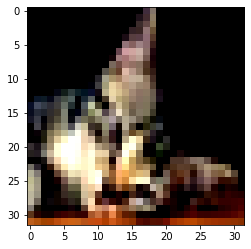

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


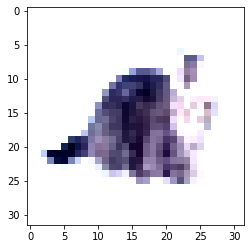

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


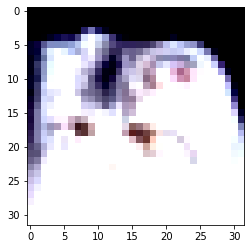

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


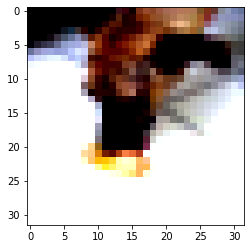

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


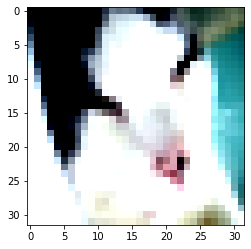

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


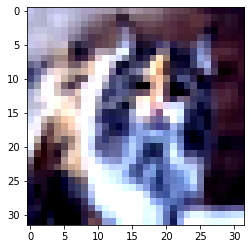

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


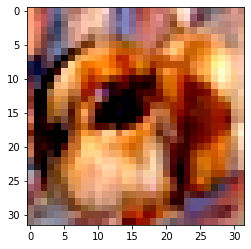

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


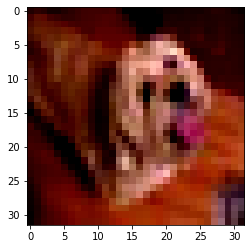

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


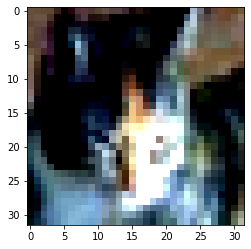

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


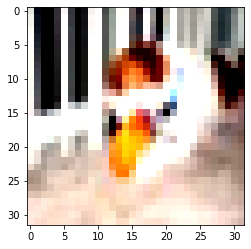

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


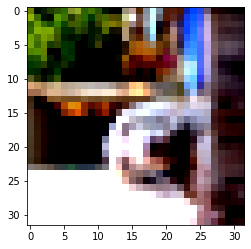

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


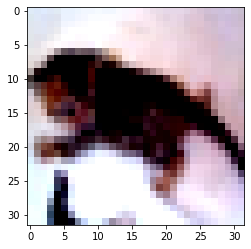

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


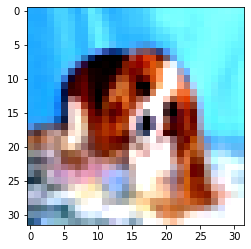

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


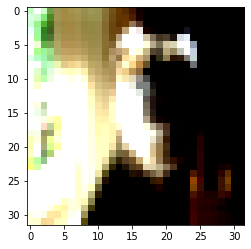

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


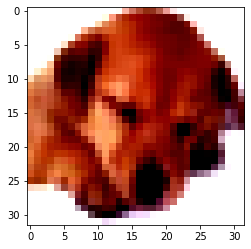

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


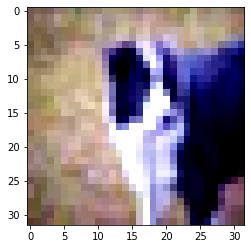

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


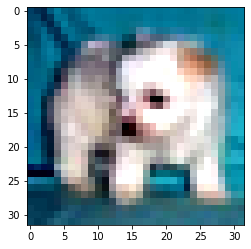

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


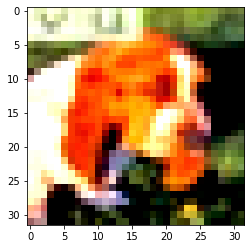

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


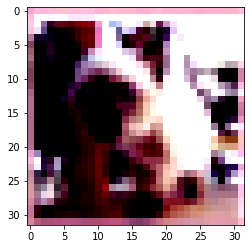

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


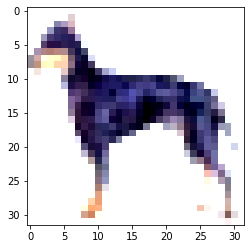

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


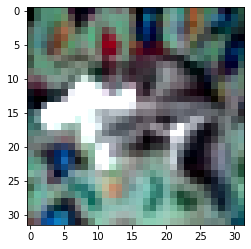

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


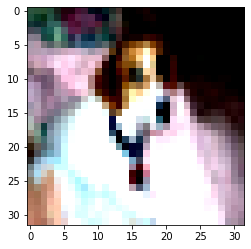

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


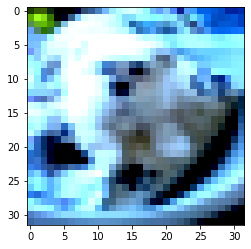

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


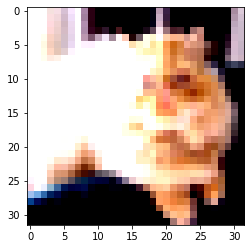

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


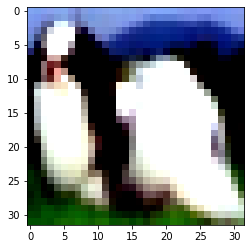

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


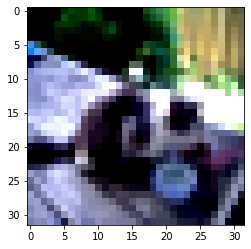

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


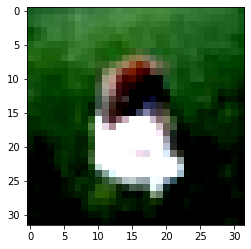

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


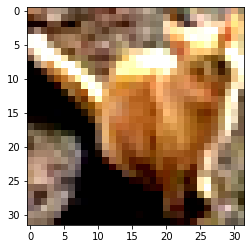

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


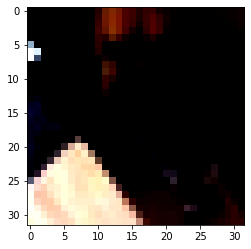

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


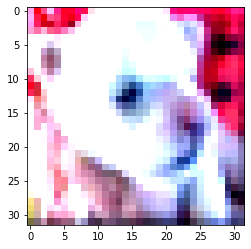

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


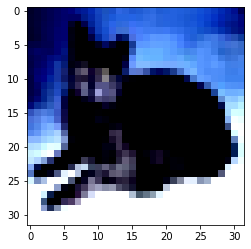

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


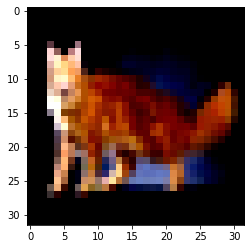

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


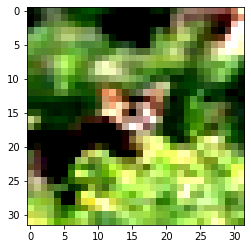

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


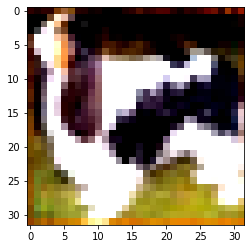

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


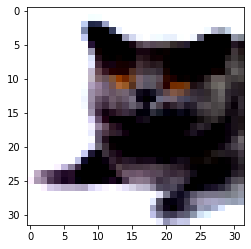

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


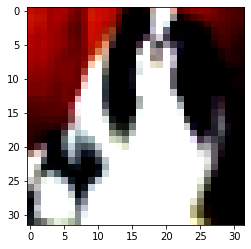

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


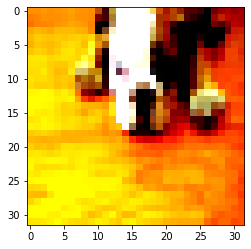

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


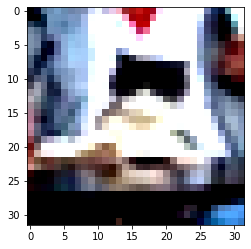

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


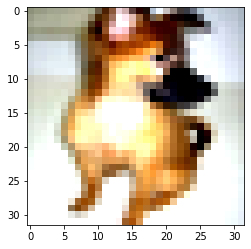

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


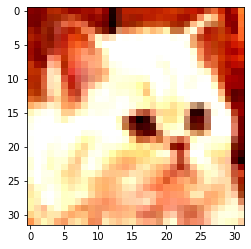

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


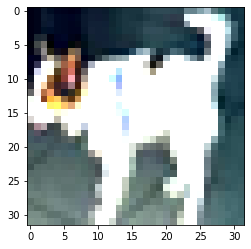

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


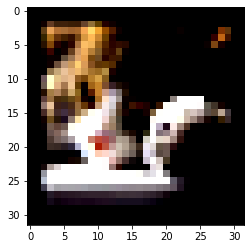

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


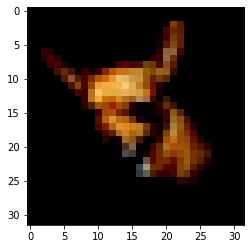

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


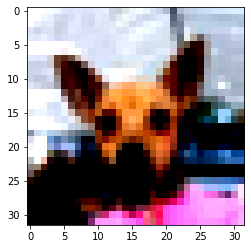

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


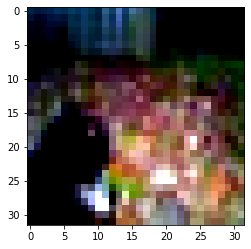

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


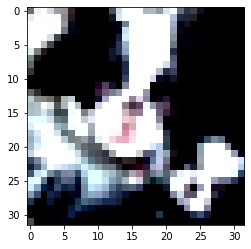

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


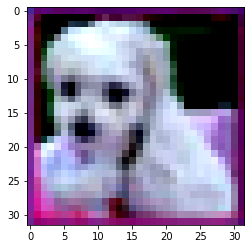

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


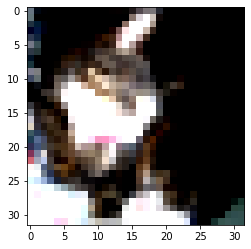

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


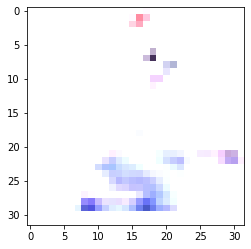

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


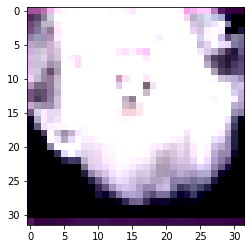

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


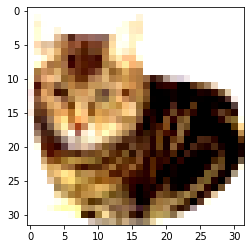

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


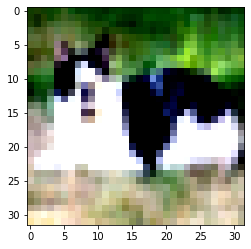

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


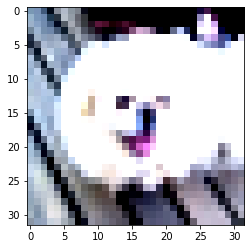

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


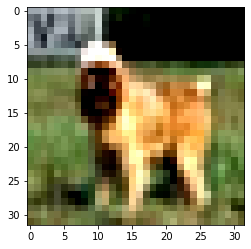

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


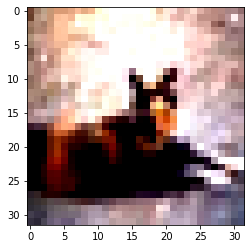

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


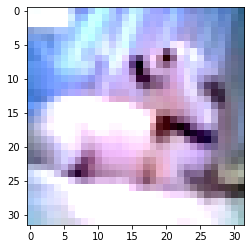

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


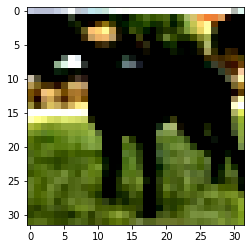

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


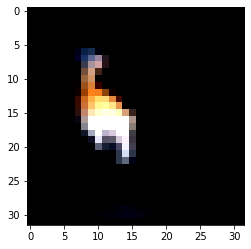

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


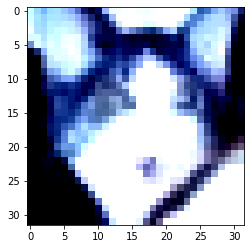

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


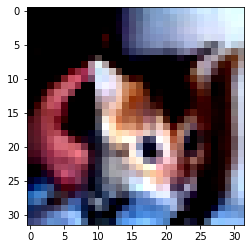

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


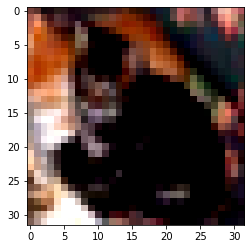

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


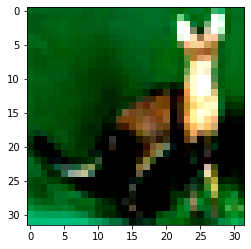

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


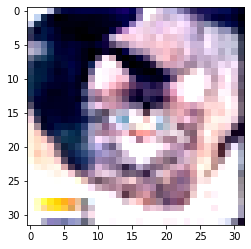

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


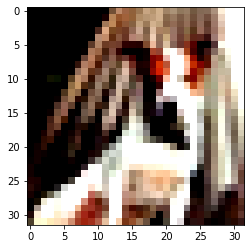

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


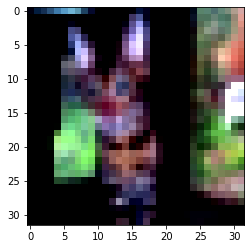

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


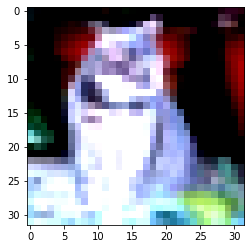

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


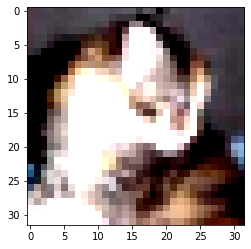

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


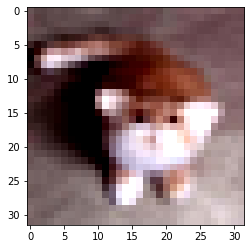

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


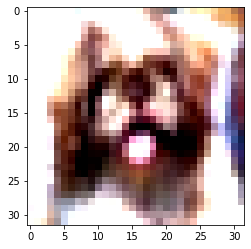

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


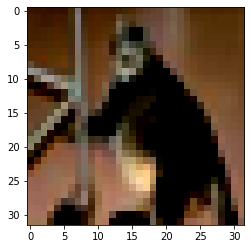

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


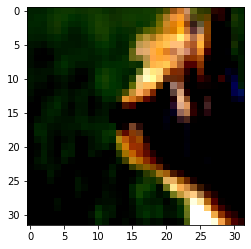

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


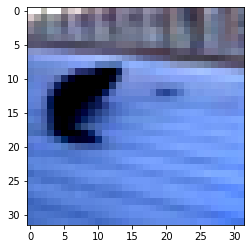

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


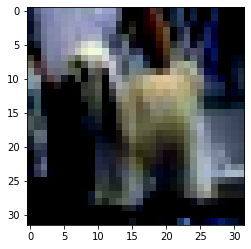

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


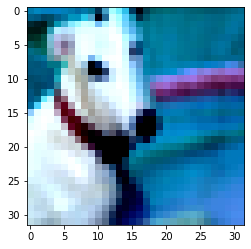

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


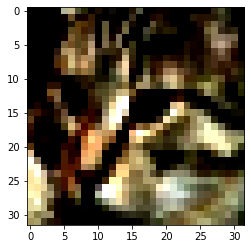

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


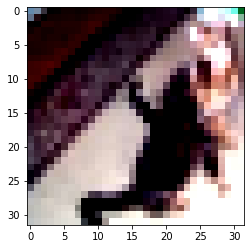

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


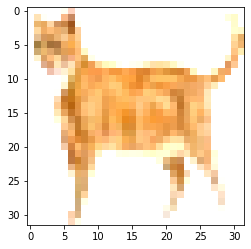

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


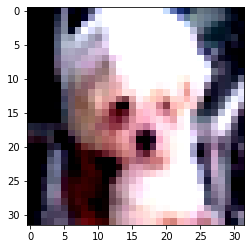

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


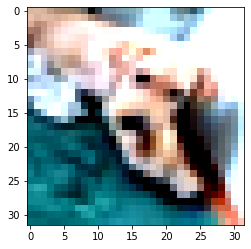

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


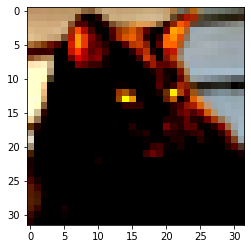

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


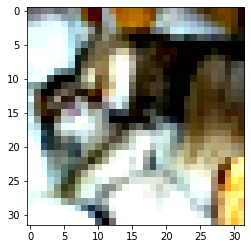

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


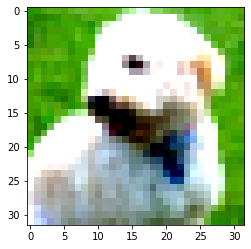

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


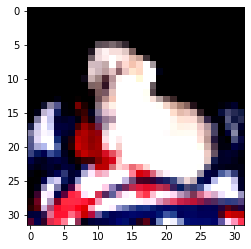

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


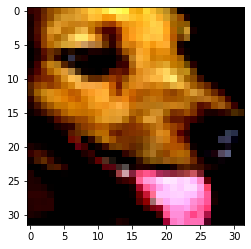

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


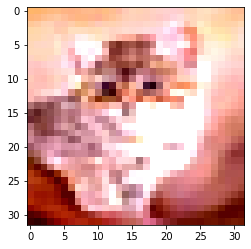

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


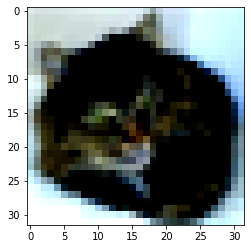

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


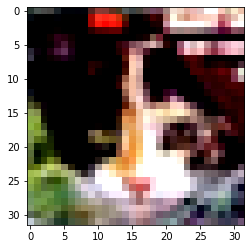

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


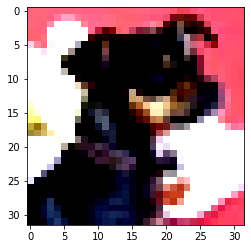

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


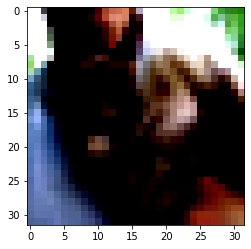

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


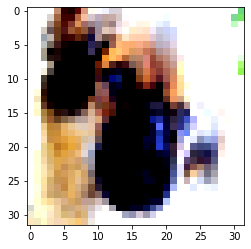

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


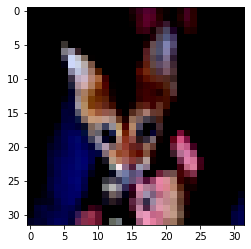

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


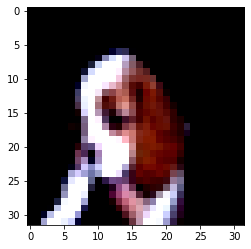

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


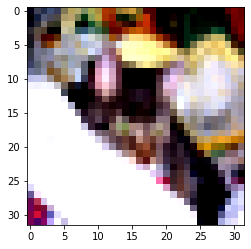

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


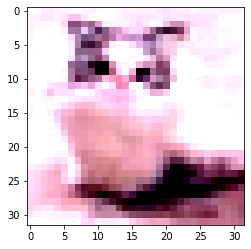

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


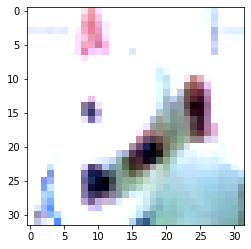

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


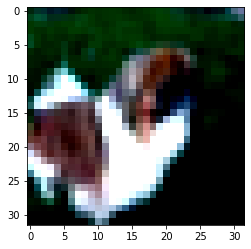

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


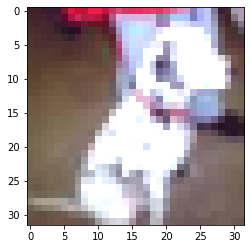

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


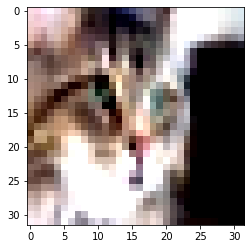

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


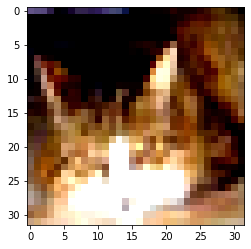

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


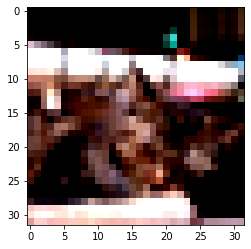

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


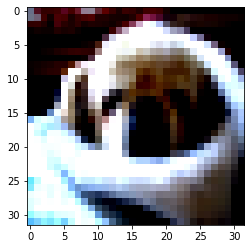

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


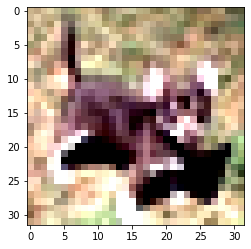

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


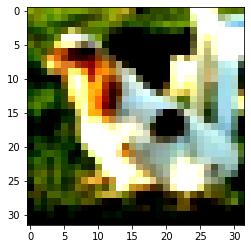

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


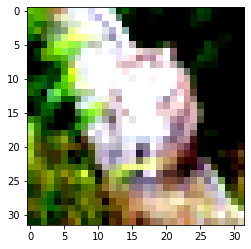

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


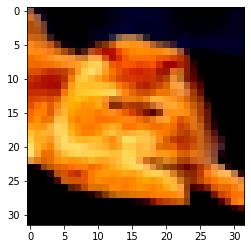

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


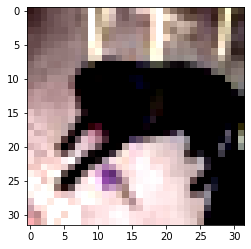

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


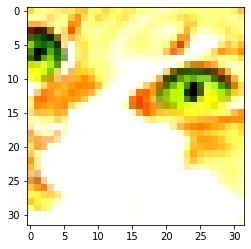

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


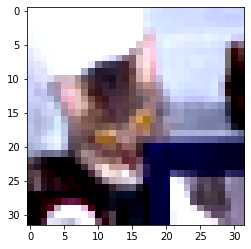

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


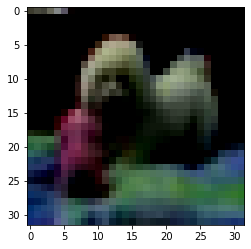

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


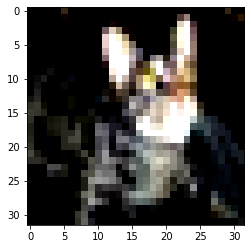

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


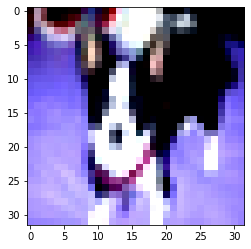

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


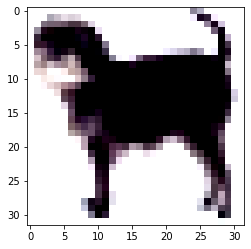

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


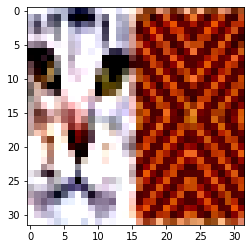

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


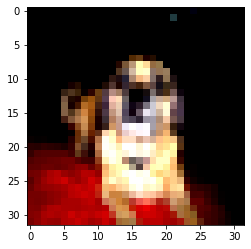

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


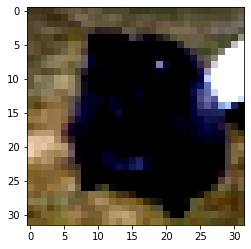

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


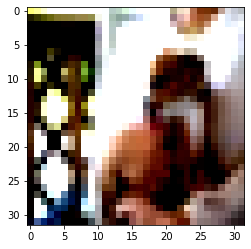

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


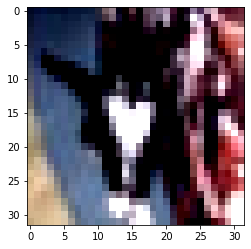

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


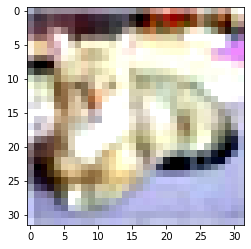

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


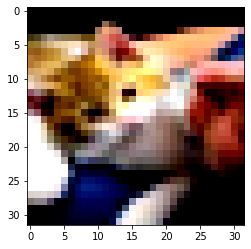

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


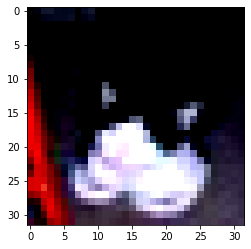

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


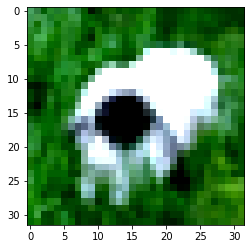

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


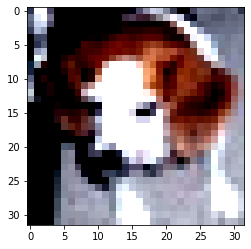

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


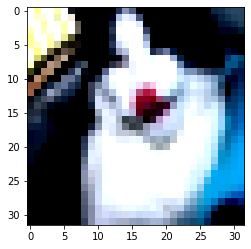

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


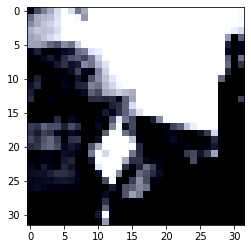

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


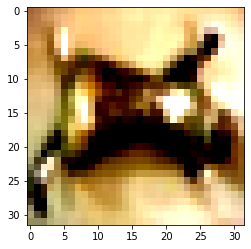

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


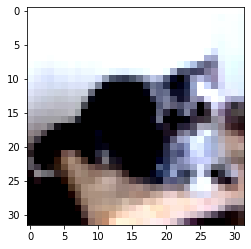

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


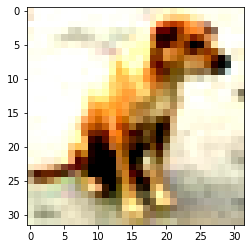

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


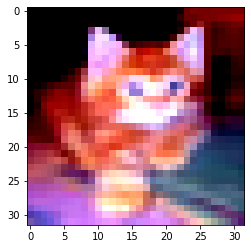

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


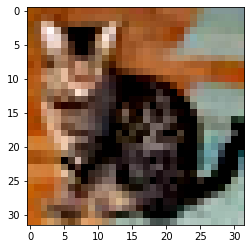

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


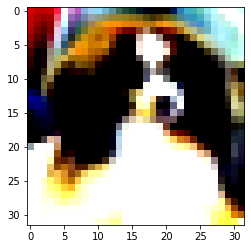

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


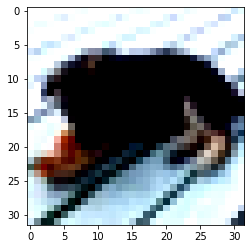

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


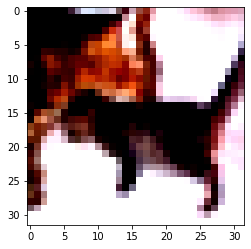

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


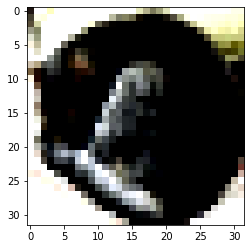

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


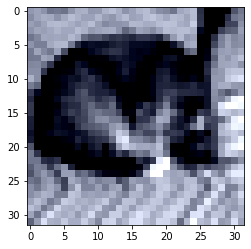

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


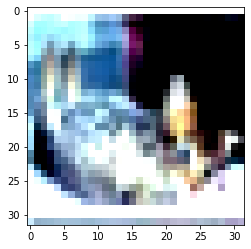

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


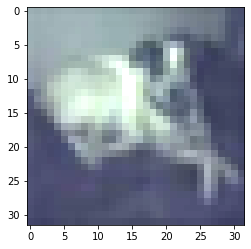

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


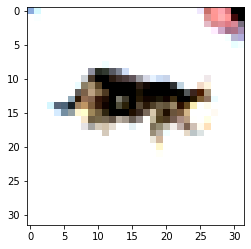

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


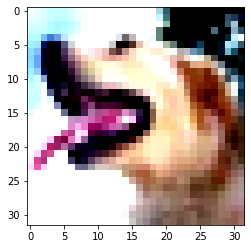

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


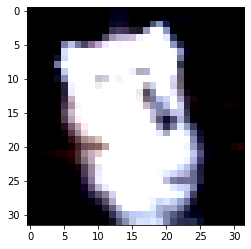

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


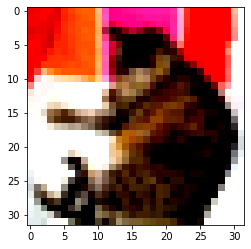

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


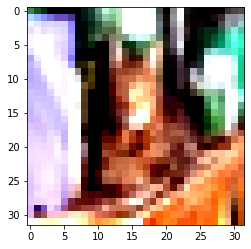

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


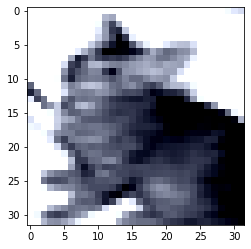

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


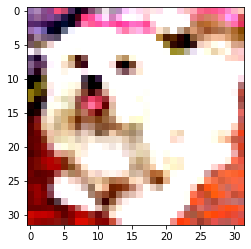

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


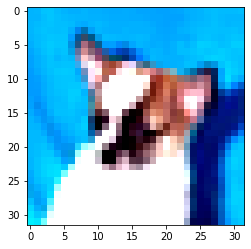

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


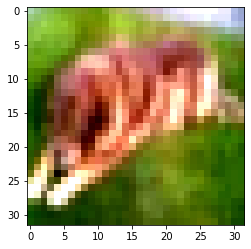

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


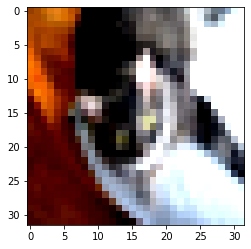

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


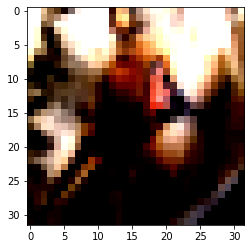

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


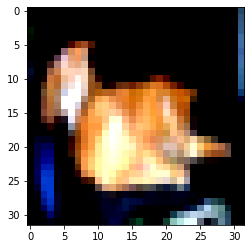

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


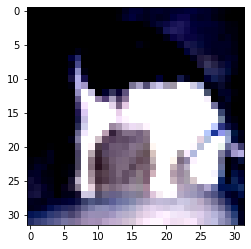

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


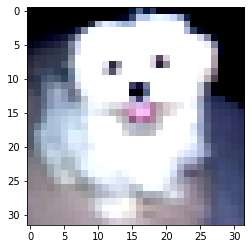

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


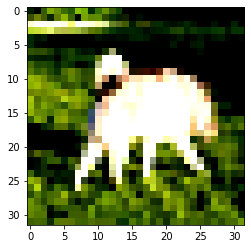

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


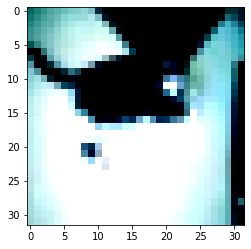

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


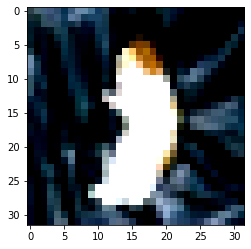

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


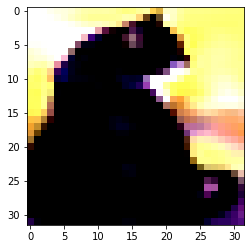

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


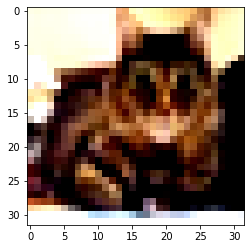

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


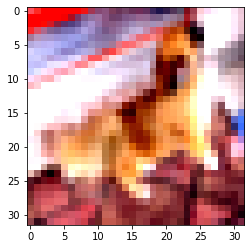

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


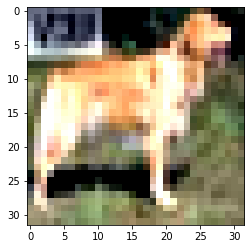

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


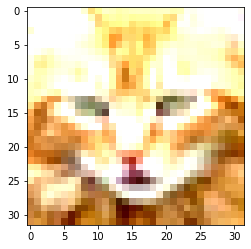

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


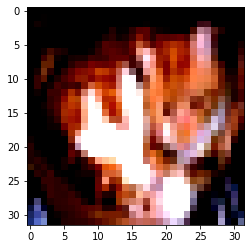

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


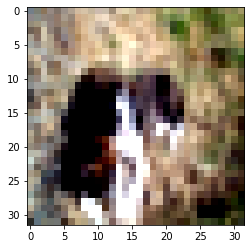

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


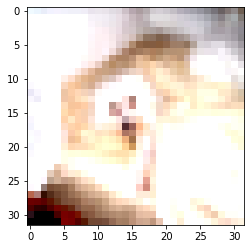

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


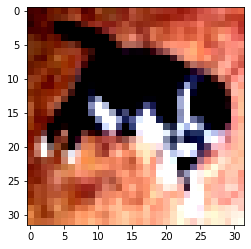

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


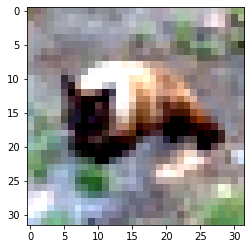

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


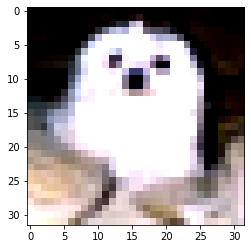

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


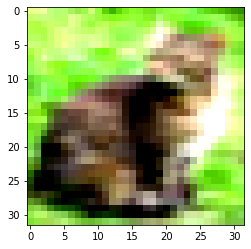

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


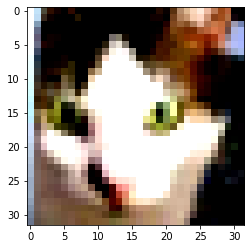

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


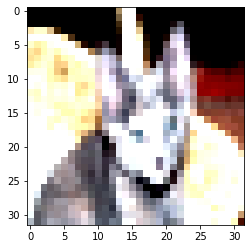

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


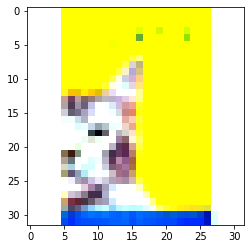

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


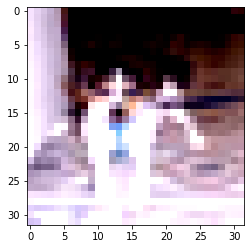

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


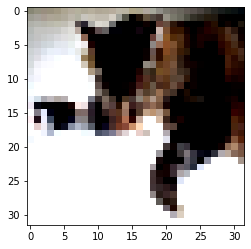

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


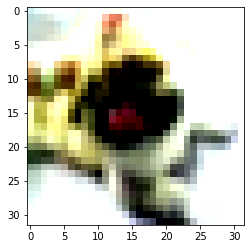

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


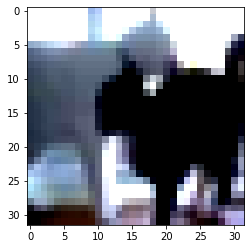

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


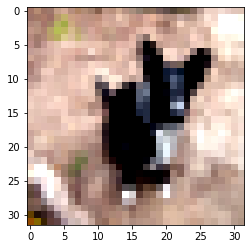

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


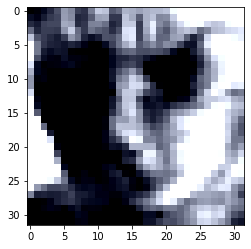

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


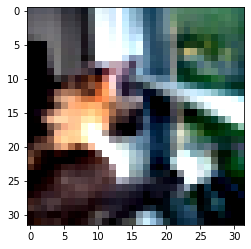

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


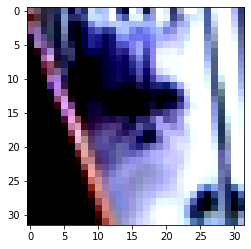

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


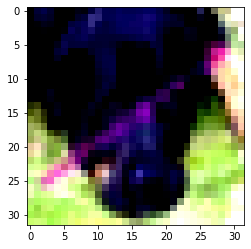

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


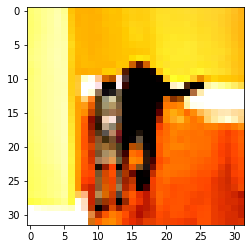

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


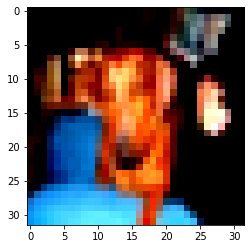

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


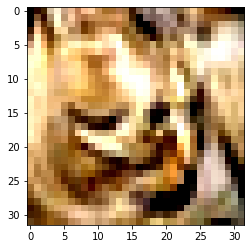

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


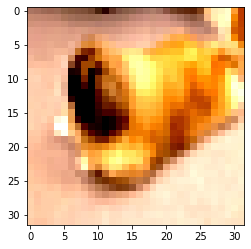

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


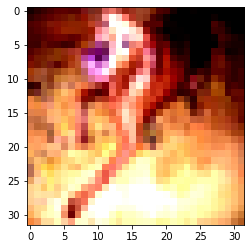

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


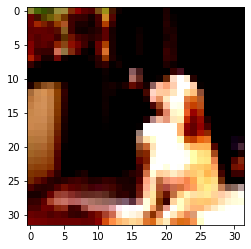

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


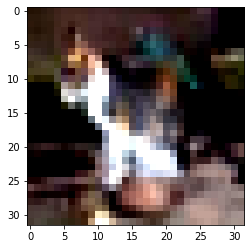

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


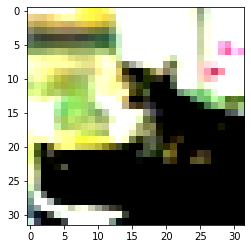

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


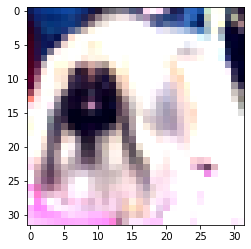

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


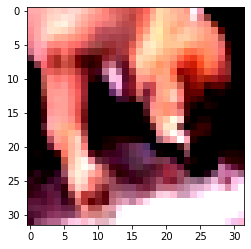

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


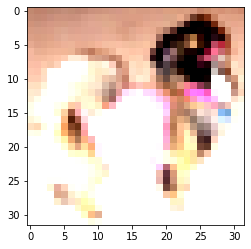

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


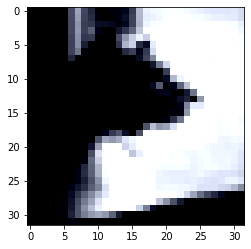

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


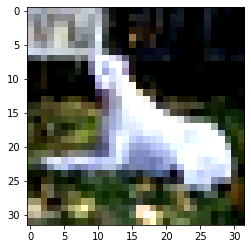

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


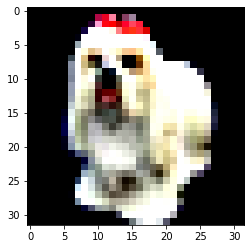

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


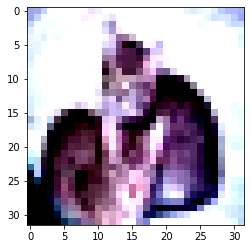

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


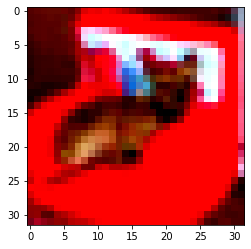

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


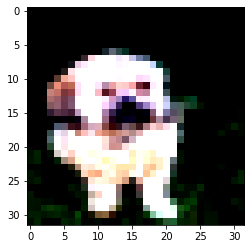

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


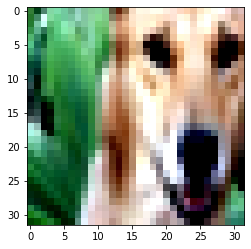

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


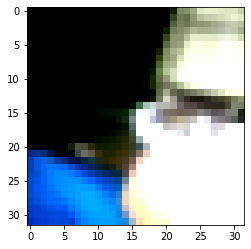

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


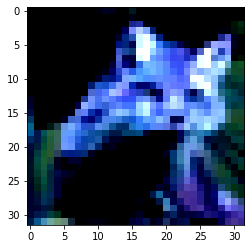

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


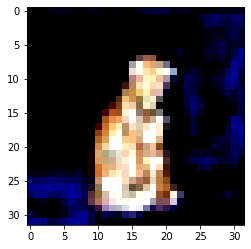

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


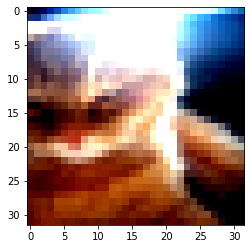

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


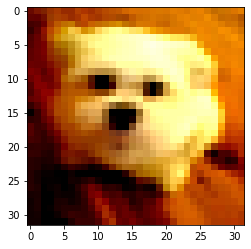

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


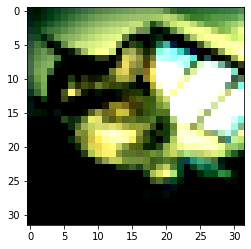

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


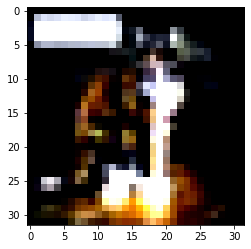

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


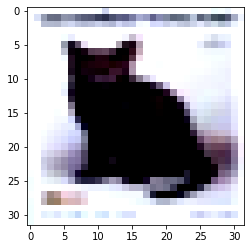

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


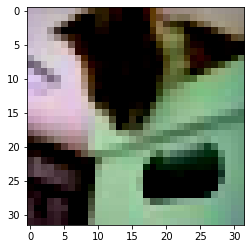

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


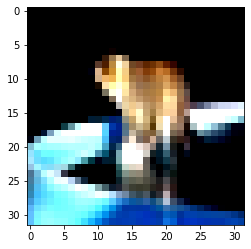

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


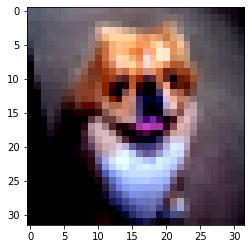

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


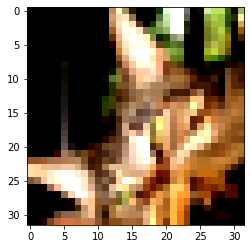

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


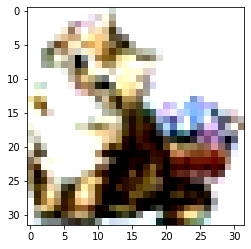

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


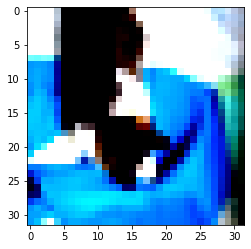

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


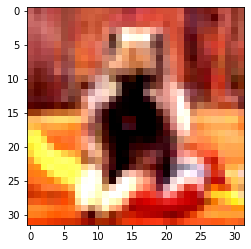

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


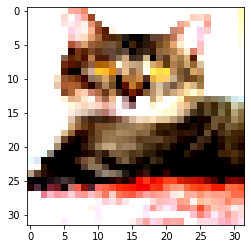

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


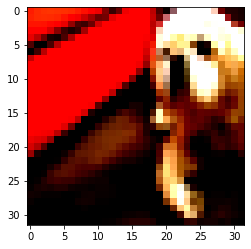

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


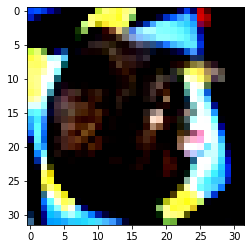

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


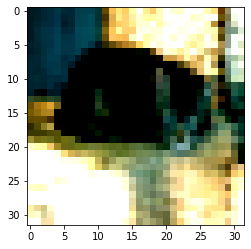

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


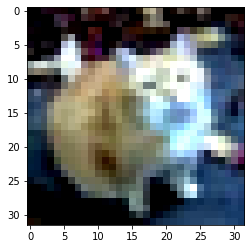

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


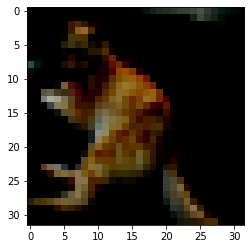

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


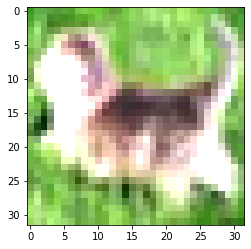

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


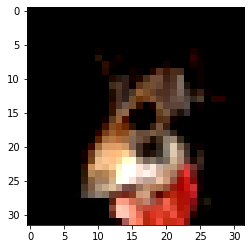

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


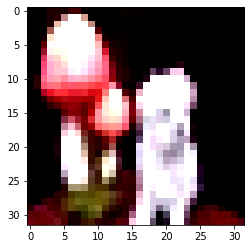

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


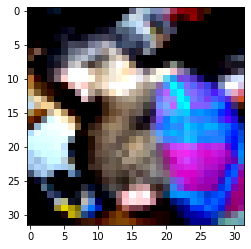

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


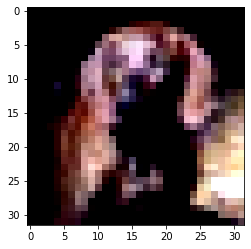

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


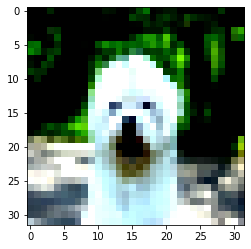

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


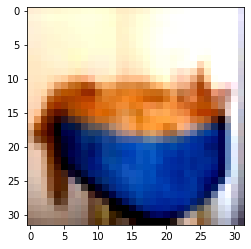

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


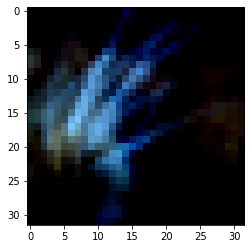

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


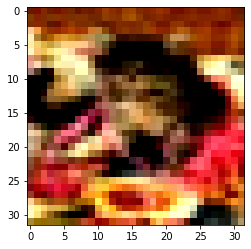

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


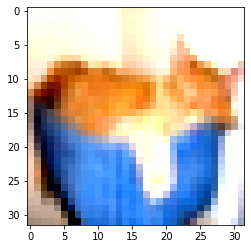

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


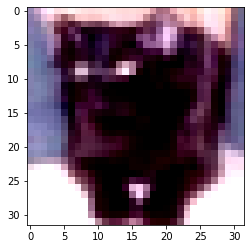

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


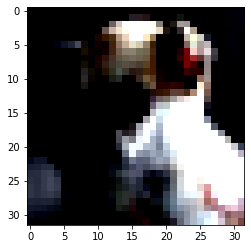

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


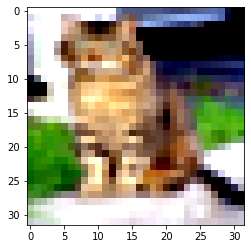

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


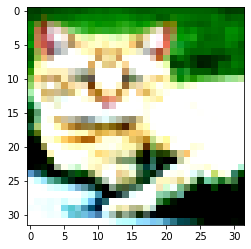

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


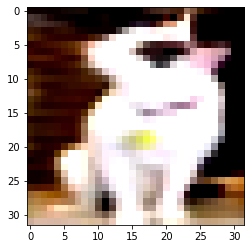

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


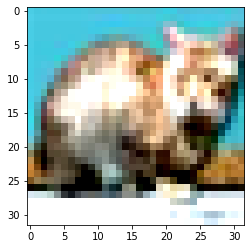

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


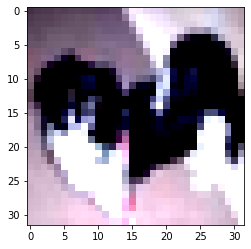

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


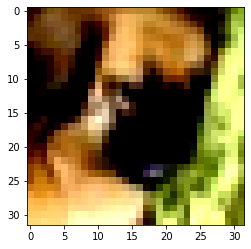

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


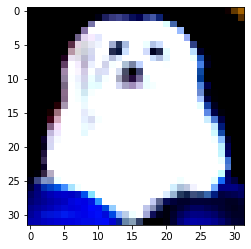

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


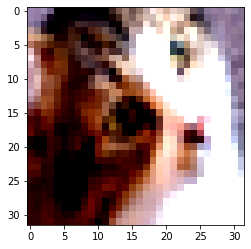

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


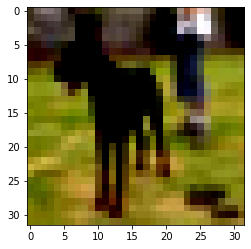

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


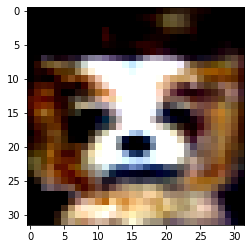

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


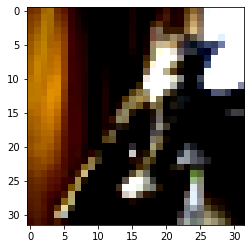

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


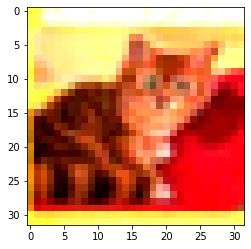

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


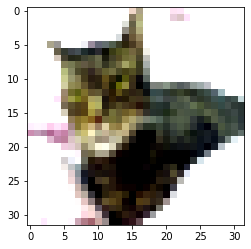

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


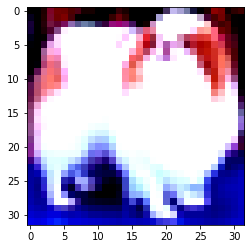

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


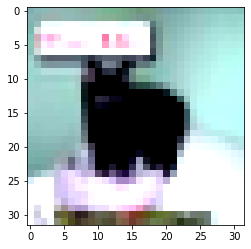

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


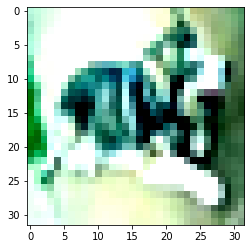

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


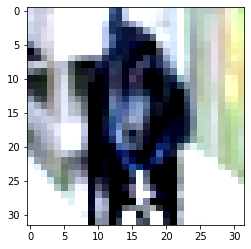

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


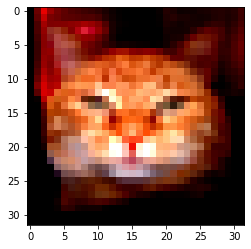

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


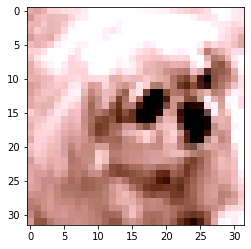

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


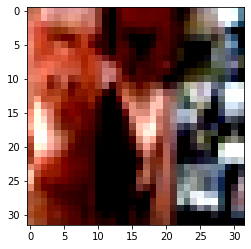

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


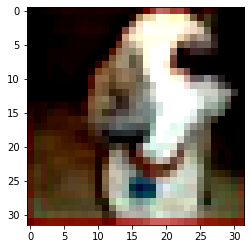

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


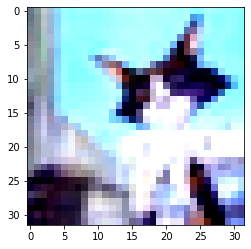

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


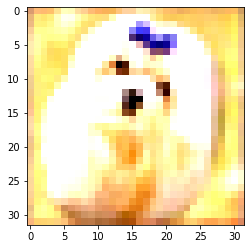

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


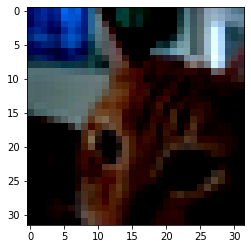

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


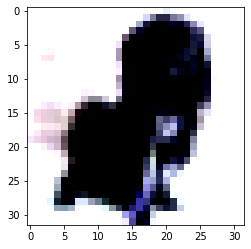

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


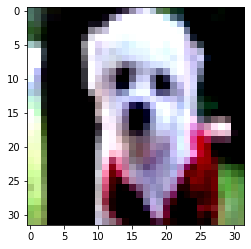

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


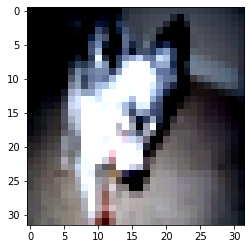

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


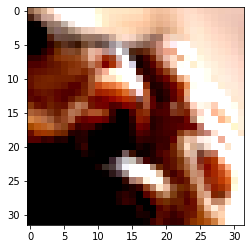

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


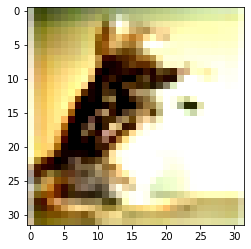

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


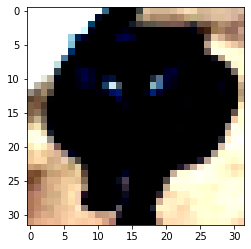

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


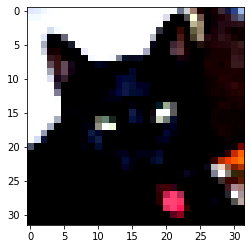

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


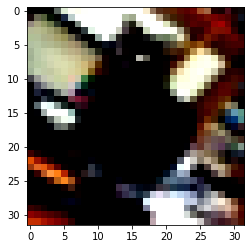

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


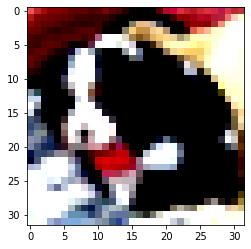

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


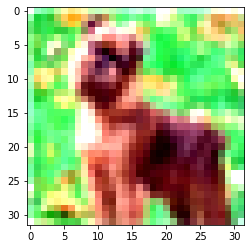

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


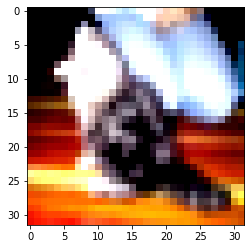

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


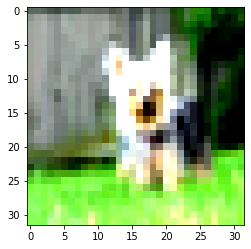

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


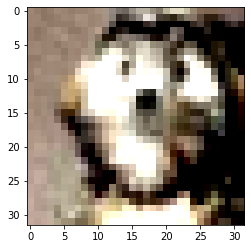

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


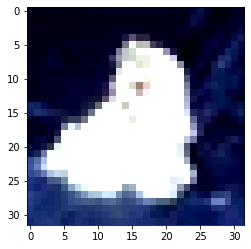

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


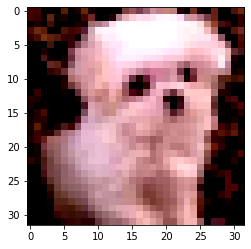

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


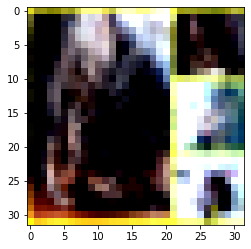

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


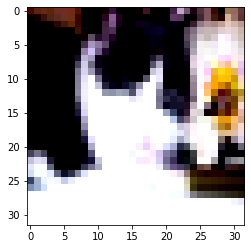

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


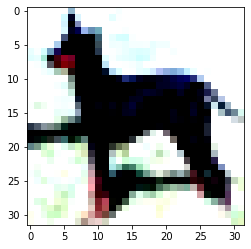

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


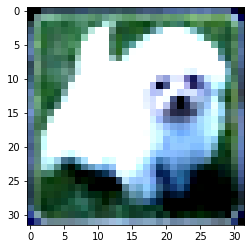

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


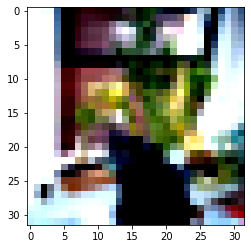

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


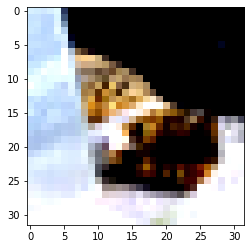

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


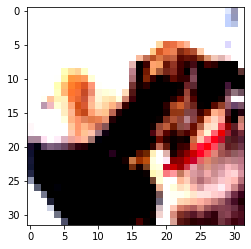

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


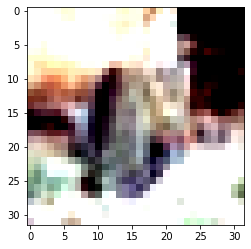

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


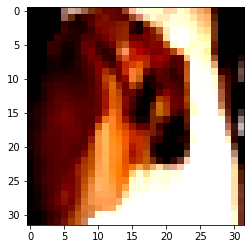

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


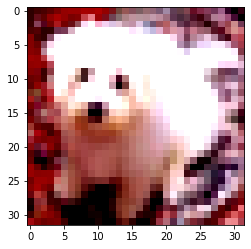

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


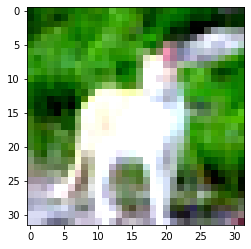

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


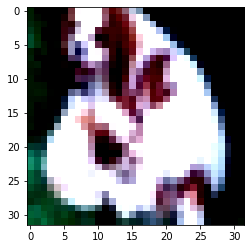

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


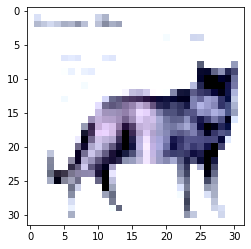

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


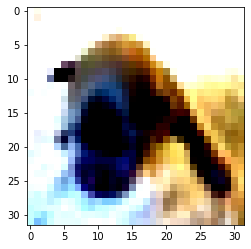

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


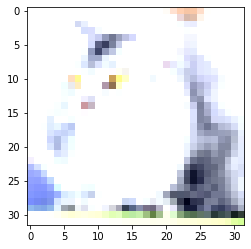

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


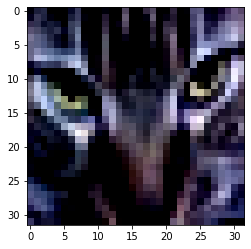

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


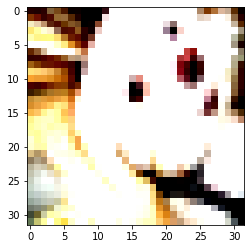

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


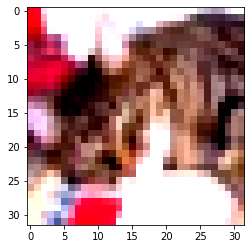

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


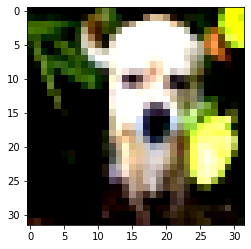

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


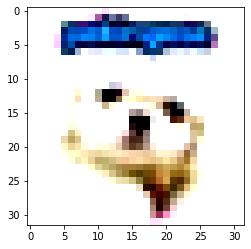

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


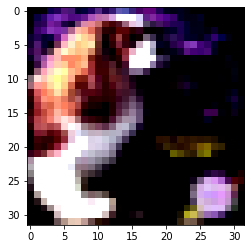

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


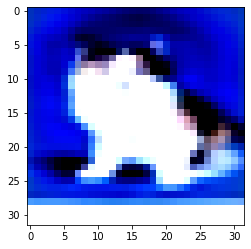

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


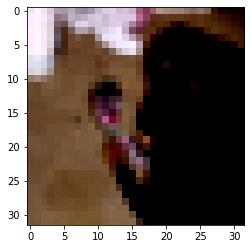

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


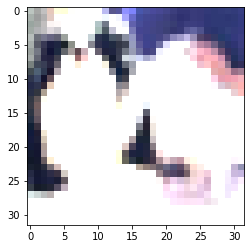

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


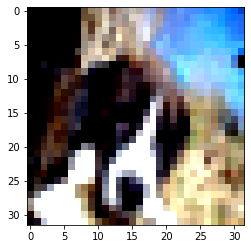

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


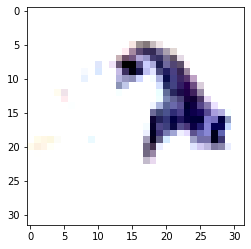

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


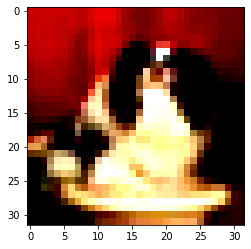

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


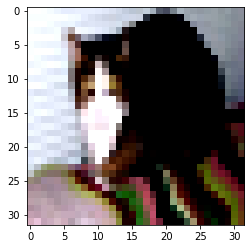

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


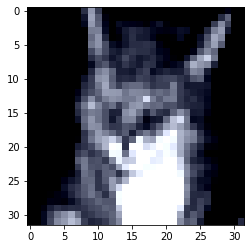

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


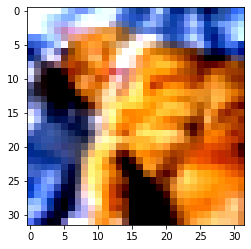

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


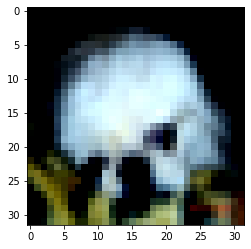

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


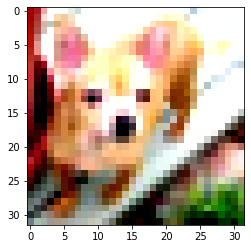

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


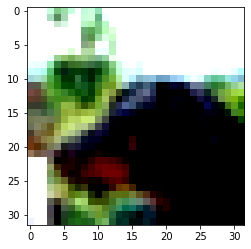

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


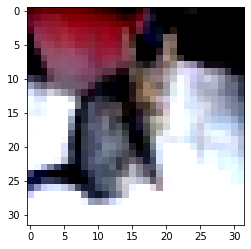

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


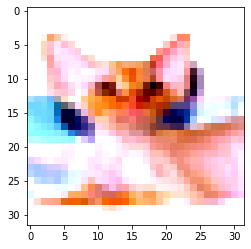

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


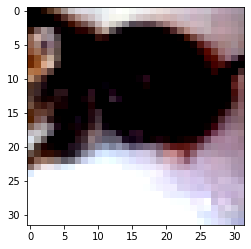

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


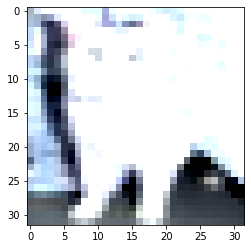

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


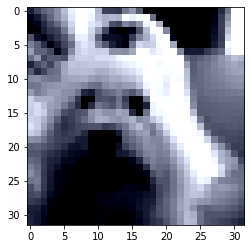

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


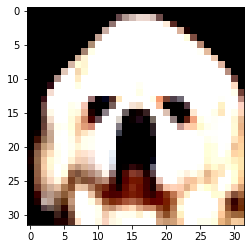

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


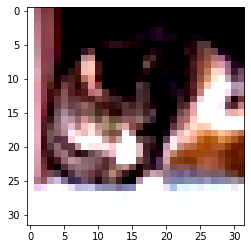

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


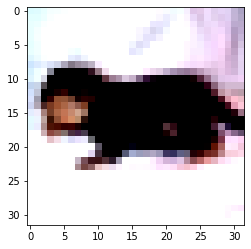

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


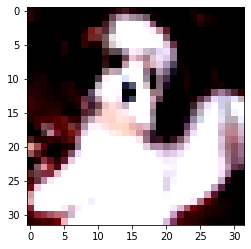

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


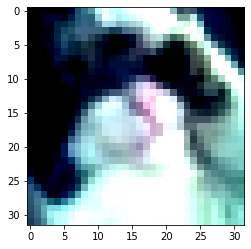

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


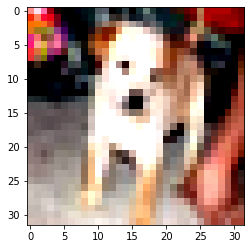

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


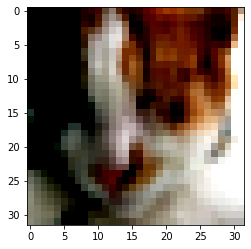

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


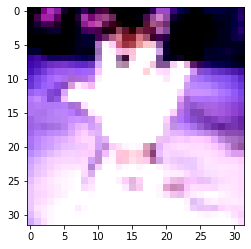

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


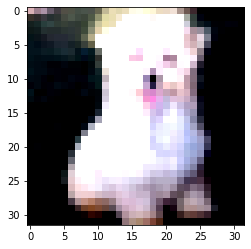

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


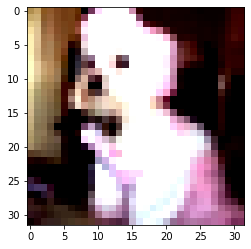

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


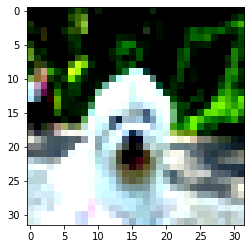

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


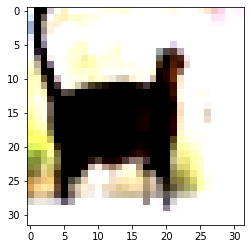

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


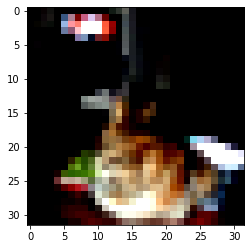

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


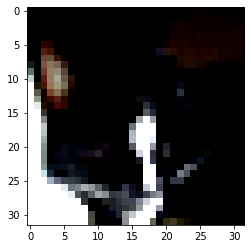

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


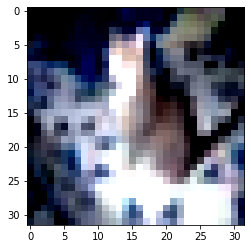

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


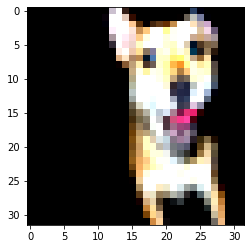

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


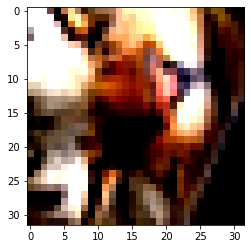

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


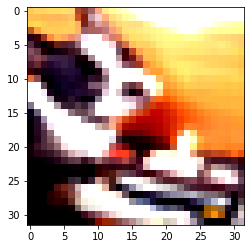

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


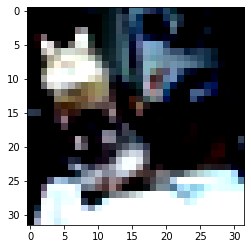

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


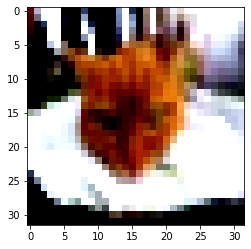

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


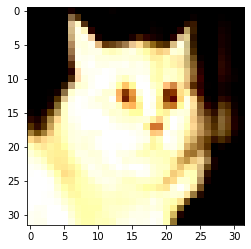

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


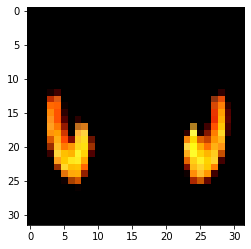

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


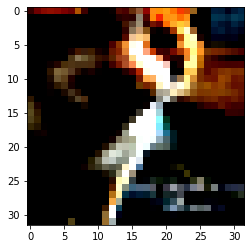

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


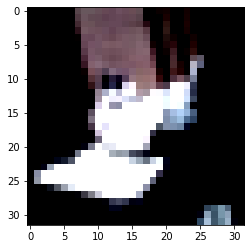

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


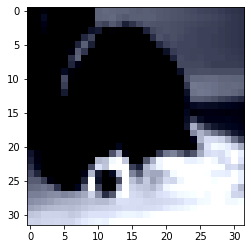

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


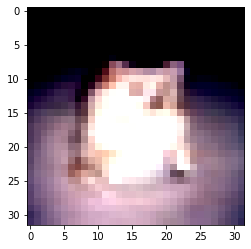

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


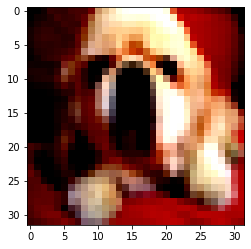

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


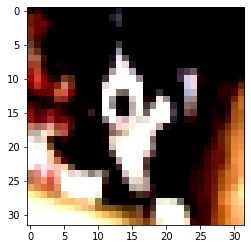

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


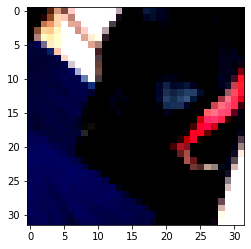

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


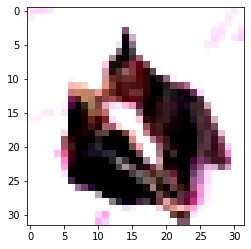

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


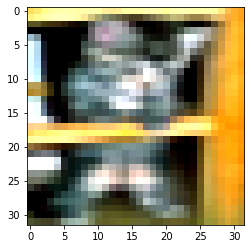

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


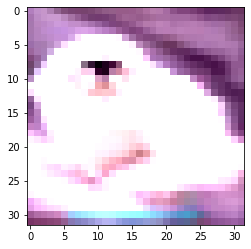

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


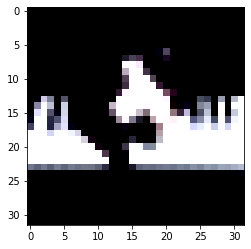

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


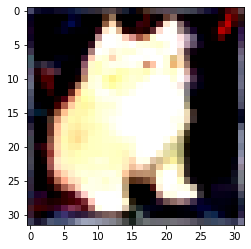

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


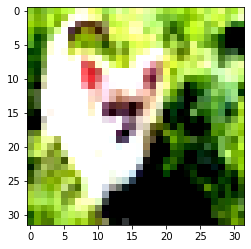

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


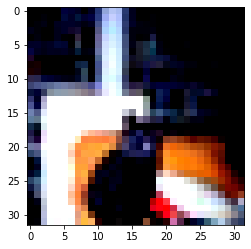

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


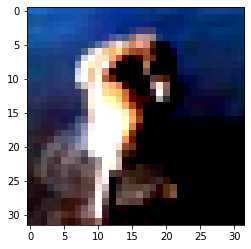

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


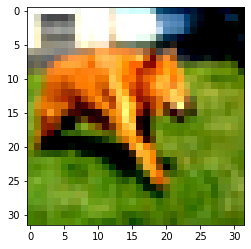

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


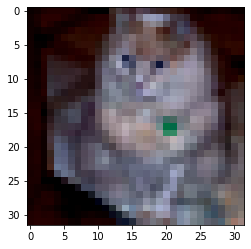

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


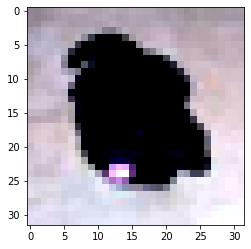

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


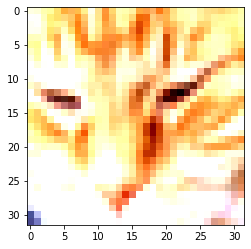

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


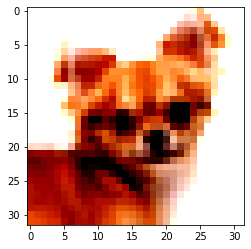

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


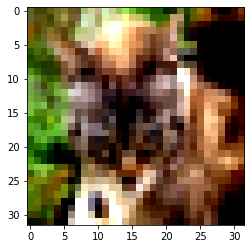

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


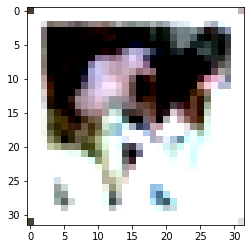

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


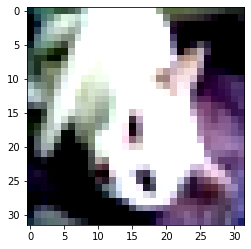

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


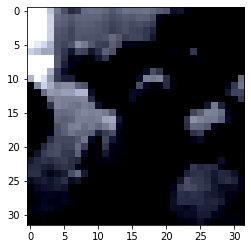

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


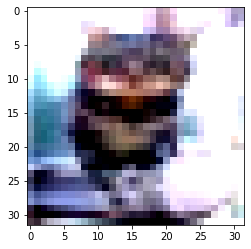

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


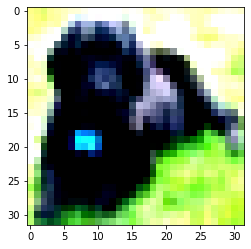

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


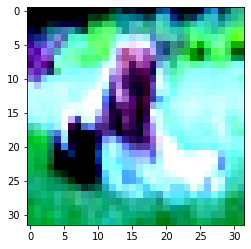

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


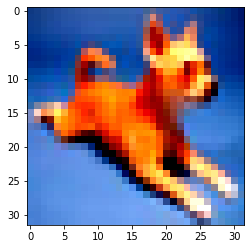

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


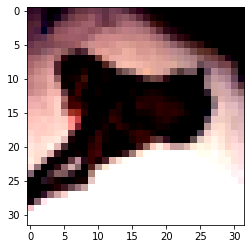

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


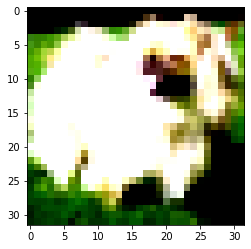

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


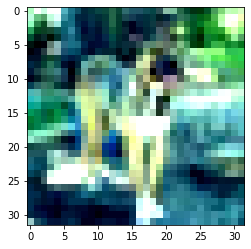

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


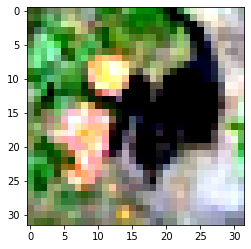

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


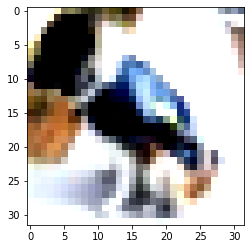

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


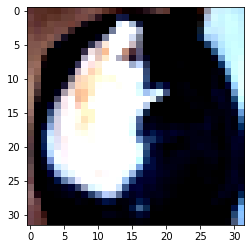

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


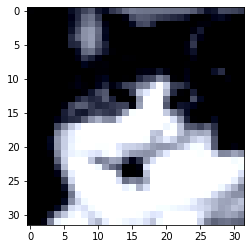

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


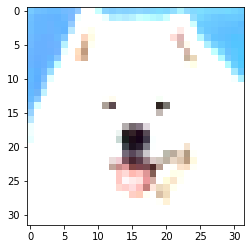

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


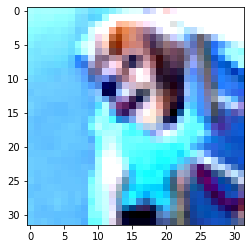

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


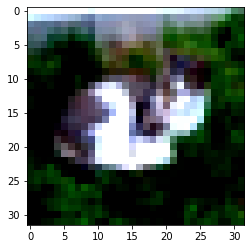

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


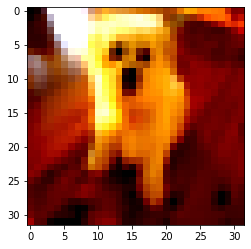

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


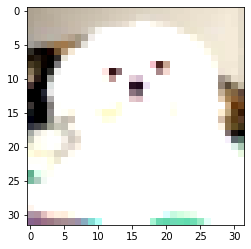

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


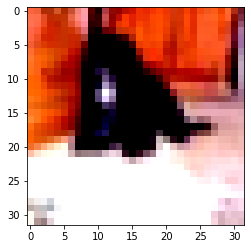

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


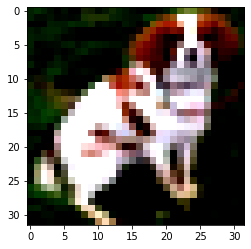

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


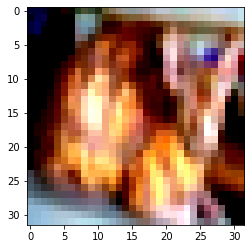

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


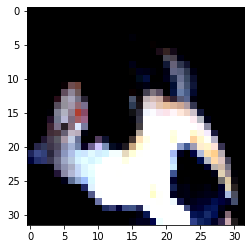

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


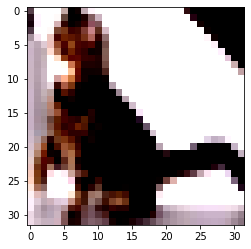

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


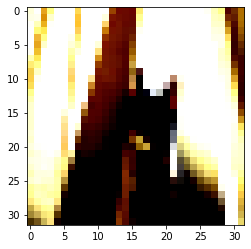

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


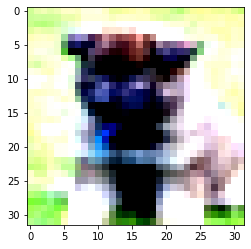

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


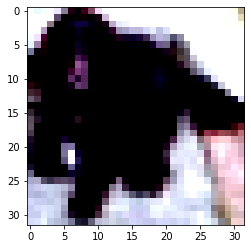

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


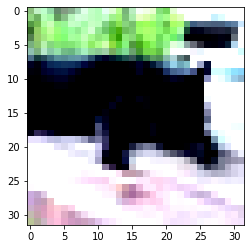

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


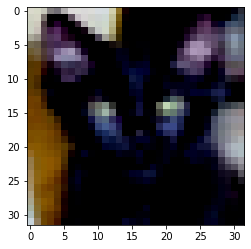

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


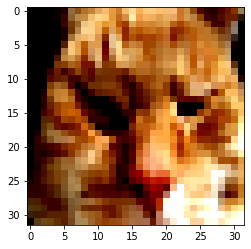

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


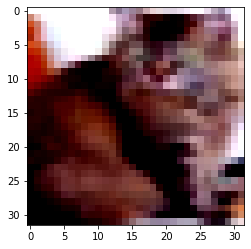

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


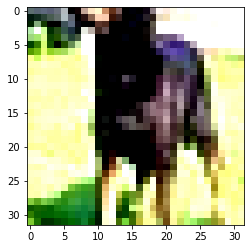

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


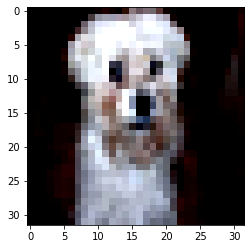

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


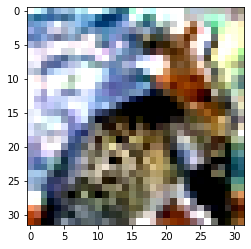

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


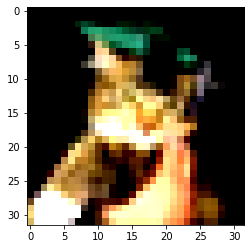

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


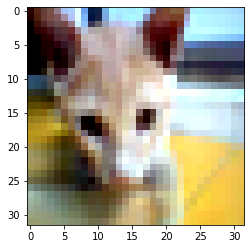

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


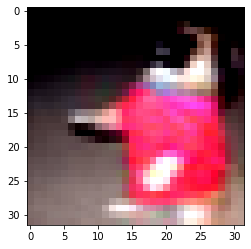

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


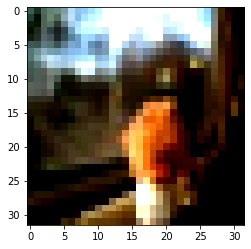

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


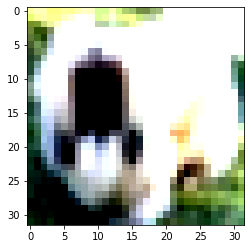

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


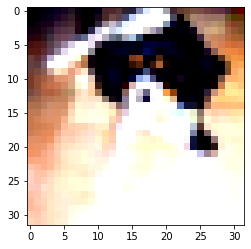

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


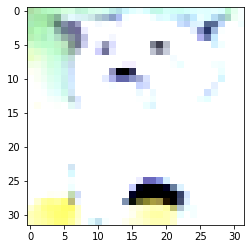

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


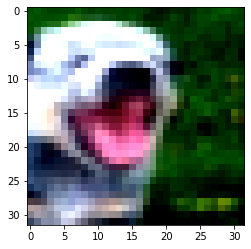

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


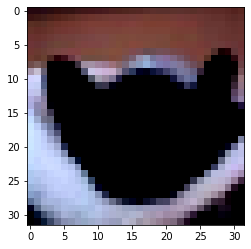

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


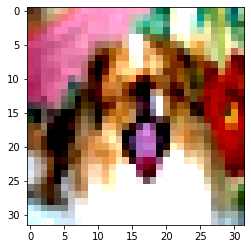

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


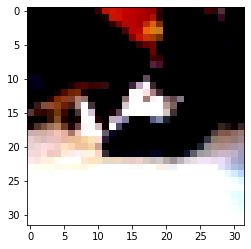

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


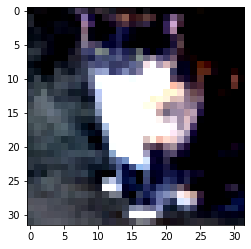

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


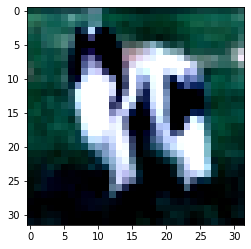

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


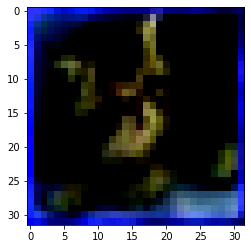

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


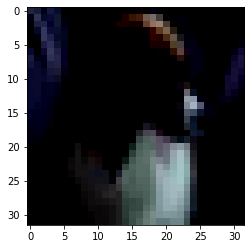

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


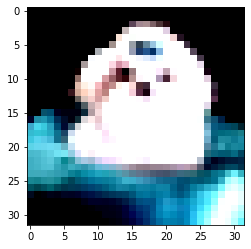

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


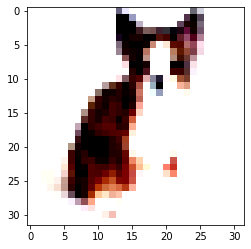

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


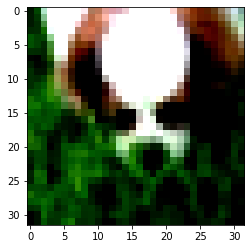

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


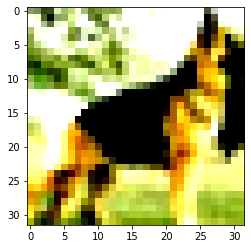

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


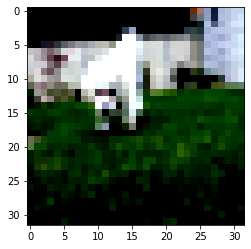

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


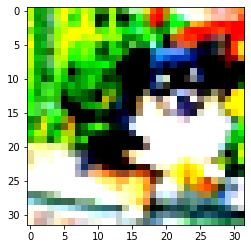

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


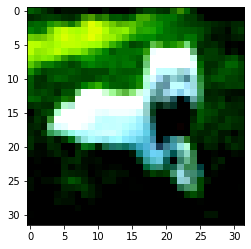

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


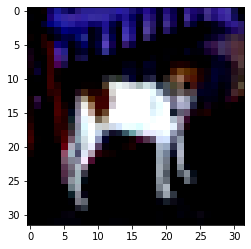

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


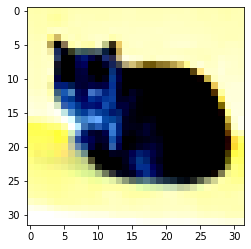

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


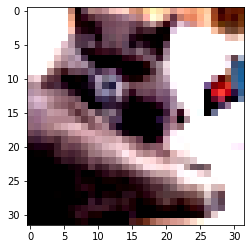

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


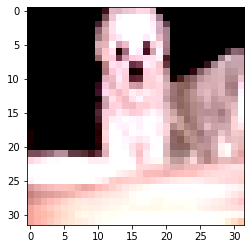

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


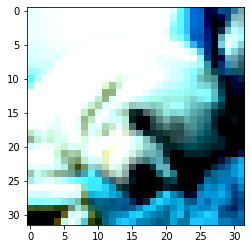

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


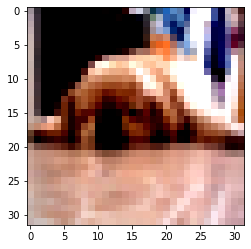

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


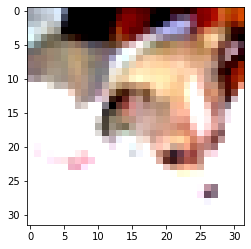

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


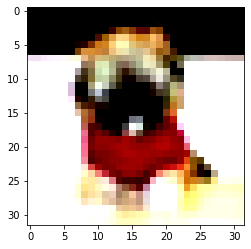

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


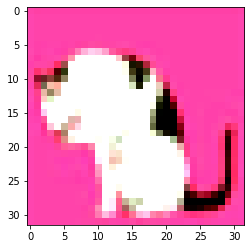

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


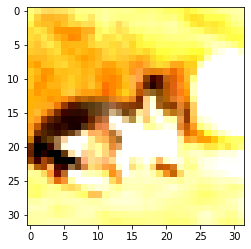

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


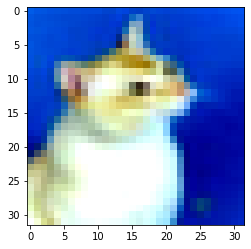

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


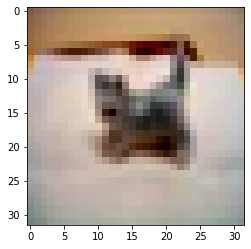

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


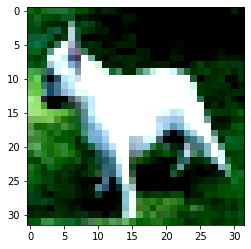

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


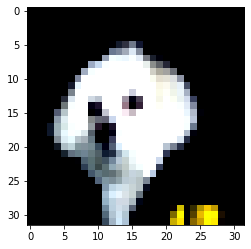

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


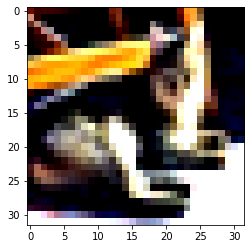

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


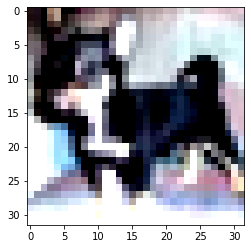

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


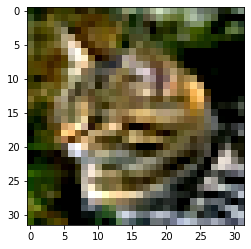

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


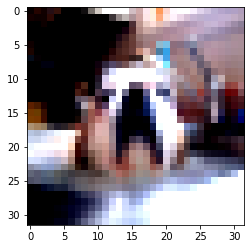

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


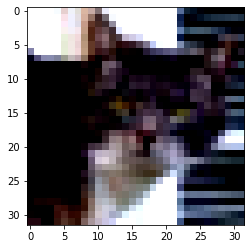

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


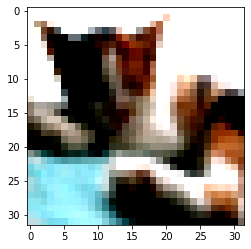

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


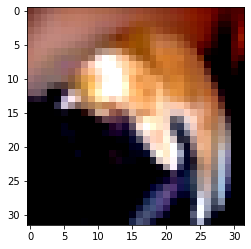

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


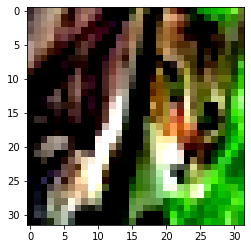

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


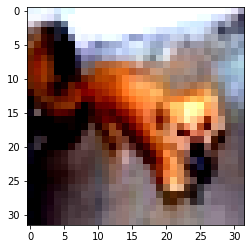

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


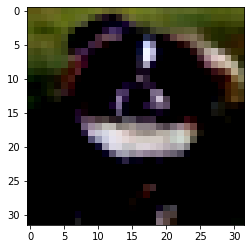

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


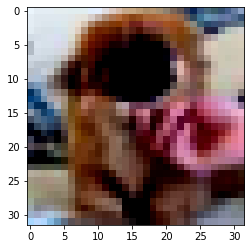

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


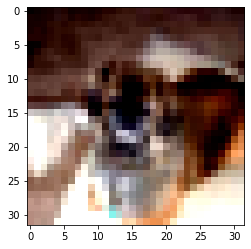

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


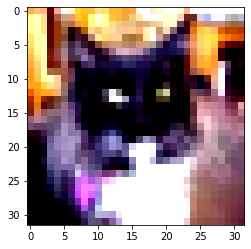

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


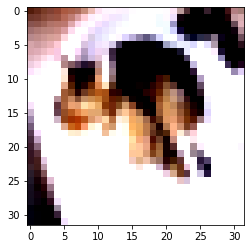

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


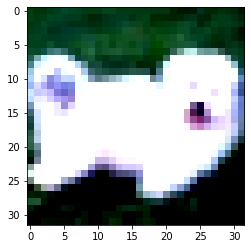

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


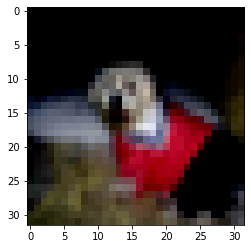

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


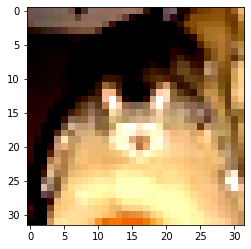

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


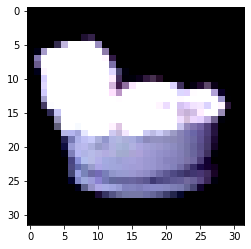

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


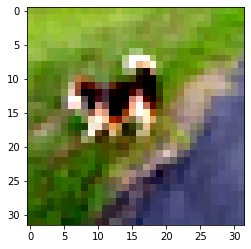

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


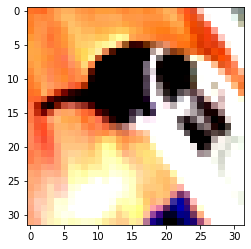

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


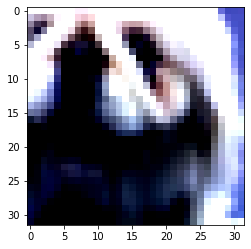

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


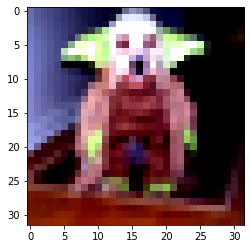

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


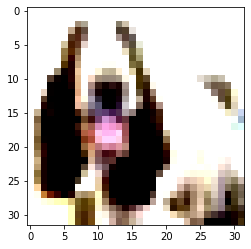

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


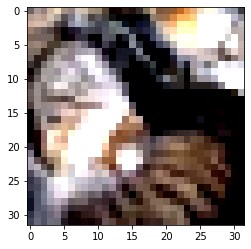

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


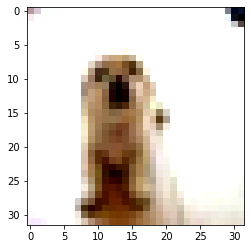

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


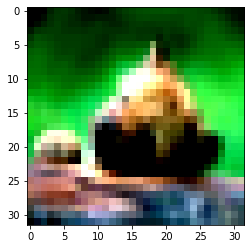

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


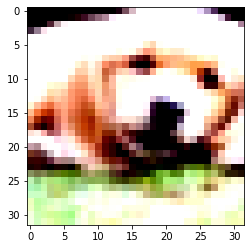

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


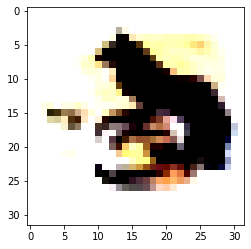

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


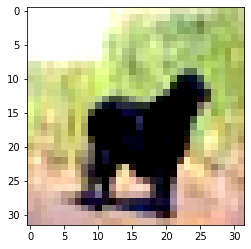

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


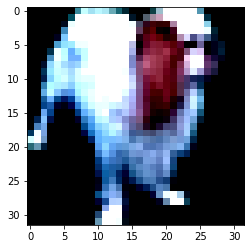

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


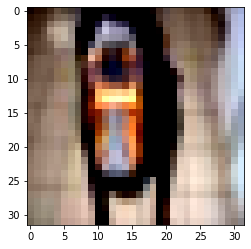

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


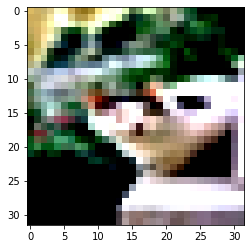

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


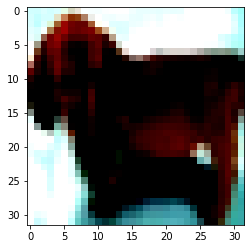

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


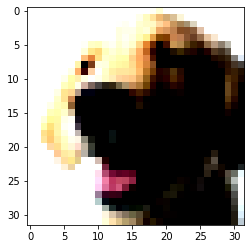

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


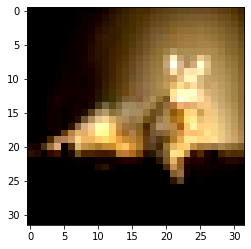

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


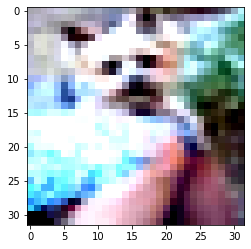

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


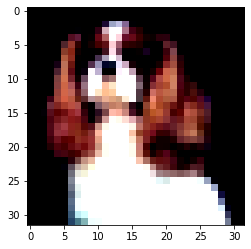

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


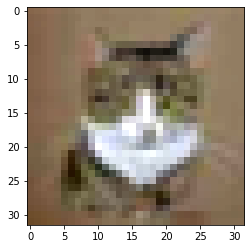

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


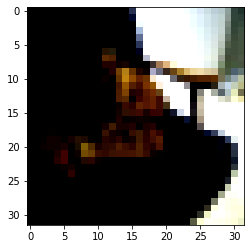

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


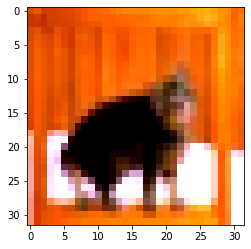

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


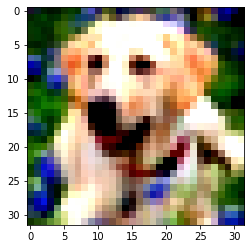

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


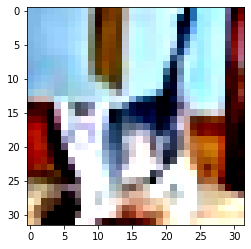

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


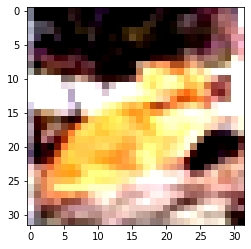

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


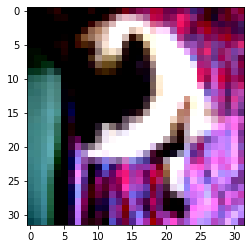

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


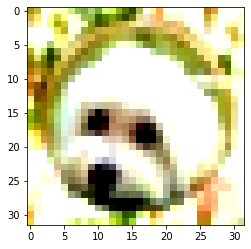

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


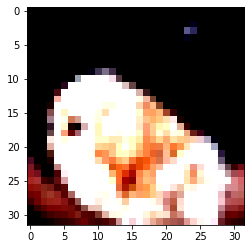

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


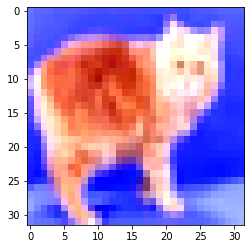

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


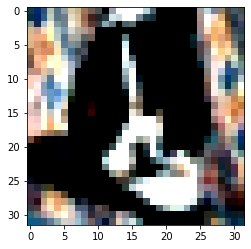

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


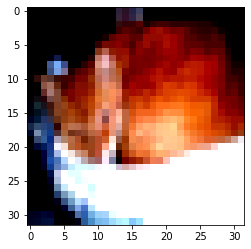

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


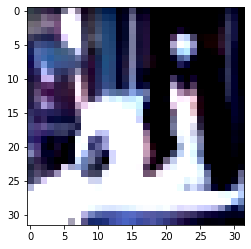

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


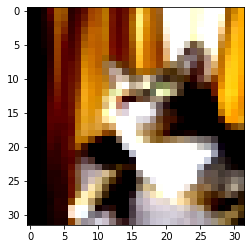

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 predicted cat


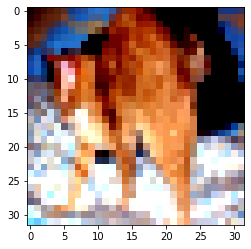

 predicted cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


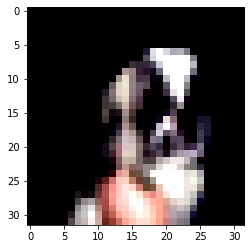

 predicted cat


In [0]:
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=False, num_workers=2)
checkpoint = torch.load('./checkpoint/adamckpt_change4.pth')
net.load_state_dict(checkpoint['net'])

count=0

with torch.no_grad():
    
        for batch_idx, (inputs, targets) in enumerate(testloader):
            
            if(targets.numpy()[0]==3)|(targets.numpy()[0]==5):
              
                imshow(torchvision.utils.make_grid(inputs))
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = net(inputs)
                
                out=list(outputs.cpu().numpy()[0])

                print(" predicted",classes[out.index(max(out))])